In [1]:
import os
import csv
import optuna
import numpy as np
import pandas as pd
from tensorflow import keras
from tensorflow.keras.optimizers import Adam, RMSprop, SGD
import tensorflow as tf
from keras.models import Sequential
from keras.layers import Input, LSTM, Dense, Activation, Dropout
from pandas import DataFrame
from pandas import Series
from pandas import concat
from pandas import read_csv
from datetime import datetime
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import KFold
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from math import sqrt
from matplotlib import pyplot as plt
from matplotlib.patches import Patch
from numpy import array
import keras.backend as K
import itertools
#!pip install pydot

# date-time parsing function for loading the dataset
def parser(x):
    return datetime.strptime('190'+x, '%Y-%m')
    
def rmse (y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))
    
def mape (y_true, y_pred):
    return 100*K.mean(K.sqrt(K.square(y_true - y_pred))/y_true)
    
def pearson (y_true, y_pred):
    return (K.square(K.mean((y_true - K.mean(y_true))*(y_pred - K.mean(y_pred)))))/(K.mean(K.square(y_true - K.mean(y_true)))*K.mean(K.square(y_pred - K.mean(y_pred))))
    
# convert time series into a supervised learning problem
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
# convert time series into a supervised learning problem
def series_to_supervised(data, n_in=1, n_out=1, dropnan=True):

    n_vars = 1 if type(data) is list else data.shape[1]
    cols, names = list(), list()
    df = DataFrame(data)
    # input sequence (t-n, ... t-1)
    for i in range(n_in, 0, -1):
    	cols.append(df.shift(i))
    	names += [('var%d(t-%d)' % (j+1, i)) for j in range(n_vars)]
    # forecast sequence (t, t+1, ... t+n)
    for i in range(0, n_out):
        cols.append(df[0].shift(-i)) # df[0] for specific humidity
        if i == 0:
            names += [('var%d(t)' % (1))] # % (1) for specific humidity
        else:            
            names += [('var%d(t+%d)' % (1, i))] # % (1) for specific humidity
    
    # put it all together
    agg = concat(cols, axis=1)

    if dropnan:
        #Drop rows containing NaN
        agg.dropna(inplace=True)

    agg.columns = names

    return agg
     
# create a differenced series
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def difference(dataset, interval=1):
    diff = list()
    for i in range(interval, len(dataset)):
        value = dataset[i] - dataset[i - interval]
        diff.append(value)
    return Series(diff)
     
# transform series into training sets for supervised learning
def prepare_training_data(data, n_lag, n_seq, n_time_steps):
    
    #Prepare data for time series forecasting.
        
    #Parameters:
    #x (array-like): Input features.
    #y (array-like): Target values.
    #n_test (int): Number of test samples (rows).
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations.
    #n_train (int): Number of training samples (rows).
        
    #Returns:
    #tuple: Training and test datasets.
    
    n_vars = len(data[0][0])

    # Each weather station has 227 time steps (the first 180 have no nan values)
    # Loop through data, grabbing one weather station (ws) at a time, 
    # differencing on each ws and separating by training (first 226-n_lag-n_seq-n_test time steps) 
    # and testing (n_test time steps) to scale data on training only.
    # We then recombine the training and testing datasets to change each ws to a supervised learning problem by taking all the first 180 time steps for all 12 predictors
    # and changing these to (t-n_lag) to (t-1) since we lose one row through differencing. We then shift forward only one dependent variable (temperature or specific humidity)
    # for time steps t to (t+n_seq)


    diff_values = []
    
    for ws in range(84):
        
        # transform data to be stationary
        diff_series = difference(data[ws], 1)
        for i in range(len(diff_series)):
            diff_values_row = []
            for j in range(len(diff_series[0])):
                diff_values_row.append(diff_series[i][j])
            diff_values.append(diff_values_row)
    
    # rescale values to 0, 1
    scaler_all_features =  MinMaxScaler(feature_range=(0, 1))
    scaler =  MinMaxScaler(feature_range=(0, 1))
    train_scaled_values = scaler_all_features.fit_transform(diff_values)
    response_train_values = []
    for i in range(len(diff_values)):
        response_train_values.append(diff_values[i][0]) # Uses first column (specific_humidity) as response variable
    response_train_values = np.array(response_train_values)
    response_train_values = response_train_values.reshape(len(response_train_values), 1)

    # Fit the scaler for just the response variable for use later when forecasting
    response_scaled_values = scaler.fit_transform(response_train_values) 
    scaled_values = scaler_all_features.transform(diff_values)

    train = []

    # Transform each weather station as a separate "batch"
    for ws in range(84):
        # transform into supervised learning problem X, y
        first = (n_time_steps-1)*ws
        last = (n_time_steps-1)*ws+(n_time_steps-2)
        scaled_values_batch = scaled_values[first:last]
        supervised = series_to_supervised(scaled_values_batch, n_lag, n_seq)
        supervised_values = supervised.values
        train.append([supervised_values])
    
    return scaler, scaler_all_features, train

# transform series into testing and validation sets for supervised learning
def prepare_testing_and_validation_data(data, n_lag, n_seq, n_time_steps, scaler_all_features):
    
    #Prepare data for time series forecasting.
        
    #Parameters:
    #x (array-like): Input features.
    #y (array-like): Target values.
    #n_test (int): Number of test samples (rows).
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations.
    #n_train (int): Number of training samples (rows).
        
    #Returns:
    #tuple: Training and test datasets.
    
    n_vars = len(data[0][0])

    # Each weather station has 227 time steps (the first 180 have no nan values)
    # Loop through data, grabbing one weather station (ws) at a time, 
    # differencing on each ws and separating by training (first 226-n_lag-n_seq-n_test time steps) 
    # and testing (n_test time steps) to scale data on training only.
    # We then recombine the training and testing datasets to change each ws to a supervised learning problem by taking all the first 180 time steps for all 12 predictors
    # and changing these to (t-n_lag) to (t-1) since we lose one row through differencing. We then shift forward only one dependent variable (temperature or specific humidity)
    # for time steps t to (t+n_seq)


    diff_values = []
    
    for ws in range(21):
        
        # transform data to be stationary
        diff_series = difference(data[ws], 1)
        for i in range(len(diff_series)):
            diff_values_row = []
            for j in range(len(diff_series[0])):
                diff_values_row.append(diff_series[i][j])
            diff_values.append(diff_values_row)

    # rescale values to 0, 1
    scaled_values = scaler_all_features.transform(diff_values)

    validation = []
    test = []

    # Transform each weather station as a separate "batch"
    for ws in range(21):
        # transform into supervised learning problem X, y
        first = (n_time_steps-1)*ws
        last = (n_time_steps-1)*ws+(n_time_steps-2)
        scaled_values_batch = scaled_values[first:last]
        supervised = series_to_supervised(scaled_values_batch, n_lag, n_seq)
        supervised_values = supervised.values
        # training/test/validation split is 80%/10%/10%
        if ws < 11:
            test.append([supervised_values])
        else:
            validation.append([supervised_values])
    
    return validation, test
    
def plot_kfold(cv, X, y, ax, n_splits, xlim_max=105):
    
    #Plots the indices for a cross-validation object.
    #Taken from https://www.geeksforgeeks.org/cross-validation-using-k-fold-with-scikit-learn/
    
    #Parameters:
    #cv: Cross-validation object
    #X: Feature set
    #y: Target variable
    #ax: Matplotlib axis object
    #n_splits: Number of folds in the cross-validation
    #xlim_max: Maximum limit for the x-axis
        
    # Set color map for the plot
    cmap_cv = plt.cm.coolwarm
    cv_split = cv.split(X=X, y=y)
        
    for i_split, (train_idx, test_idx) in enumerate(cv_split):
        # Create an array of NaNs and fill in training/testing indices
        indices = np.full(len(X), np.nan)
        indices[test_idx], indices[train_idx] = 1, 0
            
        # Plot the training and testing indices
        ax_x = range(len(indices))
        ax_y = [i_split + 0.5] * len(indices)
        ax.scatter(ax_x, ax_y, c=indices, marker="_", 
                   lw=10, cmap=cmap_cv, vmin=-0.2, vmax=1.2)
    
        # Set y-ticks and labels
        y_ticks = np.arange(n_splits) + 0.5
        ax.set(yticks=y_ticks, yticklabels=range(n_splits),
               xlabel="Weather Station index (file_id)", ylabel="Fold",
               ylim=[n_splits, -0.2], xlim=[0, xlim_max])
    
        # Set plot title and create legend
        ax.set_title("KFold", fontsize=14)
        legend_patches = [Patch(color=cmap_cv(0.8), label="Testing set"), 
                          Patch(color=cmap_cv(0.02), label="Training set")]
        ax.legend(handles=legend_patches, loc=(1.03, 0.8))
    
#Main

#Configure
n_seq = 12
if n_seq > 46:
    n_lag = 179 - n_seq + 46
else:
    n_lag = 179
n_time_steps = 227
n_test = 1

print("Model Parameters:")
print("n_lag (number of input time steps): "+str(n_lag))
print("n_seq (number of output/future prediction time steps): "+str(n_seq))

# Create 2D array with file_ids to use for sample creation
array = np.array([
    6501, 6541, 6640, 6668, 6678, 
    6687, 6697, 6714, 6744, 6772, 
    6783, 6840, 6844, 6854, 6870, 
    6891, 6895, 6899, 6901, 6909, 
    6929, 6950, 6963, 6969, 6994, 
    7032, 7057, 7094, 7095, 7100, 
    7108, 7116, 7119, 7131, 7139, 
    7152, 7155, 7156, 7182, 7193, 
    7202, 7239, 7280, 7286, 7287, 
    7311, 7321, 7329, 7347, 7350, 
    7354, 7357, 7361, 7414, 7423, 
    7424, 7432, 7463, 7482, 7489, 
    7528, 7531, 7534, 7538, 7549, 
    7553, 7555, 7562, 7571, 7573, 
    7574, 7575, 7585, 7599, 7603, 
    7606, 7622, 7652, 7671, 7704, 
    7786, 7805, 7816, 7838, 7861, 
    7862, 7863, 7870, 7892, 7907, 
    7938, 7962, 7979, 7987, 7999, 
    8000, 8034, 8083, 8120, 8133, 
    8184, 8186, 8247, 8248, 9858])
    
#Create arrays holding the 5-fold cross-validation indices gathered for consistency across models
train_array = []
test_array = []
    
train_array.append([1, 2, 3, 5, 6, 7, 8, 9, 11, 13, 14, 15, 16, 17, 19, 20, 21, 22, 
                        23, 24, 25, 27, 28, 29, 32, 34, 35, 36, 37, 38, 39, 40, 41, 42, 
                        43, 44, 46, 48, 49, 50, 51, 52, 54, 55, 56, 57, 58, 59, 60, 61, 
                        62, 63, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 78, 79, 81, 
                        82, 83, 84, 85, 86, 87, 88, 90, 91, 92, 93, 95, 97, 98, 100, 101, 102, 103])
test_array.append([0, 4, 10, 12, 18, 26, 30, 31, 33, 45, 47, 53, 64, 65, 77, 80, 89, 94, 96, 99, 104])
    
train_array.append([0, 1, 2, 3, 4, 6, 7, 8, 10, 12, 13, 14, 17, 18, 19, 20, 21, 23, 
                        24, 25, 26, 27, 29, 30, 31, 32, 33, 34, 36, 37, 38, 41, 43, 45, 
                        46, 47, 48, 49, 50, 51, 52, 53, 54, 57, 58, 59, 60, 61, 63, 64, 
                        65, 66, 67, 68, 69, 70, 71, 73, 74, 75, 77, 80, 81, 82, 83, 84, 
                        86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 104])
test_array.append([5, 9, 11, 15, 16, 22, 28, 35, 39, 40, 42, 44, 55, 56, 62, 72, 76, 78, 79, 85, 103])
    
train_array.append([0, 1, 2, 4, 5, 9, 10, 11, 12, 14, 15, 16, 18, 20, 21, 22, 23, 26, 
                    28, 29, 30, 31, 32, 33, 35, 36, 37, 39, 40, 41, 42, 44, 45, 46, 47, 
                    48, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 
                    70, 71, 72, 74, 75, 76, 77, 78, 79, 80, 82, 83, 85, 86, 87, 88, 89, 
                    90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104])
test_array.append([3, 6, 7, 8, 13, 17, 19, 24, 25, 27, 34, 38, 43, 49, 66, 67, 68, 69, 73, 81, 84])
    
train_array.append([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 
                        18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 33, 34, 
                        35, 37, 38, 39, 40, 42, 43, 44, 45, 47, 49, 51, 52, 53, 55, 56, 
                        60, 62, 64, 65, 66, 67, 68, 69, 71, 72, 73, 74, 76, 77, 78, 79, 
                        80, 81, 82, 84, 85, 86, 87, 88, 89, 92, 93, 94, 95, 96, 99, 102, 103, 104])
test_array.append([32, 36, 41, 46, 48, 50, 54, 57, 58, 59, 61, 63, 70, 75, 83, 90, 91, 97, 98, 100, 101])
    
train_array.append([0, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 15, 16, 17, 18, 19, 22,
                        24, 25, 26, 27, 28, 30, 31, 32, 33, 34, 35, 36, 38, 39, 40, 41, 
                        42, 43, 44, 45, 46, 47, 48, 49, 50, 53, 54, 55, 56, 57, 58, 59, 
                        61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 72, 73, 75, 76, 77, 78, 
                        79, 80, 81, 83, 84, 85, 89, 90, 91, 94, 96, 97, 98, 99, 100, 101, 103, 104])
test_array.append([1, 2, 14, 20, 21, 23, 29, 37, 51, 52, 60, 71, 74, 82, 86, 87, 88, 92, 93, 95, 102])
    
# Equations for three Principal Components from PCA using response variables combined with other predictors
#PC1=-0.0002714X1+0.02612X2+0.03858X3-0.007658X4+0.001592X5-0.02087X6+0.8564X7-0.1468X8+0.01192X9-0.0001049X10+0.01913X11+0.02076X12
#PC2=0.0003944X1+0.002204X2+0.01052X3+0.3248X4-0.0009976X5-0.04421X6+2.3406X7+0.06103X8+0.08841X9+0.00009018X10+0.05678X11-0.002022X12
#PC3=-0.00007998X1-0.0006124X2-0.001063X3-0.01855X4+0.00001956X5+0.01170X6+0.6076X7+0.4664X8-0.002995X9+0.008185X10+0.8815X11-0.0004730X12
    
# Equations for three Principal Components from PCA omitting both response variables,
#PC-1=-0.0004514X1+0.03194X2-0.04343X3+0.002243X4-0.02252X5+0.9877X6-0.2265X7+0.006144X8-0.0001488X9+0.02943X10
#PC-2=0.0001702X1+0.005484X2+0.2057X3-0.0003188X4-0.02584X5+1.6963X6-0.05890X7+0.05809X8+1.9748X9+0.03686X10
#PC-3=-0.00006323X1-0.001180X2-0.02384X3-0.00002833X4+0.01170X5+0.5204X6+0.4791X7-0.004318X8+0.008271X9+0.8765X10
    
# Get the current working directory 
current_directory = os.getcwd() 
    
# Print the current working directory 
print(current_directory)
    
# Define the directory containing the files 
path = current_directory+"\\Modeling\\"
print(path)
    
filename = path + 'Final_Monthly_Dataset.csv'
    
# load dataset
df = read_csv(filename, header=0, parse_dates=[0], index_col=0, date_format='%Y-%m')

# Swap columns 'temperatures' and 'specific_humidity' directly
df['A'] = df['temperatures']
df['temperatures'] = df['specific_humidity']
df['specific_humidity'] = df['A']
df = df.drop(columns=['A'])
# Rename columns
df = df.rename(columns={'temperatures': 'specific_humidity', 'specific_humidity': 'temperatures'})

print(df)
    
df = df.rename(columns={'Unnamed: 0' : 'indices'})

#Remove unused columns
df = df.drop(['Day', 'vapor_pressure'], axis=1)
    
# Round numbers in columns to reasonable precision,
df['temperatures'] = np.round(df['temperatures'], 2)
df['slp'] = np.round(df['slp'], 2)
df['wet_bulb_temperature'] = np.round(df['wet_bulb_temperature'], 2)
df['specific_humidity'] = np.round(df['specific_humidity'], 2)
df['GHI'] = np.round(df['GHI'], 2)
df['PRCP'] = np.round(df['PRCP'], 2)
df['SNDP'] = np.round(df['SNDP'], 2)
df['solar_activity'] = np.round(df['solar_activity'], 2)
df['ONI'] = np.round(df['ONI'], 2)
df['water'] = np.round(df['water'], 0)
df['region'] = np.round(df['region'], 0)
    
df_trimmed = df[df['file_id'] != 7533] # Remove file_id 7533 so there are 105 weather stations for 5-fold CV
df_trimmed = df_trimmed.drop(['Year', 'Month', 'date', 'latitude', 'longitude', 'elevation'], axis=1)

#Test model and accuracy when solar activity is removed as a predictor
df_trimmed = df_trimmed.drop(['ONI'], axis=1)

n_vars = df_trimmed.shape[1]-1
    
X = []
y = []
    
for i in array:
    add_to_X = [] # create list to store each column to add to X
    new_df = df_trimmed[df_trimmed['file_id'] == i].drop(['file_id'], axis=1)
    #new_df = new_df.iloc[:180, :]
    add_to_y = []
    for j in range(new_df.shape[0]):
        add_to_y.append(new_df['specific_humidity'].iloc[j])
    y.append(add_to_y)
    #new_df = new_df.drop(['specific_humidity'], axis=1)
    columns_list = new_df.columns.tolist()
    for j in range(new_df.shape[0]):
        l=0
        new_row = []
        for m in columns_list:
            new_row.append(new_df.iloc[j, l])
            l += 1
        add_to_X.append(new_row)
    X.append(add_to_X)
    
#Perform k-fold cross-validation
#Taken from: https://www.geeksforgeeks.org/cross-validation-using-k-fold-with-scikit-learn/
    
#k = 5  # Number of folds
#kf = KFold(n_splits=k, shuffle=True, random_state=42)
    
#for i, (train_index, test_index) in enumerate(kf.split(X)):
#    print(f"Fold {i}:")
#    print(f"  Training dataset index: {train_index}")
#    print(f"  Test dataset index: {test_index}")
    
#for train_indices, test_indices in kf.split(X):
#    print('Train: %s | test: %s' % (train_indices, test_indices))
    
# Create figure and axis
#fig, ax = plt.subplots(figsize=(6, 3))
#plot_kfold(kf, X, y, ax, k)
#plt.tight_layout()
#fig.subplots_adjust(right=0.6)
    
#Create train and test sets for each cross-validation split
train_X = []
train_y = []
val_X = []
val_y = []
for i in range(5):
    print(f"Fold {i+1}")
    #Add each corresponding sample for each entry of train index 
    train_X_rows = [] # Stores all the samples for one fold of train_X
    train_y_rows = [] # Stores all the samples for one fold of train_y
    for j in train_array[i]:
        train_X_rows.append(X[j])
        train_y_rows.append(y[j])
    # Stores one fold of train dataset
    train_X.append(train_X_rows)
    train_y.append(train_y_rows)
    #Add each corresponding sample for each entry of the validation index 
    val_X_rows = [] # Stores all the samples for one fold of val_X
    val_y_rows = [] # Stores all the samples for one fold of val_y
    for j in test_array[i]: 
            val_X_rows.append(X[j])
            val_y_rows.append(y[j])
    # Stores one fold of validation dataset
    val_X.append(val_X_rows)
    val_y.append(val_y_rows) 
    
#Convert 3D arrays to DataFrames
df_X = []
df_y = []
val_df_X = []
val_df_y = []
dataset = []
dataset_test = []
scaler = []
scaler_all_features = []
train = []
test = []
validation = []

for i in range(5):
    dataset_scaling = [] # Holds all 84 weather station rows to train the scaling function
    dataset_testing = [] # Holds remaining 21 weather station rows for testing and validation
    print("Fold "+str(i+1)+":")
    #Transform train_X to the correct format
    df1 = []
    dataset_df = [] # captures each weather station's dataset as values for training scaler mapping
    df_X.append(pd.DataFrame(train_X[i]))
    X_t = df_X[i].transpose()
    for k in range(84):
        X = np.array(X_t.iloc[:, k])
        df = pd.DataFrame()
        for j in range(n_time_steps):
            new_row = pd.DataFrame(X[j]).transpose()
            new_row.columns = new_df.columns
            # Add the new row
            df = pd.concat([df, new_row], ignore_index=True)
        df.columns = new_df.columns
        df1.append(df)
        dataset_df.append(df.values)
        dataset_scaling.append(df.values)
    df_X[i] = df1
    dataset.append(dataset_df)

    #print(len(dataset))
    #print(len(dataset[0]))
    #print(len(dataset_scaling))
    #print(len(dataset_scaling[:][0]))
    #print("Stop")
    
    #Transform train_y to the correct format
    df2 = []
    df_y.append(pd.DataFrame(train_y[i]))
    y_t = df_y[i].transpose()
    
    for j in range(84):
        y = np.array(y_t.iloc[:, j])
        y = pd.DataFrame(y)
        y.columns = ['specific_humidity']
        df2.append(y)
    df_y[i] = df2

    #Transform val_X to the correct format
    df3 = []
    dataset_vl_df = [] # captures each weather station's dataset as values for training scaler mapping
    val_df_X.append(pd.DataFrame(val_X[i]))
    val_X_t = val_df_X[i].transpose()
    for k in range(21):
        vl_X = np.array(val_X_t.iloc[:, k])
        vl_df = pd.DataFrame()
        for j in range(n_time_steps):
            new1_row = pd.DataFrame(vl_X[j]).transpose()
            new1_row.columns = new_df.columns
            # Add the new row
            vl_df = pd.concat([vl_df, new1_row], ignore_index=True)
        vl_df.columns = new_df.columns
        df3.append(vl_df)
        dataset_vl_df.append(vl_df.values)
        dataset_testing.append(vl_df.values)
    val_df_X[i] = df3
    dataset_test.append(dataset_vl_df)

    #Transform val_y to the correct format
    df4 = []
    val_df_y.append(pd.DataFrame(train_y[i]))
    val_y_t = val_df_y[i].transpose()
    
    for j in range(21):
        v_y = np.array(val_y_t.iloc[:, j])
        v_y = pd.DataFrame(v_y)
        v_y.columns = ['specific_humidity']
        df4.append(v_y)
    val_df_y[i] = df4
    
    scaler.append(MinMaxScaler(feature_range=(0, 1)))
    scaler_all_features.append(MinMaxScaler(feature_range=(0, 1)))
    train.append([1])
    test.append([1])
    validation.append([1])
    
    # prepare data
    scaler[i], scaler_all_features[i], train[i] = prepare_training_data(dataset_scaling, n_lag, n_seq, n_time_steps)

    validation[i], test[i] = prepare_testing_and_validation_data(dataset_testing, n_lag, n_seq, n_time_steps, scaler_all_features[i])

    #Reshape dimensionality
    train1 = train[i]
    test1 = test[i]
    validation1 = validation[i]
    print(np.array(train1).shape)
    print(np.array(test1).shape)
    print(np.array(validation1).shape)
    train2 = []
    test2 = []
    validation2 = []

    for k in range(84):
        train2.append(train1[k][0])
        
    for k in range(11):
        test2.append(test1[k][0])

    for k in range(10):
        validation2.append(validation1[k][0])

    print(np.array(train2).shape)
    print(np.array(test2).shape)
    print(np.array(validation2).shape)

    train[i] = train2
    test[i] = test2
    validation[i] = validation2

    #Reshape dimensionality (again)
    dim_size = n_seq + n_vars*n_lag
    train1 = np.array(train[i]).reshape(84, dim_size)
    test1 = np.array(test[i]).reshape(11, dim_size)
    validation1 = np.array(validation[i]).reshape(10, dim_size)
    train2 = pd.DataFrame(train1).values
    test2 = pd.DataFrame(test1).values
    validation2 = pd.DataFrame(validation1).values
    print(np.array(train2).shape)
    print(np.array(test2).shape)
    print(np.array(validation2).shape)

    print(train2)

    train[i] = train2
    test[i] = test2
    validation[i] = validation2
    
    #X_train = train1[:][:-n_seq]
    #y_train = train1[:][-n_seq:]
    #X_test = test1[:][:-n_seq]
    #y_test = test1[:][-n_seq:]

print("Finished")

Model Parameters:
n_lag (number of input time steps): 179
n_seq (number of output/future prediction time steps): 12
C:\Users\User
C:\Users\User\Modeling\
             date  file_id  specific_humidity          slp  vapor_pressure  \
0      2006-01-31     6501           5.386935  1018.534543        8.674922   
1      2006-02-28     6501           4.299929  1021.230347        6.942276   
2      2006-03-31     6501           6.505135  1018.968548       10.468176   
3      2006-04-30     6501          10.211263  1014.686944       16.358802   
4      2006-05-31     6501          11.737971  1014.236828       18.798749   
...           ...      ...                ...          ...             ...   
24057  2024-07-31     9858          15.211417  1013.969355       23.769169   
24058  2024-08-31     9858          15.149811  1015.112097       23.699154   
24059  2024-09-30     9858          10.720199  1014.393750       16.790240   
24060  2024-10-31     9858           6.989922  1018.230376       1

In [2]:
print(n_seq)
print(n_lag)
print(np.array(train[1]).shape)
print(np.array(test[1]).shape)

12
179
(84, 1981)
(11, 1981)


[I 2025-05-26 09:14:58,154] A new study created in memory with name: no-name-fa2c7021-96ae-4673-99e3-a58abafe8087
[I 2025-05-26 09:16:24,211] Trial 0 finished with value: 0.06325630992650985 and parameters: {'lr': 0.5297779000316719, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.12148318170127044}. Best is trial 0 with value: 0.06325630992650985.


Cross Validation Accuracies:
[0.05088694393634796, 0.06067792326211929, 0.07179145514965057, 0.0743144080042839, 0.05861081928014755]
Mean Cross Validation Accuracy:
0.06325630992650985
Standard Deviation of Cross Validation Accuracy:
0.008675945057604877


[I 2025-05-26 09:18:51,171] Trial 1 finished with value: 2.2712876319885256 and parameters: {'lr': 0.3230024327711781, 'optimizer': 'Adam', 'activation_function': 'tanh', 'lstm_units': 256, 'dropout_rate': 0.39124446362134513}. Best is trial 0 with value: 0.06325630992650985.


Cross Validation Accuracies:
[3.154165506362915, 2.0312845706939697, 2.056999444961548, 1.784519910812378, 2.3294687271118164]
Mean Cross Validation Accuracy:
2.2712876319885256
Standard Deviation of Cross Validation Accuracy:
0.4739877829224447


[I 2025-05-26 09:23:57,406] Trial 2 finished with value: 0.23490450978279115 and parameters: {'lr': 0.020620228822616608, 'optimizer': 'RMSprop', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.4789225884671561}. Best is trial 0 with value: 0.06325630992650985.


Cross Validation Accuracies:
[0.23500122129917145, 0.24211421608924866, 0.2929113209247589, 0.2071179300546646, 0.19737786054611206]
Mean Cross Validation Accuracy:
0.23490450978279115
Standard Deviation of Cross Validation Accuracy:
0.033457802596473574


[I 2025-05-26 09:26:19,316] Trial 3 finished with value: 0.0760516494512558 and parameters: {'lr': 0.00577340643063206, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.43857433712136273}. Best is trial 0 with value: 0.06325630992650985.


Cross Validation Accuracies:
[0.06106724962592125, 0.06082409247756004, 0.08142530173063278, 0.08755451440811157, 0.08938708901405334]
Mean Cross Validation Accuracy:
0.0760516494512558
Standard Deviation of Cross Validation Accuracy:
0.01261298314341993


[I 2025-05-26 09:29:05,134] Trial 4 finished with value: 0.06590290293097496 and parameters: {'lr': 0.0011521795483352226, 'optimizer': 'Adam', 'activation_function': 'tanh', 'lstm_units': 256, 'dropout_rate': 0.19540619022857963}. Best is trial 0 with value: 0.06325630992650985.


Cross Validation Accuracies:
[0.052990034222602844, 0.06546545028686523, 0.07478488236665726, 0.08143023401498795, 0.05484391376376152]
Mean Cross Validation Accuracy:
0.06590290293097496
Standard Deviation of Cross Validation Accuracy:
0.011038318293875


[I 2025-05-26 09:31:07,882] Trial 5 finished with value: 0.08072577267885209 and parameters: {'lr': 0.001464602542590548, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.35538076835084575}. Best is trial 0 with value: 0.06325630992650985.


Cross Validation Accuracies:
[0.05518556013703346, 0.12626971304416656, 0.07903927564620972, 0.08718287199735641, 0.05595144256949425]
Mean Cross Validation Accuracy:
0.08072577267885209
Standard Deviation of Cross Validation Accuracy:
0.026018680969250405


[I 2025-05-26 09:32:55,028] Trial 6 finished with value: 0.06686404943466187 and parameters: {'lr': 0.7910449120914479, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.11324071017279076}. Best is trial 0 with value: 0.06325630992650985.


Cross Validation Accuracies:
[0.06748965382575989, 0.0633893609046936, 0.07489240169525146, 0.07677407562732697, 0.051774755120277405]
Mean Cross Validation Accuracy:
0.06686404943466187
Standard Deviation of Cross Validation Accuracy:
0.00897568608296872


[I 2025-05-26 09:35:02,110] Trial 7 finished with value: 0.07540458738803864 and parameters: {'lr': 0.003379782780995616, 'optimizer': 'RMSprop', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.3143909785938537}. Best is trial 0 with value: 0.06325630992650985.


Cross Validation Accuracies:
[0.0789630189538002, 0.06308573484420776, 0.09792084991931915, 0.08515731245279312, 0.05189602077007294]
Mean Cross Validation Accuracy:
0.07540458738803864
Standard Deviation of Cross Validation Accuracy:
0.016242949191587256


[I 2025-05-26 09:38:33,552] Trial 8 finished with value: 0.06958025842905044 and parameters: {'lr': 0.00897240249339362, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.44962998048363645}. Best is trial 0 with value: 0.06325630992650985.


Cross Validation Accuracies:
[0.063062883913517, 0.057917311787605286, 0.08049722760915756, 0.08406100422143936, 0.06236286461353302]
Mean Cross Validation Accuracy:
0.06958025842905044
Standard Deviation of Cross Validation Accuracy:
0.010577934422262117


[I 2025-05-26 09:41:15,266] Trial 9 finished with value: 4.586151838302612 and parameters: {'lr': 0.6721740652904845, 'optimizer': 'Adam', 'activation_function': 'tanh', 'lstm_units': 512, 'dropout_rate': 0.4838931408694217}. Best is trial 0 with value: 0.06325630992650985.


Cross Validation Accuracies:
[2.4681596755981445, 4.544065475463867, 3.754585027694702, 4.826312065124512, 7.337636947631836]
Mean Cross Validation Accuracy:
4.586151838302612
Standard Deviation of Cross Validation Accuracy:
1.6004694726939812


[I 2025-05-26 09:44:15,767] Trial 10 finished with value: 0.1041669100522995 and parameters: {'lr': 0.10987344521565004, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.23864655299973478}. Best is trial 0 with value: 0.06325630992650985.


Cross Validation Accuracies:
[0.09027828276157379, 0.10375034809112549, 0.10564500838518143, 0.11312144249677658, 0.10803946852684021]
Mean Cross Validation Accuracy:
0.1041669100522995
Standard Deviation of Cross Validation Accuracy:
0.007621451659727117


[I 2025-05-26 09:46:11,420] Trial 11 finished with value: 0.4684694766998291 and parameters: {'lr': 0.07418509997911568, 'optimizer': 'Adam', 'activation_function': 'tanh', 'lstm_units': 256, 'dropout_rate': 0.11860042708951318}. Best is trial 0 with value: 0.06325630992650985.


Cross Validation Accuracies:
[0.524169385433197, 0.5796791315078735, 0.3623099625110626, 0.5952930450439453, 0.280895859003067]
Mean Cross Validation Accuracy:
0.4684694766998291
Standard Deviation of Cross Validation Accuracy:
0.12490635624467684


[I 2025-05-26 09:47:59,817] Trial 12 finished with value: 0.07029926329851151 and parameters: {'lr': 0.03352230328825371, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.20060007969065452}. Best is trial 0 with value: 0.06325630992650985.


Cross Validation Accuracies:
[0.05393088236451149, 0.06354769319295883, 0.09109748154878616, 0.08973454684019089, 0.05318571254611015]
Mean Cross Validation Accuracy:
0.07029926329851151
Standard Deviation of Cross Validation Accuracy:
0.01683257164771489


[I 2025-05-26 09:49:49,226] Trial 13 finished with value: 0.1867588311433792 and parameters: {'lr': 0.001005186915960207, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 256, 'dropout_rate': 0.18943697872461307}. Best is trial 0 with value: 0.06325630992650985.


Cross Validation Accuracies:
[0.18684209883213043, 0.1549130529165268, 0.22387851774692535, 0.20850545167922974, 0.15965503454208374]
Mean Cross Validation Accuracy:
0.1867588311433792
Standard Deviation of Cross Validation Accuracy:
0.02683118690204372


[I 2025-05-26 09:51:47,624] Trial 14 finished with value: 0.614210057258606 and parameters: {'lr': 0.19482516564370014, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.16796047003066106}. Best is trial 0 with value: 0.06325630992650985.


Cross Validation Accuracies:
[0.8630695939064026, 0.7264931201934814, 0.4232255220413208, 0.4623175859451294, 0.5959444642066956]
Mean Cross Validation Accuracy:
0.614210057258606
Standard Deviation of Cross Validation Accuracy:
0.16396255830280823


[I 2025-05-26 09:55:37,412] Trial 15 finished with value: 0.18327312767505646 and parameters: {'lr': 0.02616315007414196, 'optimizer': 'Adam', 'activation_function': 'tanh', 'lstm_units': 1024, 'dropout_rate': 0.25219607414183537}. Best is trial 0 with value: 0.06325630992650985.


Cross Validation Accuracies:
[0.19803649187088013, 0.1392018049955368, 0.20677700638771057, 0.1366053968667984, 0.23574493825435638]
Mean Cross Validation Accuracy:
0.18327312767505646
Standard Deviation of Cross Validation Accuracy:
0.039099459648189505


[I 2025-05-26 09:57:26,686] Trial 16 finished with value: 0.06387159153819084 and parameters: {'lr': 0.0027306201259504953, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 256, 'dropout_rate': 0.10111942447660648}. Best is trial 0 with value: 0.06325630992650985.


Cross Validation Accuracies:
[0.055975135415792465, 0.058169350028038025, 0.0722162202000618, 0.07733110338449478, 0.05566614866256714]
Mean Cross Validation Accuracy:
0.06387159153819084
Standard Deviation of Cross Validation Accuracy:
0.009088345910709065


[I 2025-05-26 09:59:28,673] Trial 17 finished with value: 0.06242534071207047 and parameters: {'lr': 0.012427264818437998, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.10001715235269806}. Best is trial 17 with value: 0.06242534071207047.


Cross Validation Accuracies:
[0.0520470030605793, 0.05904815346002579, 0.07222525775432587, 0.07624155282974243, 0.05256473645567894]
Mean Cross Validation Accuracy:
0.06242534071207047
Standard Deviation of Cross Validation Accuracy:
0.010032675553016677


[I 2025-05-26 10:01:31,179] Trial 18 finished with value: 0.06270212307572365 and parameters: {'lr': 0.009419285878139656, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.14911046877314219}. Best is trial 17 with value: 0.06242534071207047.


Cross Validation Accuracies:
[0.05358732119202614, 0.058438654989004135, 0.07262933254241943, 0.07642154395580292, 0.052433762699365616]
Mean Cross Validation Accuracy:
0.06270212307572365
Standard Deviation of Cross Validation Accuracy:
0.009934465213635816


[I 2025-05-26 10:03:41,524] Trial 19 finished with value: 0.06299548298120498 and parameters: {'lr': 0.012690687406743773, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.15404152080414313}. Best is trial 17 with value: 0.06242534071207047.


Cross Validation Accuracies:
[0.052225612103939056, 0.060460664331912994, 0.07483960688114166, 0.07667950540781021, 0.05077202618122101]
Mean Cross Validation Accuracy:
0.06299548298120498
Standard Deviation of Cross Validation Accuracy:
0.010948644310303809


[I 2025-05-26 10:06:28,051] Trial 20 finished with value: 0.09332196861505508 and parameters: {'lr': 0.06397023902898029, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.275319053016054}. Best is trial 17 with value: 0.06242534071207047.


Cross Validation Accuracies:
[0.08740295469760895, 0.0836714506149292, 0.09903934597969055, 0.10980454087257385, 0.08669155091047287]
Mean Cross Validation Accuracy:
0.09332196861505508
Standard Deviation of Cross Validation Accuracy:
0.009762102791067971


[I 2025-05-26 10:08:43,841] Trial 21 finished with value: 0.06364325135946274 and parameters: {'lr': 0.013125513432526532, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.15308811330356642}. Best is trial 17 with value: 0.06242534071207047.


Cross Validation Accuracies:
[0.06075168028473854, 0.05635813623666763, 0.0753500834107399, 0.0748765841126442, 0.05087977275252342]
Mean Cross Validation Accuracy:
0.06364325135946274
Standard Deviation of Cross Validation Accuracy:
0.009875000285598646


[I 2025-05-26 10:10:46,812] Trial 22 finished with value: 0.06270623356103897 and parameters: {'lr': 0.0070858635093187525, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.1409804268337374}. Best is trial 17 with value: 0.06242534071207047.


Cross Validation Accuracies:
[0.05157569423317909, 0.05815470591187477, 0.07289675623178482, 0.07826212793588638, 0.05264188349246979]
Mean Cross Validation Accuracy:
0.06270623356103897
Standard Deviation of Cross Validation Accuracy:
0.010878686079460558


[I 2025-05-26 10:13:15,780] Trial 23 finished with value: 0.06340994983911515 and parameters: {'lr': 0.0058725451602200844, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.21677576086311345}. Best is trial 17 with value: 0.06242534071207047.


Cross Validation Accuracies:
[0.0568210706114769, 0.058309271931648254, 0.07254564017057419, 0.07580965012311935, 0.05356411635875702]
Mean Cross Validation Accuracy:
0.06340994983911515
Standard Deviation of Cross Validation Accuracy:
0.008984253853053273


[I 2025-05-26 10:15:25,417] Trial 24 finished with value: 0.06302236691117287 and parameters: {'lr': 0.00362706666369827, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.1570600716286687}. Best is trial 17 with value: 0.06242534071207047.


Cross Validation Accuracies:
[0.054960206151008606, 0.057856619358062744, 0.0725238248705864, 0.07726950943470001, 0.05250167474150658]
Mean Cross Validation Accuracy:
0.06302236691117287
Standard Deviation of Cross Validation Accuracy:
0.009956175180000313


[I 2025-05-26 10:17:33,542] Trial 25 finished with value: 0.07074915915727616 and parameters: {'lr': 0.04106845917226378, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.13776232321242654}. Best is trial 17 with value: 0.06242534071207047.


Cross Validation Accuracies:
[0.052645109593868256, 0.06731025874614716, 0.07534416764974594, 0.09590446949005127, 0.06254179030656815]
Mean Cross Validation Accuracy:
0.07074915915727616
Standard Deviation of Cross Validation Accuracy:
0.014566037835098855


[I 2025-05-26 10:20:19,788] Trial 26 finished with value: 0.25760053992271426 and parameters: {'lr': 0.017947486909087797, 'optimizer': 'RMSprop', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.3018175762899944}. Best is trial 17 with value: 0.06242534071207047.


Cross Validation Accuracies:
[0.2324213832616806, 0.17782463133335114, 0.33898037672042847, 0.23455947637557983, 0.30421683192253113]
Mean Cross Validation Accuracy:
0.25760053992271426
Standard Deviation of Cross Validation Accuracy:
0.057139885627881984


[I 2025-05-26 10:23:35,277] Trial 27 finished with value: 0.06335758343338967 and parameters: {'lr': 0.00763664498598315, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.23013288565432682}. Best is trial 17 with value: 0.06242534071207047.


Cross Validation Accuracies:
[0.05707646906375885, 0.05737372860312462, 0.07292860001325607, 0.07566817849874496, 0.05374094098806381]
Mean Cross Validation Accuracy:
0.06335758343338967
Standard Deviation of Cross Validation Accuracy:
0.009065250548225788


[I 2025-05-26 10:26:05,307] Trial 28 finished with value: 0.06358151733875275 and parameters: {'lr': 0.0020250166637317837, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.17913520984014628}. Best is trial 17 with value: 0.06242534071207047.


Cross Validation Accuracies:
[0.05738670006394386, 0.05812273919582367, 0.07268811762332916, 0.07650353014469147, 0.05320649966597557]
Mean Cross Validation Accuracy:
0.06358151733875275
Standard Deviation of Cross Validation Accuracy:
0.009227389612369482


[I 2025-05-26 10:29:20,010] Trial 29 finished with value: 0.06341328397393227 and parameters: {'lr': 0.004744251339522128, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.12599985984985068}. Best is trial 17 with value: 0.06242534071207047.


Cross Validation Accuracies:
[0.05782463774085045, 0.05712071433663368, 0.07245334982872009, 0.0767684206366539, 0.05289929732680321]
Mean Cross Validation Accuracy:
0.06341328397393227
Standard Deviation of Cross Validation Accuracy:
0.00939633737701741


[I 2025-05-26 10:32:56,844] Trial 30 finished with value: 0.06284799203276634 and parameters: {'lr': 0.011187599503798959, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.2634291565239424}. Best is trial 17 with value: 0.06242534071207047.


Cross Validation Accuracies:
[0.049438055604696274, 0.062091704457998276, 0.07312380522489548, 0.07475286722183228, 0.05483352765440941]
Mean Cross Validation Accuracy:
0.06284799203276634
Standard Deviation of Cross Validation Accuracy:
0.009919157173866681


[I 2025-05-26 10:36:16,259] Trial 31 finished with value: 0.06326257288455964 and parameters: {'lr': 0.010630353507257297, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.10238425723769419}. Best is trial 17 with value: 0.06242534071207047.


Cross Validation Accuracies:
[0.05616423115134239, 0.05710701644420624, 0.07217199355363846, 0.07941823452711105, 0.051451388746500015]
Mean Cross Validation Accuracy:
0.06326257288455964
Standard Deviation of Cross Validation Accuracy:
0.01065987411710173


[I 2025-05-26 10:39:31,998] Trial 32 finished with value: 0.061861292272806165 and parameters: {'lr': 0.017583845587229037, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.3461745448164391}. Best is trial 32 with value: 0.061861292272806165.


Cross Validation Accuracies:
[0.05304917320609093, 0.053859177976846695, 0.07394406199455261, 0.07805933803319931, 0.05039471015334129]
Mean Cross Validation Accuracy:
0.061861292272806165
Standard Deviation of Cross Validation Accuracy:
0.011675099928981676


[I 2025-05-26 10:42:35,311] Trial 33 finished with value: 0.06577214449644089 and parameters: {'lr': 0.017075329061791867, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.3448002613610233}. Best is trial 32 with value: 0.061861292272806165.


Cross Validation Accuracies:
[0.055921152234077454, 0.05671818554401398, 0.07852356880903244, 0.07780136913061142, 0.05989644676446915]
Mean Cross Validation Accuracy:
0.06577214449644089
Standard Deviation of Cross Validation Accuracy:
0.010206283480307214


[I 2025-05-26 10:45:38,617] Trial 34 finished with value: 0.07695017531514167 and parameters: {'lr': 0.044731580101505894, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.3832636506196009}. Best is trial 32 with value: 0.061861292272806165.


Cross Validation Accuracies:
[0.07345391809940338, 0.07356278598308563, 0.07555462419986725, 0.1047259122133255, 0.05745363608002663]
Mean Cross Validation Accuracy:
0.07695017531514167
Standard Deviation of Cross Validation Accuracy:
0.015344395630355624


[I 2025-05-26 10:50:41,848] Trial 35 finished with value: 0.06639624759554863 and parameters: {'lr': 0.02401445717997779, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.40292737577580096}. Best is trial 32 with value: 0.061861292272806165.


Cross Validation Accuracies:
[0.060181960463523865, 0.060463353991508484, 0.07301768660545349, 0.07726573199033737, 0.06105250492691994]
Mean Cross Validation Accuracy:
0.06639624759554863
Standard Deviation of Cross Validation Accuracy:
0.0072713316848439504


[I 2025-05-26 10:52:32,584] Trial 36 finished with value: 0.06388647183775902 and parameters: {'lr': 0.008115099304687257, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.32675704530074}. Best is trial 32 with value: 0.061861292272806165.


Cross Validation Accuracies:
[0.05727878585457802, 0.058309707790613174, 0.07316496223211288, 0.0780506283044815, 0.052628275007009506]
Mean Cross Validation Accuracy:
0.06388647183775902
Standard Deviation of Cross Validation Accuracy:
0.00988152336010675


[I 2025-05-26 10:54:02,651] Trial 37 finished with value: 0.06372806131839752 and parameters: {'lr': 0.005077827058008931, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.13393275393024126}. Best is trial 32 with value: 0.061861292272806165.


Cross Validation Accuracies:
[0.0575685054063797, 0.05746325105428696, 0.07264599204063416, 0.07716318964958191, 0.05379936844110489]
Mean Cross Validation Accuracy:
0.06372806131839752
Standard Deviation of Cross Validation Accuracy:
0.009335942165332706


[I 2025-05-26 10:56:52,121] Trial 38 finished with value: 0.06590405330061913 and parameters: {'lr': 0.016218701545781488, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.28403557237039767}. Best is trial 32 with value: 0.061861292272806165.


Cross Validation Accuracies:
[0.05668344348669052, 0.058960869908332825, 0.07437869161367416, 0.08455370366573334, 0.05494355782866478]
Mean Cross Validation Accuracy:
0.06590405330061913
Standard Deviation of Cross Validation Accuracy:
0.011601627948081023


[I 2025-05-26 10:59:59,054] Trial 39 finished with value: 0.07073880955576897 and parameters: {'lr': 0.006687464876569287, 'optimizer': 'RMSprop', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.37548307352454985}. Best is trial 32 with value: 0.061861292272806165.


Cross Validation Accuracies:
[0.058654699474573135, 0.06804828345775604, 0.0748363733291626, 0.08307236433029175, 0.06908232718706131]
Mean Cross Validation Accuracy:
0.07073880955576897
Standard Deviation of Cross Validation Accuracy:
0.008061205657090858


[I 2025-05-26 11:01:43,712] Trial 40 finished with value: 0.3505327820777893 and parameters: {'lr': 0.0018318481986102863, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.21332336640286442}. Best is trial 32 with value: 0.061861292272806165.


Cross Validation Accuracies:
[0.33894532918930054, 0.35623493790626526, 0.3571451008319855, 0.353593647480011, 0.3467448949813843]
Mean Cross Validation Accuracy:
0.3505327820777893
Standard Deviation of Cross Validation Accuracy:
0.0068443172122264


[I 2025-05-26 11:04:30,677] Trial 41 finished with value: 0.06470744386315345 and parameters: {'lr': 0.0118370141546814, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.41627849265883154}. Best is trial 32 with value: 0.061861292272806165.


Cross Validation Accuracies:
[0.054539754986763, 0.05753398314118385, 0.07459161430597305, 0.08179400116205215, 0.05507786571979523]
Mean Cross Validation Accuracy:
0.06470744386315345
Standard Deviation of Cross Validation Accuracy:
0.011289078586908804


[I 2025-05-26 11:07:50,510] Trial 42 finished with value: 0.06345700174570083 and parameters: {'lr': 0.004039492181434466, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.2613397183288545}. Best is trial 32 with value: 0.061861292272806165.


Cross Validation Accuracies:
[0.05697077512741089, 0.05731669440865517, 0.07283785939216614, 0.07694903761148453, 0.05321064218878746]
Mean Cross Validation Accuracy:
0.06345700174570083
Standard Deviation of Cross Validation Accuracy:
0.009537273363950306


[I 2025-05-26 11:10:38,054] Trial 43 finished with value: 0.06528827026486397 and parameters: {'lr': 0.009577586489677613, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.35359590209568803}. Best is trial 32 with value: 0.061861292272806165.


Cross Validation Accuracies:
[0.06153104081749916, 0.0596199668943882, 0.07397495210170746, 0.07753466814756393, 0.05378072336316109]
Mean Cross Validation Accuracy:
0.06528827026486397
Standard Deviation of Cross Validation Accuracy:
0.008990025298637691


[I 2025-05-26 11:13:21,782] Trial 44 finished with value: 0.06455763727426529 and parameters: {'lr': 0.023891544514845257, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.14778338534847033}. Best is trial 32 with value: 0.061861292272806165.


Cross Validation Accuracies:
[0.05922114476561546, 0.05718635022640228, 0.07108284533023834, 0.07475470006465912, 0.06054314598441124]
Mean Cross Validation Accuracy:
0.06455763727426529
Standard Deviation of Cross Validation Accuracy:
0.007006976453195097


[I 2025-05-26 11:16:02,216] Trial 45 finished with value: 0.06355621293187141 and parameters: {'lr': 0.002683246094267206, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.17710512923582003}. Best is trial 32 with value: 0.061861292272806165.


Cross Validation Accuracies:
[0.056828130036592484, 0.05786717310547829, 0.07281970977783203, 0.07680989801883698, 0.053456153720617294]
Mean Cross Validation Accuracy:
0.06355621293187141
Standard Deviation of Cross Validation Accuracy:
0.009392720711939079


[I 2025-05-26 11:17:48,849] Trial 46 finished with value: 0.06341975331306457 and parameters: {'lr': 0.014786505536142263, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.33553667147293964}. Best is trial 32 with value: 0.061861292272806165.


Cross Validation Accuracies:
[0.05166542902588844, 0.05925822630524635, 0.07497280091047287, 0.07722857594490051, 0.0539737343788147]
Mean Cross Validation Accuracy:
0.06341975331306457
Standard Deviation of Cross Validation Accuracy:
0.010666454063620134


[I 2025-05-26 11:20:50,654] Trial 47 finished with value: 0.4281409680843353 and parameters: {'lr': 0.03523148490654675, 'optimizer': 'RMSprop', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.11532592587866385}. Best is trial 32 with value: 0.061861292272806165.


Cross Validation Accuracies:
[0.4067588746547699, 0.3414570987224579, 0.5787219405174255, 0.4141990542411804, 0.3995678722858429]
Mean Cross Validation Accuracy:
0.4281409680843353
Standard Deviation of Cross Validation Accuracy:
0.07956973689914094


[I 2025-05-26 11:22:24,808] Trial 48 finished with value: 0.06698815077543259 and parameters: {'lr': 0.05653063716978263, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 256, 'dropout_rate': 0.31939822745546265}. Best is trial 32 with value: 0.061861292272806165.


Cross Validation Accuracies:
[0.06140929087996483, 0.060707077383995056, 0.07606085389852524, 0.07655405253171921, 0.0602094791829586]
Mean Cross Validation Accuracy:
0.06698815077543259
Standard Deviation of Cross Validation Accuracy:
0.0076203197782140275


[I 2025-05-26 11:25:47,961] Trial 49 finished with value: 0.07106675431132317 and parameters: {'lr': 0.007089330935921952, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.4296748543052632}. Best is trial 32 with value: 0.061861292272806165.


Cross Validation Accuracies:
[0.05622025579214096, 0.08667921274900436, 0.0781693309545517, 0.08144447207450867, 0.05282049998641014]
Mean Cross Validation Accuracy:
0.07106675431132317
Standard Deviation of Cross Validation Accuracy:
0.013821988240358771


[I 2025-05-26 11:27:16,779] Trial 50 finished with value: 0.06095163747668266 and parameters: {'lr': 0.026818099745858137, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.4597414198770463}. Best is trial 50 with value: 0.06095163747668266.


Cross Validation Accuracies:
[0.04958920180797577, 0.055570315569639206, 0.07319633662700653, 0.07492363452911377, 0.05147869884967804]
Mean Cross Validation Accuracy:
0.06095163747668266
Standard Deviation of Cross Validation Accuracy:
0.010889898942954524


[I 2025-05-26 11:28:47,707] Trial 51 finished with value: 0.06875069439411163 and parameters: {'lr': 0.021714062686319823, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.4839800335992668}. Best is trial 50 with value: 0.06095163747668266.


Cross Validation Accuracies:
[0.059750691056251526, 0.06167316064238548, 0.07631901651620865, 0.08750268071889877, 0.058507923036813736]
Mean Cross Validation Accuracy:
0.06875069439411163
Standard Deviation of Cross Validation Accuracy:
0.01135713344145454


[I 2025-05-26 11:30:22,590] Trial 52 finished with value: 0.0688175268471241 and parameters: {'lr': 0.3991173698691729, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.4484033857064261}. Best is trial 50 with value: 0.06095163747668266.


Cross Validation Accuracies:
[0.0762929916381836, 0.05744023621082306, 0.07501281052827835, 0.07960514724254608, 0.05573644861578941]
Mean Cross Validation Accuracy:
0.0688175268471241
Standard Deviation of Cross Validation Accuracy:
0.010111322539067104


[I 2025-05-26 11:32:12,073] Trial 53 finished with value: 0.06375404521822929 and parameters: {'lr': 0.010441779450159217, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.2953638675017886}. Best is trial 50 with value: 0.06095163747668266.


Cross Validation Accuracies:
[0.05877387896180153, 0.055579815059900284, 0.07380573451519012, 0.07542624324560165, 0.05518455430865288]
Mean Cross Validation Accuracy:
0.06375404521822929
Standard Deviation of Cross Validation Accuracy:
0.00897031697974093


[I 2025-05-26 11:34:05,111] Trial 54 finished with value: 0.09176132082939148 and parameters: {'lr': 0.12861063689961252, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.462226933675035}. Best is trial 50 with value: 0.06095163747668266.


Cross Validation Accuracies:
[0.10659263283014297, 0.09158208966255188, 0.08921948820352554, 0.10250992327928543, 0.06890247017145157]
Mean Cross Validation Accuracy:
0.09176132082939148
Standard Deviation of Cross Validation Accuracy:
0.013149299301488157


[I 2025-05-26 11:35:40,806] Trial 55 finished with value: 0.06556503996253013 and parameters: {'lr': 0.019089447807434174, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 256, 'dropout_rate': 0.3684415715874907}. Best is trial 50 with value: 0.06095163747668266.


Cross Validation Accuracies:
[0.05861147865653038, 0.061028894037008286, 0.07670744508504868, 0.07847046107053757, 0.05300692096352577]
Mean Cross Validation Accuracy:
0.06556503996253013
Standard Deviation of Cross Validation Accuracy:
0.010171903198285077


[I 2025-05-26 11:37:39,440] Trial 56 finished with value: 0.0635683111846447 and parameters: {'lr': 0.029872016356232906, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.1992084050916435}. Best is trial 50 with value: 0.06095163747668266.


Cross Validation Accuracies:
[0.057397712022066116, 0.0523977130651474, 0.07051081210374832, 0.08500586450099945, 0.05252945423126221]
Mean Cross Validation Accuracy:
0.0635683111846447
Standard Deviation of Cross Validation Accuracy:
0.012589534784201363


[I 2025-05-26 11:39:39,175] Trial 57 finished with value: 0.06373062878847122 and parameters: {'lr': 0.013057059836082451, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.4665279297829078}. Best is trial 50 with value: 0.06095163747668266.


Cross Validation Accuracies:
[0.05056917667388916, 0.06145809590816498, 0.07343123853206635, 0.07964836061000824, 0.053546272218227386]
Mean Cross Validation Accuracy:
0.06373062878847122
Standard Deviation of Cross Validation Accuracy:
0.011221277662960518


[I 2025-05-26 11:41:11,724] Trial 58 finished with value: 0.06542743220925332 and parameters: {'lr': 0.009079695218139339, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.13685497636170896}. Best is trial 50 with value: 0.06095163747668266.


Cross Validation Accuracies:
[0.05698639526963234, 0.06031966581940651, 0.0717795118689537, 0.07972746342420578, 0.05832412466406822]
Mean Cross Validation Accuracy:
0.06542743220925332
Standard Deviation of Cross Validation Accuracy:
0.008861570616347559


[I 2025-05-26 11:44:06,386] Trial 59 finished with value: 0.06347019225358963 and parameters: {'lr': 0.006242381377169291, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.17052392442643785}. Best is trial 50 with value: 0.06095163747668266.


Cross Validation Accuracies:
[0.057215794920921326, 0.055620454251766205, 0.07247792929410934, 0.0781378373503685, 0.053898945450782776]
Mean Cross Validation Accuracy:
0.06347019225358963
Standard Deviation of Cross Validation Accuracy:
0.009885583213231394


[I 2025-05-26 11:46:26,484] Trial 60 finished with value: 1.2824871778488158 and parameters: {'lr': 0.04926043768342664, 'optimizer': 'RMSprop', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.24315103214472333}. Best is trial 50 with value: 0.06095163747668266.


Cross Validation Accuracies:
[1.0684666633605957, 1.2130112648010254, 1.296898365020752, 1.2640676498413086, 1.569991946220398]
Mean Cross Validation Accuracy:
1.2824871778488158
Standard Deviation of Cross Validation Accuracy:
0.16360784594862654


[I 2025-05-26 11:48:12,712] Trial 61 finished with value: 0.06371569037437438 and parameters: {'lr': 0.01404996128465322, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.15982405755367496}. Best is trial 50 with value: 0.06095163747668266.


Cross Validation Accuracies:
[0.05637012794613838, 0.05679953098297119, 0.07456198334693909, 0.07683929055929184, 0.05400751903653145]
Mean Cross Validation Accuracy:
0.06371569037437438
Standard Deviation of Cross Validation Accuracy:
0.009858094054122165


[I 2025-05-26 11:49:51,123] Trial 62 finished with value: 0.06824883297085763 and parameters: {'lr': 0.030051096873844673, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.1014240721523124}. Best is trial 50 with value: 0.06095163747668266.


Cross Validation Accuracies:
[0.06458277255296707, 0.05667215585708618, 0.07672972977161407, 0.08456907421350479, 0.05869043245911598]
Mean Cross Validation Accuracy:
0.06824883297085763
Standard Deviation of Cross Validation Accuracy:
0.010743354756222925


[I 2025-05-26 11:51:33,100] Trial 63 finished with value: 0.06512103825807572 and parameters: {'lr': 0.019146391757197265, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.14682555146522125}. Best is trial 50 with value: 0.06095163747668266.


Cross Validation Accuracies:
[0.05579780042171478, 0.05950266495347023, 0.07473213225603104, 0.07789295166730881, 0.057679641991853714]
Mean Cross Validation Accuracy:
0.06512103825807572
Standard Deviation of Cross Validation Accuracy:
0.009266694779744062


[I 2025-05-26 11:53:13,156] Trial 64 finished with value: 0.06331237778067589 and parameters: {'lr': 0.008540995775069116, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.12333160131314637}. Best is trial 50 with value: 0.06095163747668266.


Cross Validation Accuracies:
[0.05749218165874481, 0.05784336104989052, 0.07274843007326126, 0.07610426843166351, 0.052373647689819336]
Mean Cross Validation Accuracy:
0.06331237778067589
Standard Deviation of Cross Validation Accuracy:
0.009339295393071071


[I 2025-05-26 11:55:15,851] Trial 65 finished with value: 0.06556011140346527 and parameters: {'lr': 0.004519277967583764, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 512, 'dropout_rate': 0.2205317968741227}. Best is trial 50 with value: 0.06095163747668266.


Cross Validation Accuracies:
[0.061692412942647934, 0.05761226266622543, 0.07421689480543137, 0.07749713212251663, 0.05678185448050499]
Mean Cross Validation Accuracy:
0.06556011140346527
Standard Deviation of Cross Validation Accuracy:
0.00863270001859176


[I 2025-05-26 11:57:30,268] Trial 66 finished with value: 0.06262900680303574 and parameters: {'lr': 0.011692237790424257, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.19452771144144143}. Best is trial 50 with value: 0.06095163747668266.


Cross Validation Accuracies:
[0.04915180057287216, 0.05968818441033363, 0.07122863084077835, 0.07905702292919159, 0.054019395262002945]
Mean Cross Validation Accuracy:
0.06262900680303574
Standard Deviation of Cross Validation Accuracy:
0.011029435003072645


[I 2025-05-26 11:59:47,247] Trial 67 finished with value: 0.0996800035238266 and parameters: {'lr': 0.07769129183254143, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.26259259379336397}. Best is trial 50 with value: 0.06095163747668266.


Cross Validation Accuracies:
[0.07986122369766235, 0.10107322037220001, 0.10268774628639221, 0.10887008160352707, 0.10590774565935135]
Mean Cross Validation Accuracy:
0.0996800035238266
Standard Deviation of Cross Validation Accuracy:
0.010266585710234087


[I 2025-05-26 12:03:14,048] Trial 68 finished with value: 0.06451610624790191 and parameters: {'lr': 0.011173454693717999, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.18977566263757756}. Best is trial 50 with value: 0.06095163747668266.


Cross Validation Accuracies:
[0.058415964245796204, 0.05946476384997368, 0.07424134761095047, 0.07725388556718826, 0.05320456996560097]
Mean Cross Validation Accuracy:
0.06451610624790191
Standard Deviation of Cross Validation Accuracy:
0.009460549530435977


[I 2025-05-26 12:05:02,239] Trial 69 finished with value: 0.06770055517554283 and parameters: {'lr': 0.02618401606942604, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.11549972571176696}. Best is trial 50 with value: 0.06095163747668266.


Cross Validation Accuracies:
[0.05461452156305313, 0.06039164215326309, 0.079438216984272, 0.08381151407957077, 0.06024688109755516]
Mean Cross Validation Accuracy:
0.06770055517554283
Standard Deviation of Cross Validation Accuracy:
0.011640940203254223


[I 2025-05-26 12:06:41,182] Trial 70 finished with value: 0.06440789103507996 and parameters: {'lr': 0.005646953999981858, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.21059843950368037}. Best is trial 50 with value: 0.06095163747668266.


Cross Validation Accuracies:
[0.05370878055691719, 0.060978569090366364, 0.07371366024017334, 0.08046561479568481, 0.05317283049225807]
Mean Cross Validation Accuracy:
0.06440789103507996
Standard Deviation of Cross Validation Accuracy:
0.010926167052499772


[I 2025-05-26 12:08:25,508] Trial 71 finished with value: 0.06237796768546104 and parameters: {'lr': 0.01517349925568674, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.167286090390305}. Best is trial 50 with value: 0.06095163747668266.


Cross Validation Accuracies:
[0.053943242877721786, 0.05645544454455376, 0.07154710590839386, 0.0781414583325386, 0.051802586764097214]
Mean Cross Validation Accuracy:
0.06237796768546104
Standard Deviation of Cross Validation Accuracy:
0.010494000931013584


[I 2025-05-26 12:10:15,720] Trial 72 finished with value: 0.06395763531327248 and parameters: {'lr': 0.015677199925898767, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.16440176419835015}. Best is trial 50 with value: 0.06095163747668266.


Cross Validation Accuracies:
[0.05641467869281769, 0.05988721549510956, 0.07273631542921066, 0.07731682062149048, 0.053433146327733994]
Mean Cross Validation Accuracy:
0.06395763531327248
Standard Deviation of Cross Validation Accuracy:
0.009378298749327121


[I 2025-05-26 12:12:05,113] Trial 73 finished with value: 0.07599192038178444 and parameters: {'lr': 0.036914220848302384, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.1803347757618517}. Best is trial 50 with value: 0.06095163747668266.


Cross Validation Accuracies:
[0.07657039910554886, 0.06210465356707573, 0.08102689683437347, 0.09920629858970642, 0.06105135381221771]
Mean Cross Validation Accuracy:
0.07599192038178444
Standard Deviation of Cross Validation Accuracy:
0.01400478268374759


[I 2025-05-26 12:13:56,115] Trial 74 finished with value: 0.06431692093610764 and parameters: {'lr': 0.012469657738813276, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.12936738179805787}. Best is trial 50 with value: 0.06095163747668266.


Cross Validation Accuracies:
[0.058365799486637115, 0.058409713208675385, 0.07316635549068451, 0.07838939875364304, 0.05325333774089813]
Mean Cross Validation Accuracy:
0.06431692093610764
Standard Deviation of Cross Validation Accuracy:
0.009685669275991935


[I 2025-05-26 12:15:30,112] Trial 75 finished with value: 0.06293617710471153 and parameters: {'lr': 0.0074758291078578405, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.14261888950021487}. Best is trial 50 with value: 0.06095163747668266.


Cross Validation Accuracies:
[0.0560084730386734, 0.05667431280016899, 0.07347241789102554, 0.07723378390073776, 0.051291897892951965]
Mean Cross Validation Accuracy:
0.06293617710471153
Standard Deviation of Cross Validation Accuracy:
0.010375232012417685


[I 2025-05-26 12:18:12,100] Trial 76 finished with value: 0.063166281580925 and parameters: {'lr': 0.003232590271902332, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.11005527424991897}. Best is trial 50 with value: 0.06095163747668266.


Cross Validation Accuracies:
[0.055342890322208405, 0.05802645906805992, 0.07263588905334473, 0.0769144743680954, 0.05291169509291649]
Mean Cross Validation Accuracy:
0.063166281580925
Standard Deviation of Cross Validation Accuracy:
0.009710468998824684


[I 2025-05-26 12:20:35,459] Trial 77 finished with value: 0.20269013345241546 and parameters: {'lr': 0.020238631488422195, 'optimizer': 'RMSprop', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.3992769477373787}. Best is trial 50 with value: 0.06095163747668266.


Cross Validation Accuracies:
[0.20535807311534882, 0.21422825753688812, 0.22352029383182526, 0.21799252927303314, 0.152351513504982]
Mean Cross Validation Accuracy:
0.20269013345241546
Standard Deviation of Cross Validation Accuracy:
0.025854522880643837


[I 2025-05-26 12:23:50,202] Trial 78 finished with value: 0.06283816769719124 and parameters: {'lr': 0.0101596438745139, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.4985129651267796}. Best is trial 50 with value: 0.06095163747668266.


Cross Validation Accuracies:
[0.053743015974760056, 0.056556519120931625, 0.07215551286935806, 0.07825944572687149, 0.05347634479403496]
Mean Cross Validation Accuracy:
0.06283816769719124
Standard Deviation of Cross Validation Accuracy:
0.010338794503091046


[I 2025-05-26 12:25:36,220] Trial 79 finished with value: 0.06904595717787743 and parameters: {'lr': 0.01589645229803721, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 512, 'dropout_rate': 0.46523394917680844}. Best is trial 50 with value: 0.06095163747668266.


Cross Validation Accuracies:
[0.057310279458761215, 0.06257142126560211, 0.07346507161855698, 0.08660445362329483, 0.065278559923172]
Mean Cross Validation Accuracy:
0.06904595717787743
Standard Deviation of Cross Validation Accuracy:
0.010214385921283996


[I 2025-05-26 12:28:21,748] Trial 80 finished with value: 0.06294039264321327 and parameters: {'lr': 0.008960483213573525, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.4961020112054472}. Best is trial 50 with value: 0.06095163747668266.


Cross Validation Accuracies:
[0.057040855288505554, 0.057205572724342346, 0.07279367744922638, 0.07593489438295364, 0.05172696337103844]
Mean Cross Validation Accuracy:
0.06294039264321327
Standard Deviation of Cross Validation Accuracy:
0.00958517598665838


[I 2025-05-26 12:31:15,029] Trial 81 finished with value: 0.06473770439624786 and parameters: {'lr': 0.010688718329973349, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.18487751047436557}. Best is trial 50 with value: 0.06095163747668266.


Cross Validation Accuracies:
[0.060998495668172836, 0.06018684804439545, 0.07162082940340042, 0.07571911811828613, 0.05516323074698448]
Mean Cross Validation Accuracy:
0.06473770439624786
Standard Deviation of Cross Validation Accuracy:
0.007672436096917408


[I 2025-05-26 12:34:44,157] Trial 82 finished with value: 0.0733285203576088 and parameters: {'lr': 0.9576530302140608, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.49024700910822183}. Best is trial 50 with value: 0.06095163747668266.


Cross Validation Accuracies:
[0.07102753967046738, 0.06946287304162979, 0.07658948004245758, 0.07566633820533752, 0.0738963708281517]
Mean Cross Validation Accuracy:
0.0733285203576088
Standard Deviation of Cross Validation Accuracy:
0.0027077461404791015


[I 2025-05-26 12:38:09,638] Trial 83 finished with value: 0.06288441494107247 and parameters: {'lr': 0.005579270770660296, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.43480934496015955}. Best is trial 50 with value: 0.06095163747668266.


Cross Validation Accuracies:
[0.05359278991818428, 0.05784567818045616, 0.07246050983667374, 0.07719064503908157, 0.05333245173096657]
Mean Cross Validation Accuracy:
0.06288441494107247
Standard Deviation of Cross Validation Accuracy:
0.009993327553349855


[I 2025-05-26 12:43:22,060] Trial 84 finished with value: 0.06352076977491379 and parameters: {'lr': 0.02583555526193724, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.3012493381595175}. Best is trial 50 with value: 0.06095163747668266.


Cross Validation Accuracies:
[0.06210029497742653, 0.05424816906452179, 0.07480693608522415, 0.075473353266716, 0.050975095480680466]
Mean Cross Validation Accuracy:
0.06352076977491379
Standard Deviation of Cross Validation Accuracy:
0.010155142718781778


[I 2025-05-26 12:45:21,620] Trial 85 finished with value: 0.06345996335148811 and parameters: {'lr': 0.012997429624065988, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.17086494261507834}. Best is trial 50 with value: 0.06095163747668266.


Cross Validation Accuracies:
[0.0583404079079628, 0.05893939733505249, 0.0715690553188324, 0.07648420333862305, 0.05196675285696983]
Mean Cross Validation Accuracy:
0.06345996335148811
Standard Deviation of Cross Validation Accuracy:
0.009100851084342823


[I 2025-05-26 12:48:45,628] Trial 86 finished with value: 0.06371838450431824 and parameters: {'lr': 0.007575542089970798, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.15601979697565427}. Best is trial 50 with value: 0.06095163747668266.


Cross Validation Accuracies:
[0.05759703740477562, 0.05868152156472206, 0.07230362296104431, 0.07709996402263641, 0.05290977656841278]
Mean Cross Validation Accuracy:
0.06371838450431824
Standard Deviation of Cross Validation Accuracy:
0.009299891116151796


[I 2025-05-26 12:51:06,294] Trial 87 finished with value: 0.06538547426462174 and parameters: {'lr': 0.017519991457419552, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.2387252333861571}. Best is trial 50 with value: 0.06095163747668266.


Cross Validation Accuracies:
[0.0623793751001358, 0.05696045234799385, 0.07252867519855499, 0.08043105900287628, 0.054627809673547745]
Mean Cross Validation Accuracy:
0.06538547426462174
Standard Deviation of Cross Validation Accuracy:
0.009727691541521796


[I 2025-05-26 12:54:37,332] Trial 88 finished with value: 0.06630300283432007 and parameters: {'lr': 0.022437892804960634, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.4733711583708644}. Best is trial 50 with value: 0.06095163747668266.


Cross Validation Accuracies:
[0.06583591550588608, 0.05772829055786133, 0.07417602092027664, 0.0792393609881401, 0.05453542619943619]
Mean Cross Validation Accuracy:
0.06630300283432007
Standard Deviation of Cross Validation Accuracy:
0.009397377263045325


[I 2025-05-26 12:56:30,296] Trial 89 finished with value: 0.06306225582957267 and parameters: {'lr': 0.009691878027862696, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.20214112511294371}. Best is trial 50 with value: 0.06095163747668266.


Cross Validation Accuracies:
[0.0557270273566246, 0.05683988705277443, 0.07249829173088074, 0.0763244554400444, 0.053921617567539215]
Mean Cross Validation Accuracy:
0.06306225582957267
Standard Deviation of Cross Validation Accuracy:
0.0093914794342632


[I 2025-05-26 12:59:08,129] Trial 90 finished with value: 0.06501005738973617 and parameters: {'lr': 0.014873743938329928, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.42183766004437023}. Best is trial 50 with value: 0.06095163747668266.


Cross Validation Accuracies:
[0.05957413837313652, 0.062010522931814194, 0.07344658672809601, 0.07762806117534637, 0.05239097774028778]
Mean Cross Validation Accuracy:
0.06501005738973617
Standard Deviation of Cross Validation Accuracy:
0.009253935817035833


[I 2025-05-26 13:02:40,481] Trial 91 finished with value: 0.062962806224823 and parameters: {'lr': 0.005339951984253378, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.4420071664558737}. Best is trial 50 with value: 0.06095163747668266.


Cross Validation Accuracies:
[0.05558440834283829, 0.05736949294805527, 0.07171743363142014, 0.07742460817098618, 0.052718088030815125]
Mean Cross Validation Accuracy:
0.062962806224823
Standard Deviation of Cross Validation Accuracy:
0.009761837697380236


[I 2025-05-26 13:06:38,935] Trial 92 finished with value: 0.06324844658374787 and parameters: {'lr': 0.006224489550738867, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.4538828273233553}. Best is trial 50 with value: 0.06095163747668266.


Cross Validation Accuracies:
[0.057143375277519226, 0.05589788034558296, 0.0730774849653244, 0.07577352970838547, 0.05434996262192726]
Mean Cross Validation Accuracy:
0.06324844658374787
Standard Deviation of Cross Validation Accuracy:
0.009208403111073613


[I 2025-05-26 13:10:11,032] Trial 93 finished with value: 0.06593700349330903 and parameters: {'lr': 0.011594314391779267, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.49969138100541666}. Best is trial 50 with value: 0.06095163747668266.


Cross Validation Accuracies:
[0.06509160250425339, 0.060054074972867966, 0.07485862821340561, 0.07705125212669373, 0.05262945964932442]
Mean Cross Validation Accuracy:
0.06593700349330903
Standard Deviation of Cross Validation Accuracy:
0.009116317066660416


[I 2025-05-26 13:13:44,234] Trial 94 finished with value: 0.06277608871459961 and parameters: {'lr': 0.004183278968779351, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.4824649538435148}. Best is trial 50 with value: 0.06095163747668266.


Cross Validation Accuracies:
[0.05392586812376976, 0.05688193812966347, 0.07211706787347794, 0.07757178694009781, 0.053383782505989075]
Mean Cross Validation Accuracy:
0.06277608871459961
Standard Deviation of Cross Validation Accuracy:
0.010074218671114554


[I 2025-05-26 13:20:08,701] Trial 95 finished with value: 0.07702796906232834 and parameters: {'lr': 0.003483210688856178, 'optimizer': 'RMSprop', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.2287415687255263}. Best is trial 50 with value: 0.06095163747668266.


Cross Validation Accuracies:
[0.05730538070201874, 0.0713416114449501, 0.08054590225219727, 0.09315640479326248, 0.0827905461192131]
Mean Cross Validation Accuracy:
0.07702796906232834
Standard Deviation of Cross Validation Accuracy:
0.012058397422333736


[I 2025-05-26 13:23:29,858] Trial 96 finished with value: 0.06310146078467369 and parameters: {'lr': 0.004282806886796891, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.47665247758151547}. Best is trial 50 with value: 0.06095163747668266.


Cross Validation Accuracies:
[0.05452176555991173, 0.057092245668172836, 0.07298412919044495, 0.07754750549793243, 0.05336165800690651]
Mean Cross Validation Accuracy:
0.06310146078467369
Standard Deviation of Cross Validation Accuracy:
0.010108817312543414


[I 2025-05-26 13:26:17,463] Trial 97 finished with value: 0.06330093815922737 and parameters: {'lr': 0.002369312325274554, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.27400684398744013}. Best is trial 50 with value: 0.06095163747668266.


Cross Validation Accuracies:
[0.05695093050599098, 0.05751911178231239, 0.07284729182720184, 0.07668859511613846, 0.05249876156449318]
Mean Cross Validation Accuracy:
0.06330093815922737
Standard Deviation of Cross Validation Accuracy:
0.009600014164393229


[I 2025-05-26 13:29:50,029] Trial 98 finished with value: 0.07031122520565987 and parameters: {'lr': 0.007377303127978277, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.48398426445411674}. Best is trial 50 with value: 0.06095163747668266.


Cross Validation Accuracies:
[0.057763561606407166, 0.06312400102615356, 0.09072449803352356, 0.08112545311450958, 0.05881861224770546]
Mean Cross Validation Accuracy:
0.07031122520565987
Standard Deviation of Cross Validation Accuracy:
0.013227467169622273


[I 2025-05-26 13:32:26,354] Trial 99 finished with value: 0.06549730449914933 and parameters: {'lr': 0.009955029876142316, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 1024, 'dropout_rate': 0.13434845476792295}. Best is trial 50 with value: 0.06095163747668266.


Cross Validation Accuracies:
[0.053730253130197525, 0.06091258302330971, 0.07541076838970184, 0.08017506450414658, 0.05725785344839096]
Mean Cross Validation Accuracy:
0.06549730449914933
Standard Deviation of Cross Validation Accuracy:
0.010402741250478204
Number of finished trials: 100
Best trial: {'lr': 0.026818099745858137, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.4597414198770463}
Best hyperparameters:  {'lr': 0.026818099745858137, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.4597414198770463}
Fold 1:
Epoch 1/100
84/84 [==============================] - 5s 20ms/step - loss: 0.1432 - val_loss: 0.1351
Epoch 2/100
84/84 [==============================] - 1s 8ms/step - loss: 0.0863 - val_loss: 0.1728
Epoch 3/100
84/84 [==============================] - 1s 8ms/step - loss: 0.0823 - val_loss: 0.0657
Epoch 4/100
84/84 [==============================] - 1s 8ms/step - loss: 0.0849 - val_loss: 0.

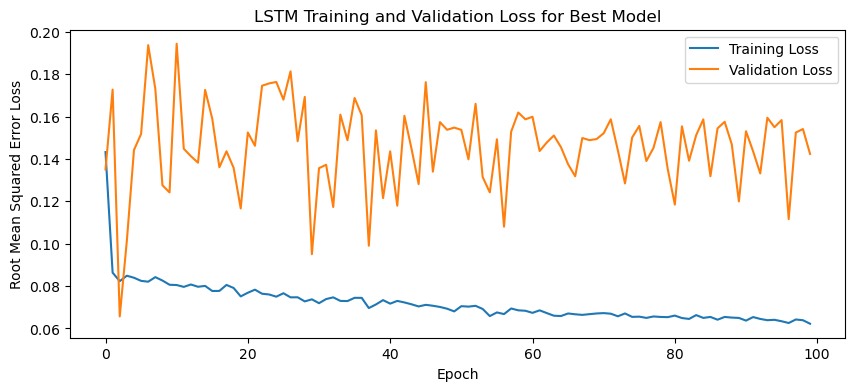

1/1 - 1s - loss: 0.0683 - 1s/epoch - 1s/step
Test Loss: 0.06832817196846008
1/1 [==============================] - 0s 31ms/step


IndexError: index 10 is out of bounds for axis 0 with size 10

In [3]:
n_batch = 1
nb_epoch = 100

def rmse (y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))

def mape (y_true, y_pred):
    return 100*K.mean(K.sqrt(K.square(y_true - y_pred))/y_true)
    
def pearson (y_true, y_pred):
    return (K.square(K.mean((y_true - K.mean(y_true))*(y_pred - K.mean(y_pred)))))/(K.mean(K.square(y_true - K.mean(y_true)))*K.mean(K.square(y_pred - K.mean(y_pred))))
 
# fit an LSTM network to training data
#Adapted from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def create_model(trial, X, y, n_lag, n_seq, n_batch, nb_epoch):

    cv_accuracies = []
    
    #Parameters:
    #trial (array-like): Optuna parameters.
    #train (array-like): Target values.
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations
    #nb_epoch (int): Maximum number of epochs
    
    # Hyperparameters to be tuned by Optuna (taken from Javier Leon's dissertation 'Fruit Prices')
    lr = trial.suggest_float('lr', 1e-3, 1, log=True)
    optimizer_name = trial.suggest_categorical('optimizer', ['Adam', 'RMSprop', 'SGD'])
    if optimizer_name == 'Adam':
        optimizer = Adam(learning_rate=lr)
    elif optimizer_name == 'RMSprop':
        optimizer = RMSprop(learning_rate=lr)
    else:
        optimizer = SGD(learning_rate=lr)
    
    #Optuna will try either Rectified Linear Unit (ReLU) = max(0, x), tanh, or sigmoid functions
    activation_function = trial.suggest_categorical('activation_function', ['relu', 'tanh', 'sigmoid'])
    
    lstm_units = trial.suggest_categorical('lstm_units', [256, 512, 1024])
    dropout_rate = trial.suggest_float('dropout_rate', 0.1, 0.5)

    # design network
    model = Sequential()
    model.add(LSTM(lstm_units, return_sequences=True, batch_input_shape=(n_batch, X.shape[1], X.shape[2]), stateful=True))
    model.add(Dropout(dropout_rate))
    model.add(LSTM(lstm_units))
    model.add(Dropout(dropout_rate))
    model.add(Dense(256, input_dim=y.shape[1], activation=activation_function))
    model.add(Dense(128, activation=activation_function))
    model.add(Dense(n_seq))
    model.compile(loss=rmse, optimizer=optimizer)
        
    return model

# make forecast with the CNN-LSTM best model
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def forecast_lstm(model, X, n_seq, n_test):
    # reshape input pattern to [samples, timesteps, features]
    X = X.reshape(1, 1, X.shape[1])
    # make forecast
    forecast = model.predict(X)
    # convert to array
    return forecast
     
# evaluate the persistence model
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def make_forecasts(model, X_test, y_test, n_lag, n_seq, n_test):
    forecasts = list()
    for i in range(len(X_test)):
        X, y = X_test[i, :], y_test[i, :]
        # make forecast
        forecast = forecast_lstm(model, X, n_seq, n_test)
        # store the forecast
        forecasts.append(forecast)
    return forecasts
     
# invert differenced forecast
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_difference(last_ob, forecast):
    # invert first forecast
    inverted = list()
    inverted.append(forecast[0] + last_ob)
    # propagate difference forecast using inverted first value
    for i in range(1, len(forecast)):
        inverted.append(forecast[i] + inverted[i-1])
    return inverted
     
# inverse data transform on forecasts
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_transform(series, forecasts, scaler, n_test, n_seq):
    inverted = list()
    for i in range(len(forecasts)):
        # create array from forecast
        forecast = forecasts[i]
        forecast = forecast.reshape(1, n_seq)
        # invert scaling
        inv_scale = scaler.inverse_transform(forecast)
        inv_scale = inv_scale[0, :]
        # invert differencing
        index = len(series) - n_test + i - 1
        last_ob = series.values[index]
        inv_diff = inverse_difference(last_ob, inv_scale)
        # store
        inverted.append(inv_diff)
    return inverted
     
# evaluate the RMSE for each forecast time step
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def evaluate_forecasts(test, forecasts, n_lag, n_seq):
    rmse_list = []
    mae_list = []
    mape_list = []
    r2_list = []
    for i in range(n_seq):
        actual = [row[i] for row in test]
        predicted = [forecast[i] for forecast in forecasts]
        rmse = sqrt(mean_squared_error(actual, predicted))
        mae = mean_absolute_error(actual, predicted)
        mse = mean_squared_error(actual, predicted)
        mape = mean_absolute_percentage_error(actual, predicted)
        r2 = r2_score(actual, predicted) 
        rmse_list.append(rmse)
        mae_list.append(mae)
        mape_list.append(mape)
        r2_list.append(r2)
        print("Month at t+"+str(i+1)+":")
        print('t+%d RMSE: %f' % ((i+1), rmse))
        print('t+%d MAE: %f' % ((i+1), mae))
        print('t+%d MAPE: %f' % ((i+1), mape))
        print('t+%d R2_SCORE: %f' % ((i+1), r2))

    return rmse_list, mae_list, mape_list, r2_list
     
# plot the forecasts in the context of the original dataset
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def plot_forecasts(series, forecasts, n_test):
    # plot the entire dataset in blue
    plt.plot(series.values)
    # plot the forecasts in red
    for i in range(len(forecasts)):
        off_s = len(series) - n_test + i - 1
        off_e = off_s + len(forecasts[i]) + 1
        xaxis = [x for x in range(off_s, off_e)]
        yaxis = [series.values[off_s]] + forecasts[i]
        plt.plot(xaxis, yaxis, color='red')
    # show the plot
    plt.show()
    
def objective(trial):
    
    cv_accuracies = []
        
    for i in range(5):
        train1 = train[i]
        test1 = test[i]
        validation1 = validation[i]

        X, y = train1[:, 0:-n_seq], train1[:, -n_seq:]
        X_test, y_test = test1[:, 0:-n_seq], test1[:, -n_seq:]
        X_val, y_val = validation1[:, 0:-n_seq], validation1[:, -n_seq:]
        X = X.reshape(X.shape[0], 1, X.shape[1])
        X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])
        X_val = X_val.reshape(X_val.shape[0], 1, X_val.shape[1])
    
        model = create_model(trial, X, y, n_lag, n_seq, n_batch, nb_epoch)

        history = model.fit(X, y, validation_data=(X_val, y_val), epochs=nb_epoch, verbose=0)

        cv_accuracy = model.evaluate(X_test, y_test, verbose=0)
    
        loss = history.history['val_loss'][-1]
    
        # Plotting the training and validation loss
        #plt.figure(figsize=(10, 4))
        #plt.plot(history.history['loss'], label='Training Loss')
        #plt.plot(history.history['val_loss'], label='Validation Loss')
        #title1 = "LSTM Training and Validation Loss for Fold " + str(i+1)
        #plt.title(title1)
        #plt.xlabel('Epoch')
        #plt.ylabel('Root Mean Squared Error Loss')
        #plt.legend()
        #plt.show()
            
        cv_accuracies.append(cv_accuracy)
    
    print("Cross Validation Accuracies:")
    print(cv_accuracies)
    print("Mean Cross Validation Accuracy:")
    print(np.mean(cv_accuracies))
    print("Standard Deviation of Cross Validation Accuracy:")
    print(np.std(cv_accuracies))
        
    return np.mean(cv_accuracies)

n_batch = 1
nb_epoch = 100

# optimize and fit model
study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=100)
print('Number of finished trials:', len(study.trials))

print('Best trial:', study.best_trial.params)
best_params = study.best_params
print("Best hyperparameters: ", best_params)

for i in range(5):
    print("Fold "+str(i+1)+":")
    train1 = train[i]
    test1 = test[i]
    validation1 = validation[i]

    X, y = train1[:, 0:-n_seq], train1[:, -n_seq:]
    X_test, y_test = test1[:, 0:-n_seq], test1[:, -n_seq:]
    X_val, y_val = validation1[:, 0:-n_seq], validation1[:, -n_seq]

    dataset_df = pd.DataFrame(val_y[i])
    dataset_df = dataset_df.iloc[0:10, :]
    dataset = dataset_df.values

    series = pd.Series(dataset[:, 0]) # Using first column (specific_humidity)
    
    X = X.reshape(X.shape[0], 1, X.shape[1])
    X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])
    X_val = X_val.reshape(X_val.shape[0], 1, X_val.shape[1])

    best_model = create_model(optuna.trial.FixedTrial(best_params), X, y, n_lag, n_seq, n_batch, nb_epoch)
    history=best_model.fit(X, y, epochs=nb_epoch, batch_size=n_batch, validation_data=(X_val, y_val))

    # Plotting the training and validation loss
    plt.figure(figsize=(10, 4))
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    title1 = "LSTM Training and Validation Loss for Best Model"
    plt.title(title1)
    plt.xlabel('Epoch')
    plt.ylabel('Root Mean Squared Error Loss')
    plt.legend()
    plt.show()

    # Evaluate the model
    loss = best_model.evaluate(X_test, y_test, verbose=2)
    print(f'Test Loss: {loss}')

    # make forecasts
    forecasts = make_forecasts(best_model, X_test, y_test, n_lag, n_seq, n_test)
    
    # inverse transform forecasts and test
    forecasts = inverse_transform(series, forecasts, scaler[i], n_test+2, n_seq)
    actual = [row[-n_seq:] for row in test1]
    actual = inverse_transform(series, actual, scaler[i], n_test+2, n_seq)

    rmse_list = [] # list stores root mean squared errors for each future time prediction
    mae_list = [] # list stores root mean squared errors for each future time prediction
    mape_list = [] # list stores root mean squared errors for each future time prediction
    r2_list = [] # list stores root mean squared errors for each future time prediction
    
    # evaluate forecasts
    rmse_list, mae_list, mape_list, r2_list = evaluate_forecasts(actual, forecasts, n_lag, n_seq)

    for j in range(len(X_test)):
        print("Weather Station "+str(j+1)+":")
        dataset_df = pd.DataFrame(y_test[j].flatten())
        dataset = dataset_df.values
        dataset = dataset[:, 0]
        dataset = np.array(dataset).reshape(-1, 1)
        dataset = dataset.flatten()
        dataset = pd.DataFrame(dataset)
        series = scaler[i].inverse_transform(dataset)
        series = pd.Series(series.flatten())

    # plot forecasts
    plot_forecasts(series, forecasts, 1)
    
    best_model.summary()

    # Print out table of actual and predicted values for each weather station
    for j in range(11):
        print("Weather Station "+str(j+1)+":")
        print("Actual Temp\tPredicted Temp\tDifference")
        print("-----------\t--------------\t----------")
        for k in range(n_seq):
            diff = forecasts[j][k] - actual[j][k]
            print(f"{actual[j][k]:.2f}\t\t{forecasts[j][k]:.2f}\t\t{diff:.2f}")

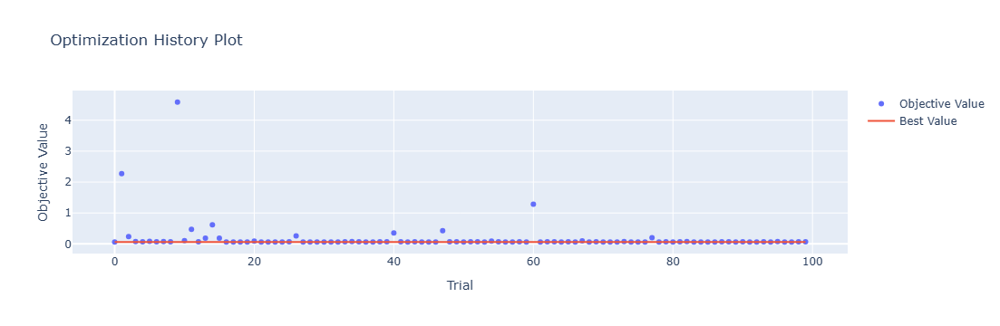

In [4]:
optuna.visualization.plot_optimization_history(study)

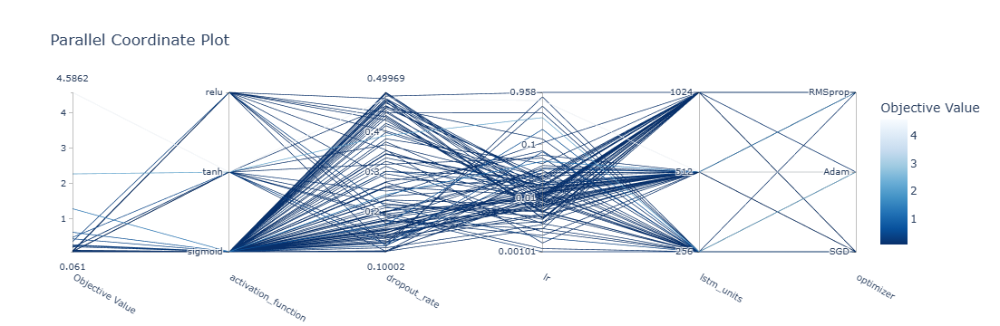

In [5]:
optuna.visualization.plot_parallel_coordinate(study)

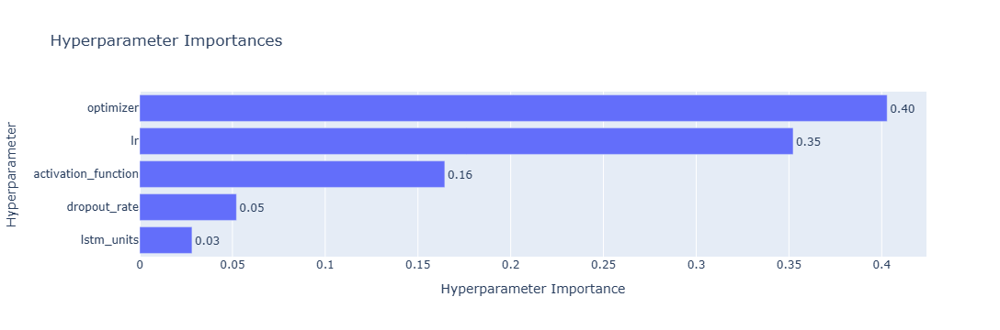

In [6]:
optuna.visualization.plot_param_importances(study)

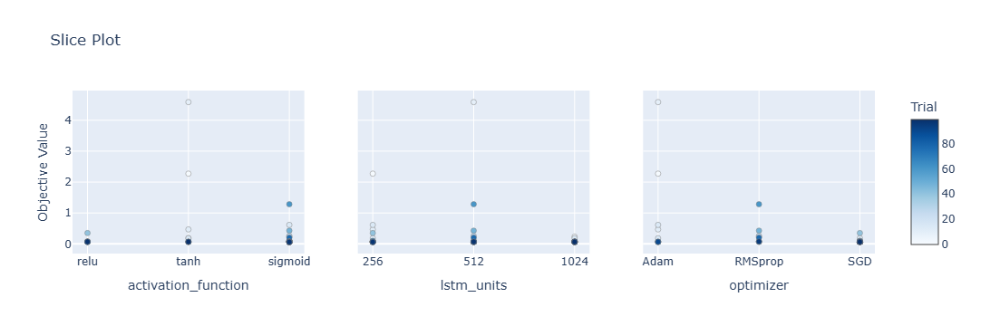

In [7]:
optuna.visualization.plot_slice(study, params=['optimizer', 'activation_function', 'lstm_units'])

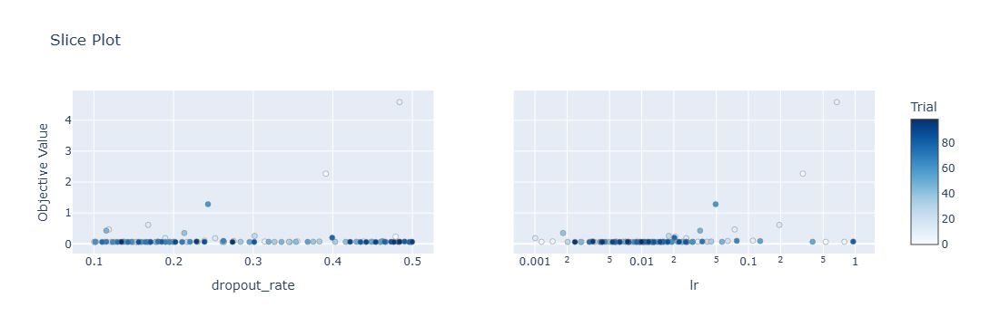

In [8]:
optuna.visualization.plot_slice(study, params=['lr', 'dropout_rate'])

[[ 5.39  4.3   6.51 ... 13.73  8.35  9.05]
 [ 8.03  6.78  8.21 ... 17.14 11.74 12.27]
 [ 5.48  4.27  5.49 ... 13.3   9.17  8.6 ]
 ...
 [ 4.55  3.1   4.22 ... 12.8   7.91  6.65]
 [ 4.44  3.4   5.39 ... 12.34  7.74  6.78]
 [ 4.14  2.75  4.12 ... 10.6   7.07  6.41]]
Epoch 1/100
84/84 [==============================] - 47s 358ms/step - loss: 0.1484 - accuracy: 0.4643 - mae: 0.1228 - rmse: 0.1484 - mape: 26.5239 - pearson: 0.6200 - val_loss: 0.0926 - val_accuracy: 0.8000 - val_mae: 0.0732 - val_rmse: 0.0926 - val_mape: 16.2581 - val_pearson: 0.5884
Epoch 2/100
84/84 [==============================] - 22s 257ms/step - loss: 0.0829 - accuracy: 0.5357 - mae: 0.0667 - rmse: 0.0829 - mape: 15.1264 - pearson: 0.7003 - val_loss: 0.0753 - val_accuracy: 0.8000 - val_mae: 0.0569 - val_rmse: 0.0753 - val_mape: 13.4646 - val_pearson: 0.7382
Epoch 3/100
84/84 [==============================] - 22s 263ms/step - loss: 0.0813 - accuracy: 0.5952 - mae: 0.0647 - rmse: 0.0813 - mape: 14.7912 - pearson: 0.7132

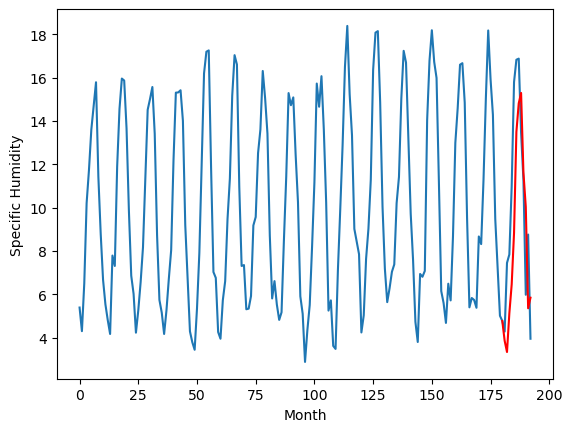

Weather Station 2:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.74		5.11		-0.63
6.45		4.59		-1.86
8.66		6.37		-2.29
8.88		7.71		-1.17
11.37		10.08		-1.29
16.12		14.75		-1.37
16.92		16.07		-0.85
17.08		16.55		-0.53
14.92		12.87		-2.05
11.84		11.29		-0.55
6.18		6.61		0.43
9.82		7.10		-2.72
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[7.05, 5.106212064027786, 4.5880608403682706, 6.36527739405632, 7.706730946302414, 10.082361801862717, 14.74961052775383, 16.07133780360222, 16.54913900732994, 12.87402699828148, 11.292105182409287, 6.609386905431748, 7.095684214830399]


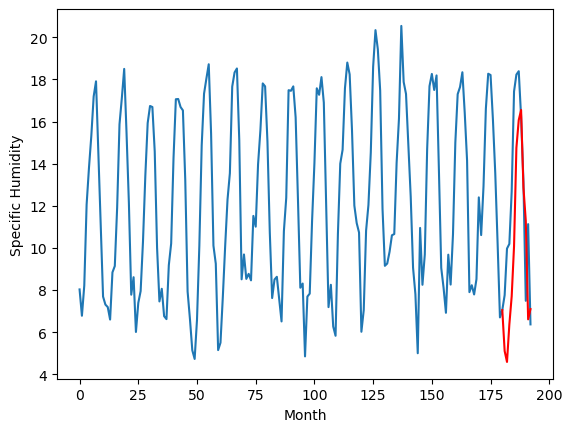

Weather Station 3:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
8.41		7.75		-0.66
8.56		7.23		-1.33
10.41		9.01		-1.40
10.65		10.35		-0.30
13.41		12.72		-0.69
18.03		17.39		-0.64
19.94		18.71		-1.23
20.14		19.19		-0.95
17.14		15.51		-1.63
14.42		13.93		-0.49
8.55		9.25		0.70
10.95		9.74		-1.21
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[5.06, 7.745855807065963, 7.229566572904586, 9.005734084844589, 10.350896238088607, 12.723677991628646, 17.394557832479478, 18.712116240262986, 19.191617040634156, 15.514958648681642, 13.932914047241212, 9.249815731048585, 9.738544522523881]


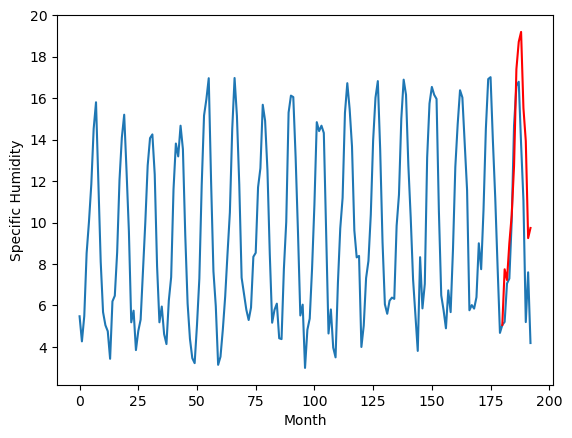

Weather Station 4:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.55		5.20		-0.35
5.46		4.68		-0.78
8.91		6.46		-2.45
9.48		7.80		-1.68
12.99		10.18		-2.81
16.89		14.85		-2.04
17.73		16.17		-1.56
17.35		16.65		-0.70
15.04		12.98		-2.06
12.61		11.40		-1.21
6.40		6.71		0.31
9.45		7.21		-2.24
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[7.05, 5.1987445461750035, 4.682017396688462, 6.457904528379441, 7.8028394687175755, 10.180703591108323, 14.852519463300705, 16.1704955804348, 16.65223644256592, 12.980684499740601, 11.39863214969635, 6.7143903779983525, 7.206301848888398]


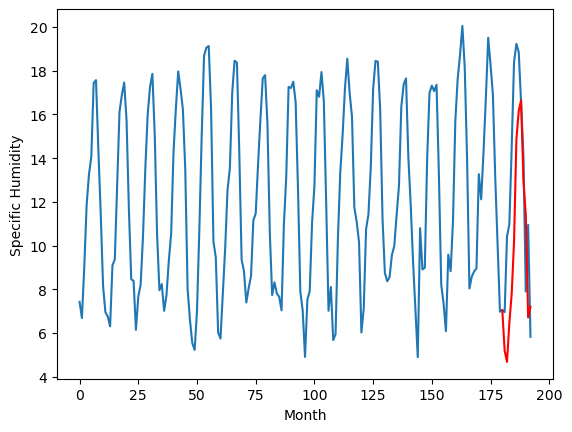

Weather Station 5:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
7.36		7.15		-0.21
6.96		6.63		-0.33
9.80		8.42		-1.38
11.20		9.76		-1.44
15.21		12.14		-3.07
18.90		16.81		-2.09
19.61		18.13		-1.48
19.53		18.61		-0.92
15.30		14.94		-0.36
13.21		13.36		0.15
8.99		8.68		-0.31
11.75		9.17		-2.58
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[5.2, 7.151318155527115, 6.633334659337997, 8.41558720946312, 9.75777938246727, 12.13896252989769, 16.806068204641342, 18.126695178747177, 18.608622633218765, 14.938026987314224, 13.35802956700325, 8.676542483568191, 9.168983750343322]


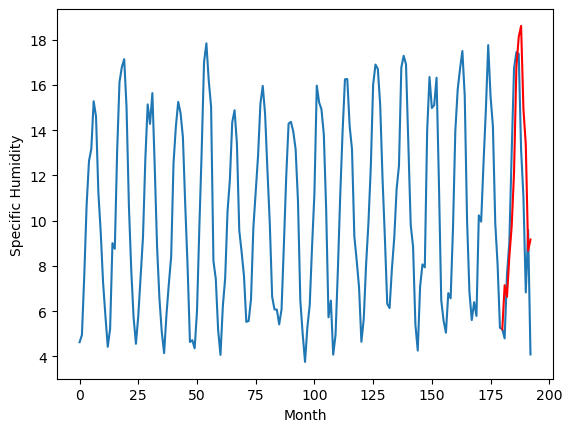

Weather Station 6:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.02		4.35		0.33
4.61		3.83		-0.78
6.18		5.61		-0.57
7.19		6.95		-0.24
9.69		9.33		-0.36
14.95		14.00		-0.95
16.07		15.32		-0.75
17.23		15.80		-1.43
13.14		12.12		-1.02
10.82		10.54		-0.28
5.56		5.86		0.30
6.98		6.35		-0.63
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[5.16, 4.346856896877289, 3.8309002566337584, 5.609757368564606, 6.953431670665741, 9.327246015071868, 13.996696774959563, 15.315602009296416, 15.796878819465636, 12.121243720054625, 10.541165475845336, 5.8596669483184805, 6.34995323896408]


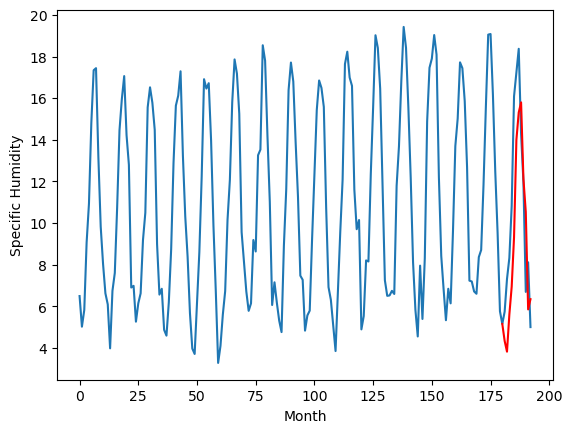

Weather Station 7:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
6.35		6.22		-0.13
6.40		5.70		-0.70
7.99		7.48		-0.51
8.59		8.82		0.23
11.59		11.19		-0.40
15.97		15.86		-0.11
17.41		17.18		-0.23
17.94		17.67		-0.27
14.62		13.99		-0.63
12.51		12.41		-0.10
6.76		7.72		0.96
8.60		8.22		-0.38
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[4.05, 6.216146320104599, 5.698238223791122, 7.477194041013718, 8.823333591222763, 11.193500131368637, 15.8638616502285, 17.180442661046982, 17.665207624435425, 13.98582148551941, 12.405701756477356, 7.724856972694397, 8.217090368270874]


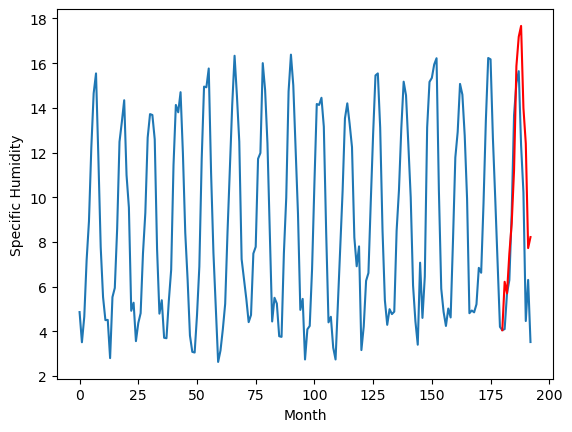

Weather Station 8:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.55		4.58		0.03
4.58		4.06		-0.52
6.20		5.83		-0.37
6.90		7.18		0.28
9.92		9.55		-0.37
14.19		14.22		0.03
15.69		15.53		-0.16
15.97		16.02		0.05
12.48		12.34		-0.14
10.60		10.76		0.16
4.81		6.08		1.27
6.58		6.57		-0.01
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[3.64, 4.576205775737763, 4.058526799678803, 5.834353134632111, 7.181221649646759, 9.549992249011993, 14.2196733212471, 15.53406553030014, 16.020357058048248, 12.340229914188384, 10.760989472866058, 6.079295918941497, 6.569403365850448]


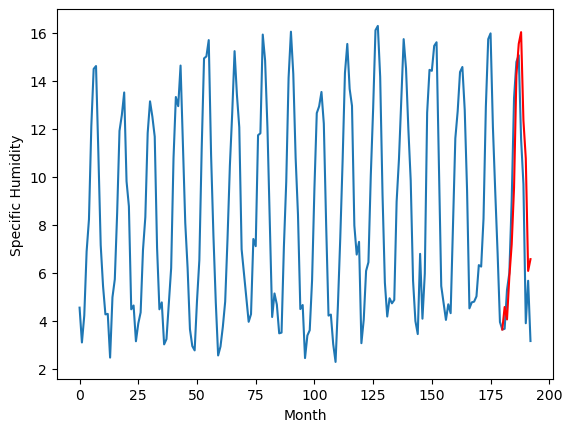

Weather Station 9:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.32		4.27		-0.05
3.64		3.75		0.11
6.70		5.53		-1.17
7.43		6.87		-0.56
10.34		9.24		-1.10
15.32		13.91		-1.41
16.82		15.22		-1.60
17.01		15.71		-1.30
13.20		12.02		-1.18
10.78		10.44		-0.34
5.49		5.76		0.27
7.08		6.25		-0.83
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[3.46, 4.265715140104294, 3.7457564651966093, 5.525420862436294, 6.870364505052566, 9.238513547182084, 13.907469350099564, 15.220431643724442, 15.705375450849534, 12.021821516752244, 10.443268436193467, 5.761767047643662, 6.254116463661195]


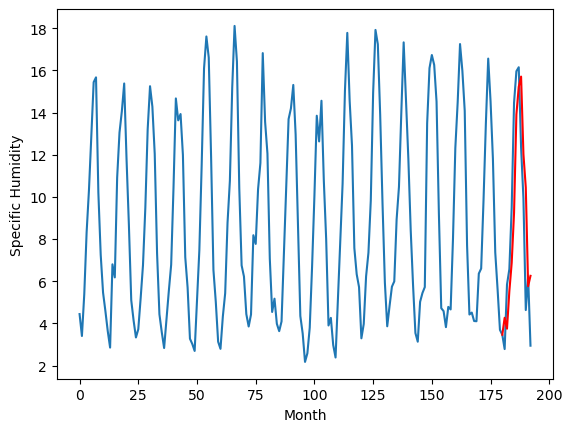

Weather Station 10:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.11		4.15		0.04
3.66		3.63		-0.03
5.46		5.41		-0.05
6.78		6.76		-0.02
8.87		9.12		0.25
13.64		13.80		0.16
14.57		15.11		0.54
14.99		15.59		0.60
11.82		11.91		0.09
10.51		10.33		-0.18
4.99		5.65		0.66
5.83		6.14		0.31
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.93, 4.152504416704178, 3.6313914382457737, 5.411319764852524, 6.757496031522751, 9.124957712888719, 13.797078760862352, 15.107197793722154, 15.594578894376756, 11.909857901334764, 10.33394173026085, 5.65127685904503, 6.141615363359453]


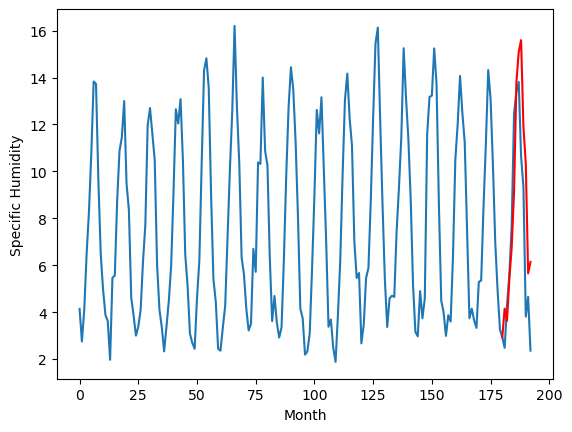

Weather Station 11:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.76		3.85		0.09
3.02		3.33		0.31
4.64		5.11		0.47
6.24		6.45		0.21
7.76		8.82		1.06
12.89		13.49		0.60
13.96		14.80		0.84
14.45		15.29		0.84
10.83		11.60		0.77
9.84		10.03		0.19
4.99		5.35		0.36
4.99		5.84		0.85
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.74, 3.850508495569229, 3.326702042818069, 5.105903431177139, 6.4517839395999905, 8.818428560495377, 13.490831896066666, 14.798970028162003, 15.288900538682938, 11.60382811665535, 10.027995034456254, 5.347839757204056, 5.836829587221146]


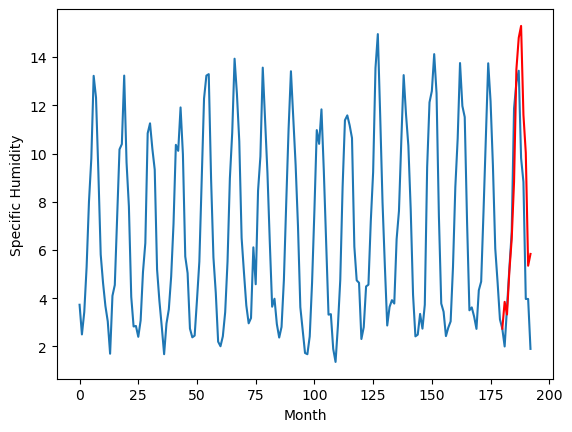

Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    3.90   3.858436
1                 1    5.74   5.106212
2                 2    8.41   7.745856
3                 3    5.55   5.198745
4                 4    7.36   7.151318
5                 5    4.02   4.346857
6                 6    6.35   6.216146
7                 7    4.55   4.576206
8                 8    4.32   4.265715
9                 9    4.11   4.152504
10               10    3.76   3.850508


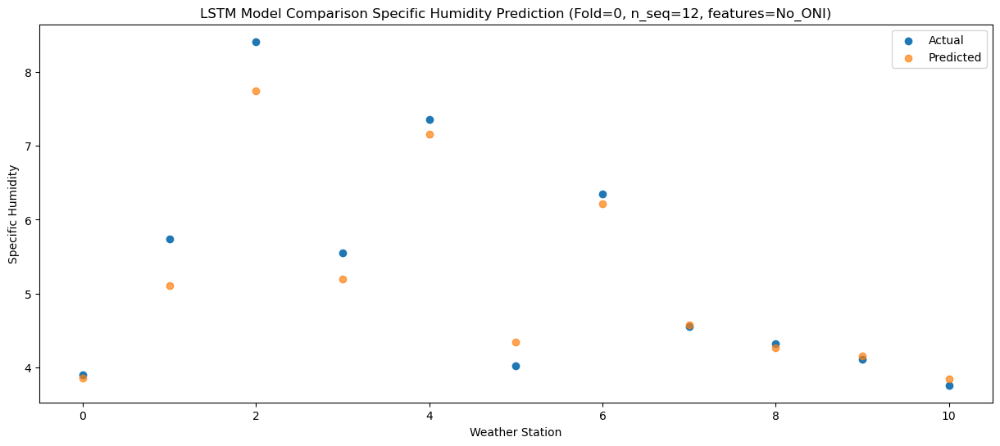

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    3.41   3.338172
1                 1    6.45   4.588061
2                 2    8.56   7.229567
3                 3    5.46   4.682017
4                 4    6.96   6.633335
5                 5    4.61   3.830900
6                 6    6.40   5.698238
7                 7    4.58   4.058527
8                 8    3.64   3.745756
9                 9    3.66   3.631391
10               10    3.02   3.326702


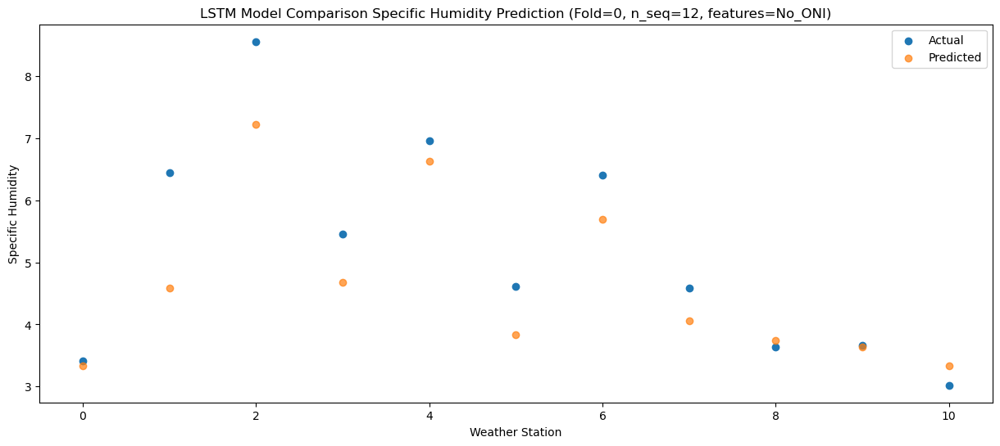

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0    6.58   5.122508
1                 1    8.66   6.365277
2                 2   10.41   9.005734
3                 3    8.91   6.457905
4                 4    9.80   8.415587
5                 5    6.18   5.609757
6                 6    7.99   7.477194
7                 7    6.20   5.834353
8                 8    6.70   5.525421
9                 9    5.46   5.411320
10               10    4.64   5.105903


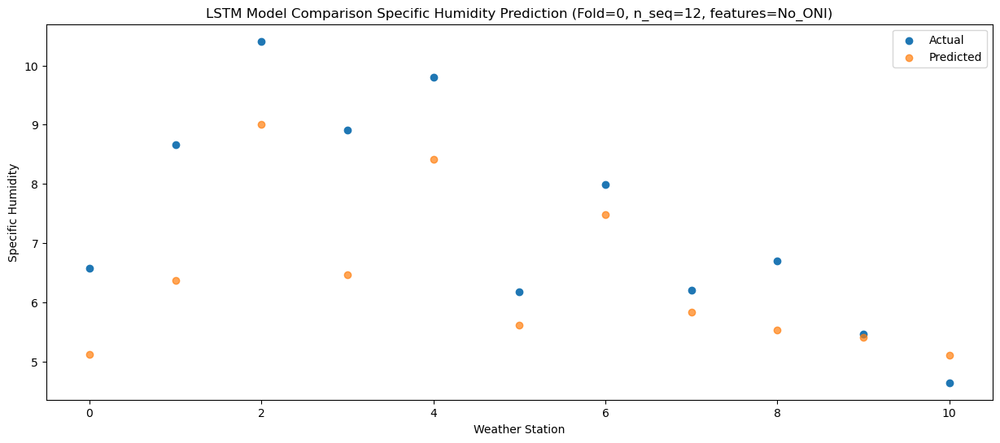

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0    6.97   6.461791
1                 1    8.88   7.706731
2                 2   10.65  10.350896
3                 3    9.48   7.802839
4                 4   11.20   9.757779
5                 5    7.19   6.953432
6                 6    8.59   8.823334
7                 7    6.90   7.181222
8                 8    7.43   6.870365
9                 9    6.78   6.757496
10               10    6.24   6.451784


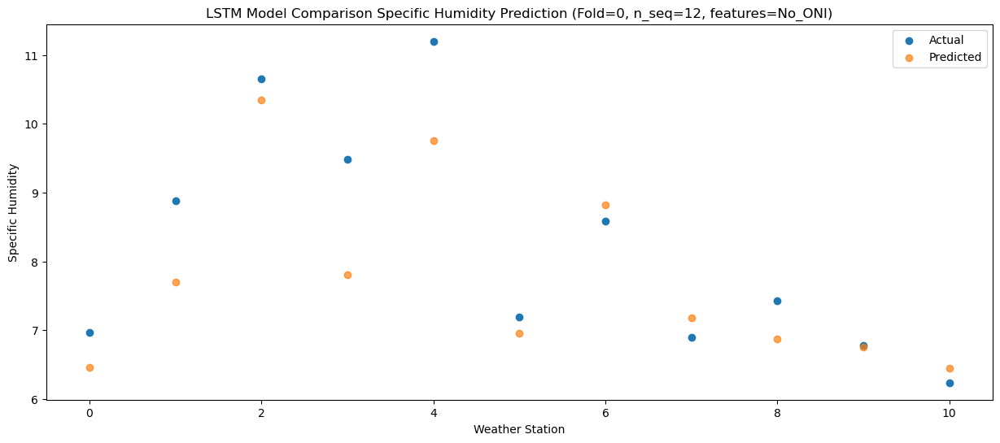

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0   10.12   8.837828
1                 1   11.37  10.082362
2                 2   13.41  12.723678
3                 3   12.99  10.180704
4                 4   15.21  12.138963
5                 5    9.69   9.327246
6                 6   11.59  11.193500
7                 7    9.92   9.549992
8                 8   10.34   9.238514
9                 9    8.87   9.124958
10               10    7.76   8.818429


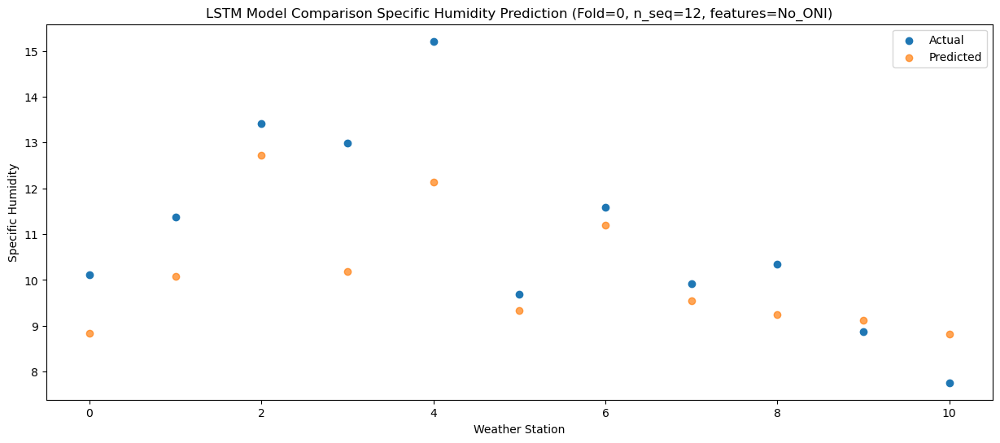

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   14.93  13.498899
1                 1   16.12  14.749611
2                 2   18.03  17.394558
3                 3   16.89  14.852519
4                 4   18.90  16.806068
5                 5   14.95  13.996697
6                 6   15.97  15.863862
7                 7   14.19  14.219673
8                 8   15.32  13.907469
9                 9   13.64  13.797079
10               10   12.89  13.490832


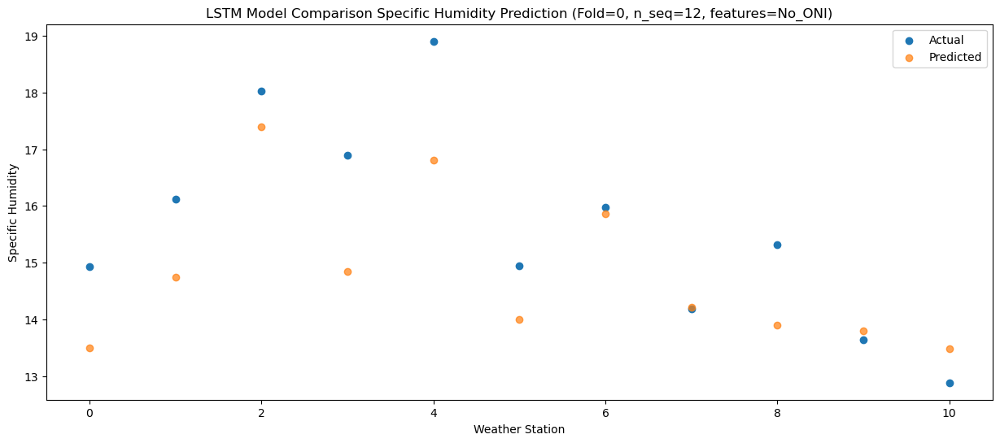

Predictions for (t+6):
    Weather_Station  Actual  Predicted
0                 0   15.96  14.818234
1                 1   16.92  16.071338
2                 2   19.94  18.712116
3                 3   17.73  16.170496
4                 4   19.61  18.126695
5                 5   16.07  15.315602
6                 6   17.41  17.180443
7                 7   15.69  15.534066
8                 8   16.82  15.220432
9                 9   14.57  15.107198
10               10   13.96  14.798970


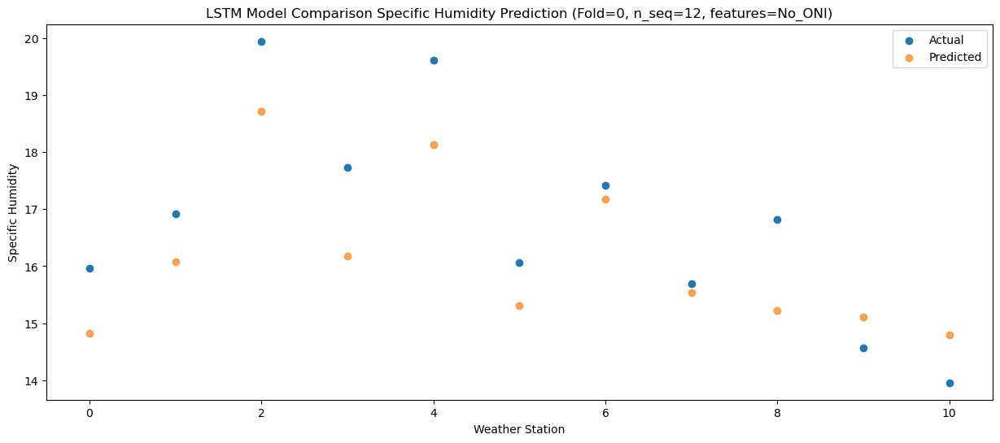

Predictions for (t+7):
    Weather_Station  Actual  Predicted
0                 0   16.01  15.296586
1                 1   17.08  16.549139
2                 2   20.14  19.191617
3                 3   17.35  16.652236
4                 4   19.53  18.608623
5                 5   17.23  15.796879
6                 6   17.94  17.665208
7                 7   15.97  16.020357
8                 8   17.01  15.705375
9                 9   14.99  15.594579
10               10   14.45  15.288901


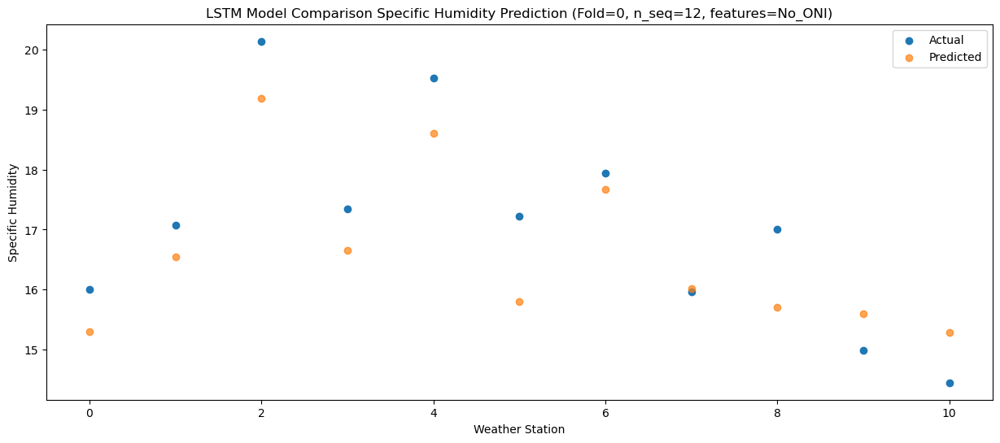

Predictions for (t+8):
    Weather_Station  Actual  Predicted
0                 0   12.59  11.617025
1                 1   14.92  12.874027
2                 2   17.14  15.514959
3                 3   15.04  12.980684
4                 4   15.30  14.938027
5                 5   13.14  12.121244
6                 6   14.62  13.985821
7                 7   12.48  12.340230
8                 8   13.20  12.021822
9                 9   11.82  11.909858
10               10   10.83  11.603828


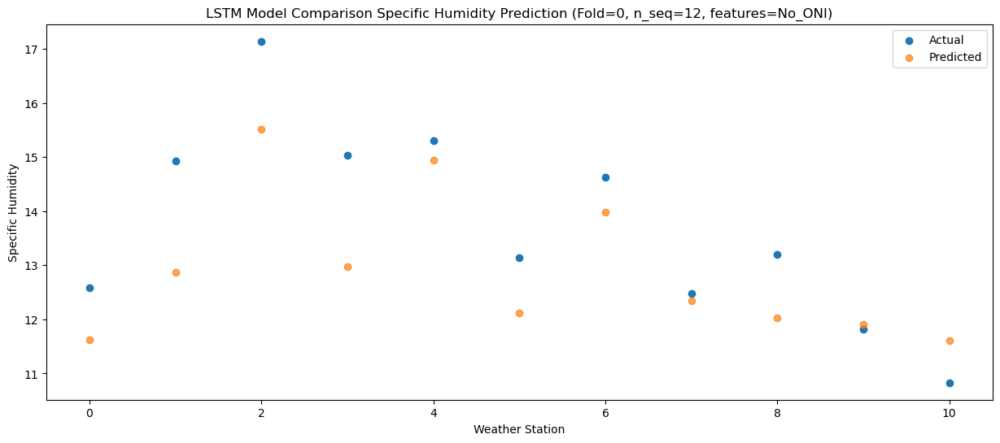

Predictions for (t+9):
    Weather_Station  Actual  Predicted
0                 0   10.41  10.036417
1                 1   11.84  11.292105
2                 2   14.42  13.932914
3                 3   12.61  11.398632
4                 4   13.21  13.358030
5                 5   10.82  10.541165
6                 6   12.51  12.405702
7                 7   10.60  10.760989
8                 8   10.78  10.443268
9                 9   10.51  10.333942
10               10    9.84  10.027995


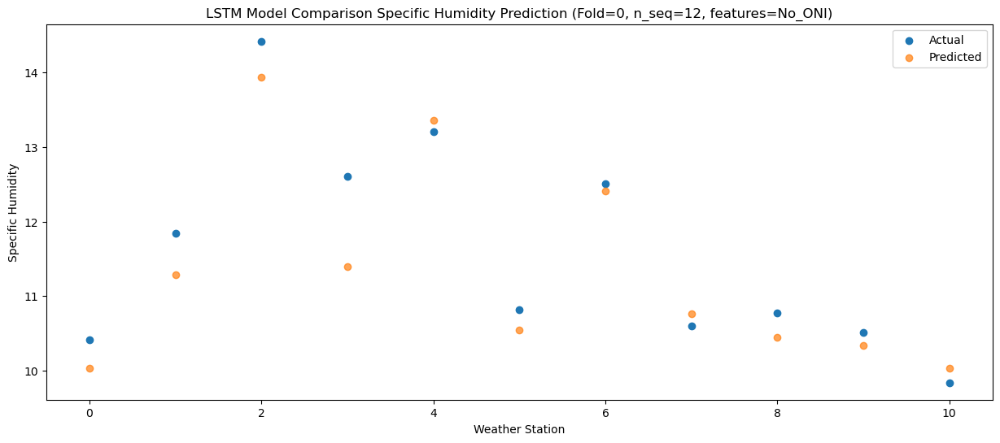

Predictions for (t+10):
    Weather_Station  Actual  Predicted
0                 0    5.11   5.356574
1                 1    6.18   6.609387
2                 2    8.55   9.249816
3                 3    6.40   6.714390
4                 4    8.99   8.676542
5                 5    5.56   5.859667
6                 6    6.76   7.724857
7                 7    4.81   6.079296
8                 8    5.49   5.761767
9                 9    4.99   5.651277
10               10    4.99   5.347840


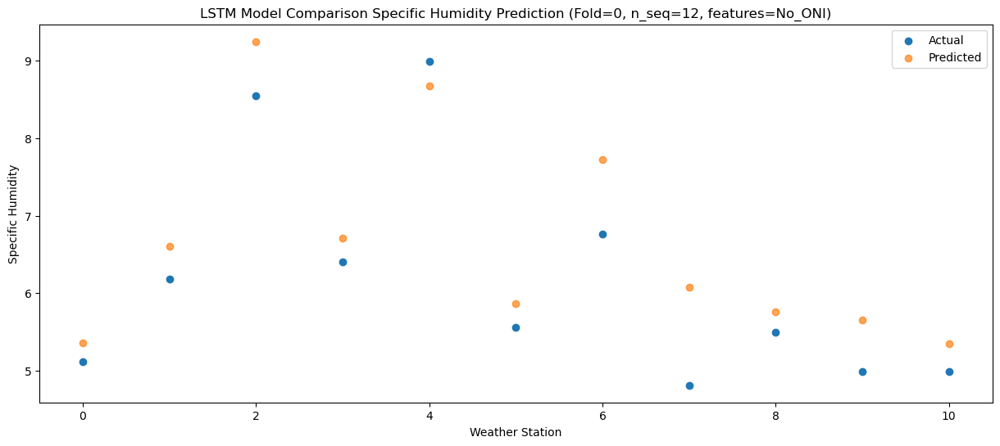

Predictions for (t+11):
    Weather_Station  Actual  Predicted
0                 0    7.89   5.844901
1                 1    9.82   7.095684
2                 2   10.95   9.738545
3                 3    9.45   7.206302
4                 4   11.75   9.168984
5                 5    6.98   6.349953
6                 6    8.60   8.217090
7                 7    6.58   6.569403
8                 8    7.08   6.254116
9                 9    5.83   6.141615
10               10    4.99   5.836830


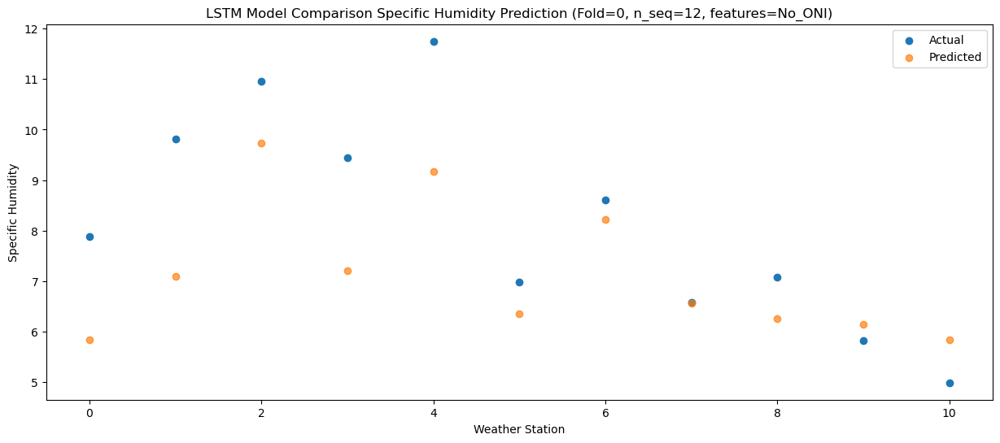

f, t:
[[ 3.9   5.74  8.41  5.55  7.36  4.02  6.35  4.55  4.32  4.11  3.76]
 [ 3.41  6.45  8.56  5.46  6.96  4.61  6.4   4.58  3.64  3.66  3.02]
 [ 6.58  8.66 10.41  8.91  9.8   6.18  7.99  6.2   6.7   5.46  4.64]
 [ 6.97  8.88 10.65  9.48 11.2   7.19  8.59  6.9   7.43  6.78  6.24]
 [10.12 11.37 13.41 12.99 15.21  9.69 11.59  9.92 10.34  8.87  7.76]
 [14.93 16.12 18.03 16.89 18.9  14.95 15.97 14.19 15.32 13.64 12.89]
 [15.96 16.92 19.94 17.73 19.61 16.07 17.41 15.69 16.82 14.57 13.96]
 [16.01 17.08 20.14 17.35 19.53 17.23 17.94 15.97 17.01 14.99 14.45]
 [12.59 14.92 17.14 15.04 15.3  13.14 14.62 12.48 13.2  11.82 10.83]
 [10.41 11.84 14.42 12.61 13.21 10.82 12.51 10.6  10.78 10.51  9.84]
 [ 5.11  6.18  8.55  6.4   8.99  5.56  6.76  4.81  5.49  4.99  4.99]
 [ 7.89  9.82 10.95  9.45 11.75  6.98  8.6   6.58  7.08  5.83  4.99]]
[[ 3.85843567  5.10621206  7.74585581  5.19874455  7.15131816  4.3468569
   6.21614632  4.57620578  4.26571514  4.15250442  3.8505085 ]
 [ 3.33817153  4.58806084  7.

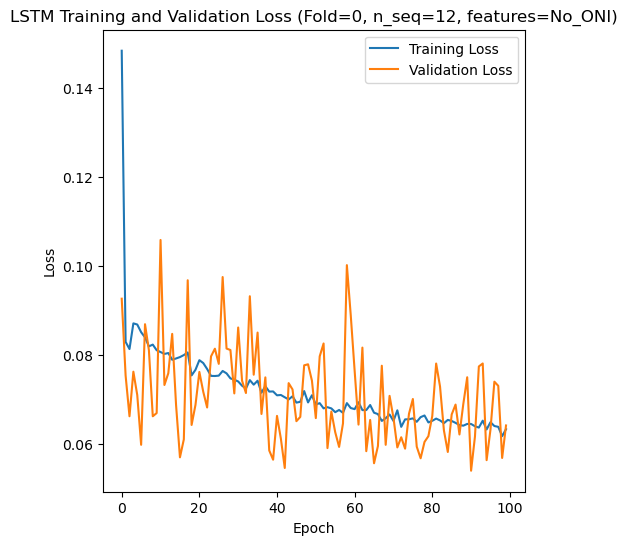

[[ 6.43  5.26  5.95 ... 15.04 10.09  9.76]
 [ 4.92  3.81  4.91 ... 12.52  8.69  7.9 ]
 [ 5.77  4.38  5.81 ... 14.28  9.78  9.52]
 ...
 [ 4.32  3.52  5.54 ... 12.    6.96  7.01]
 [ 3.07  3.12  5.08 ... 11.47  8.11  7.14]
 [ 2.37  2.06  3.5  ...  9.32  6.33  5.39]]
Epoch 1/100
84/84 [==============================] - 44s 335ms/step - loss: 0.1283 - accuracy: 0.6071 - mae: 0.1001 - rmse: 0.1283 - mape: 22.3707 - pearson: 0.6282 - val_loss: 0.0730 - val_accuracy: 0.7000 - val_mae: 0.0590 - val_rmse: 0.0730 - val_mape: 12.9352 - val_pearson: 0.7300
Epoch 2/100
84/84 [==============================] - 22s 264ms/step - loss: 0.0850 - accuracy: 0.6905 - mae: 0.0669 - rmse: 0.0850 - mape: 15.5191 - pearson: 0.7153 - val_loss: 0.0838 - val_accuracy: 0.7000 - val_mae: 0.0654 - val_rmse: 0.0838 - val_mape: 16.8784 - val_pearson: 0.7248
Epoch 3/100
84/84 [==============================] - 21s 255ms/step - loss: 0.0862 - accuracy: 0.6429 - mae: 0.0688 - rmse: 0.0862 - mape: 15.8517 - pearson: 0.6995

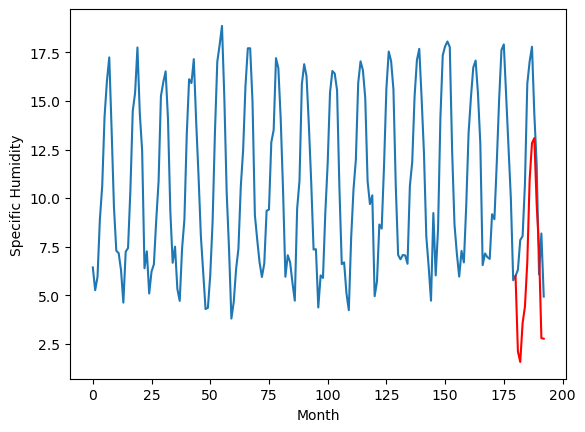

Weather Station 2:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
6.45		6.17		-0.28
6.64		5.62		-1.02
8.17		7.62		-0.55
8.53		8.48		-0.05
11.45		10.77		-0.68
15.43		15.00		-0.43
17.30		16.89		-0.41
17.51		17.15		-0.36
14.56		13.73		-0.83
12.52		11.45		-1.07
6.93		6.86		-0.07
9.10		6.83		-2.27
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[4.15, 6.166832171678543, 5.624808512926101, 7.624183140993118, 8.476767145395279, 10.765374742746353, 15.000885092020035, 16.894487344026565, 17.14932417154312, 13.730001442432403, 11.45123862504959, 6.856821529865265, 6.8308249957114455]


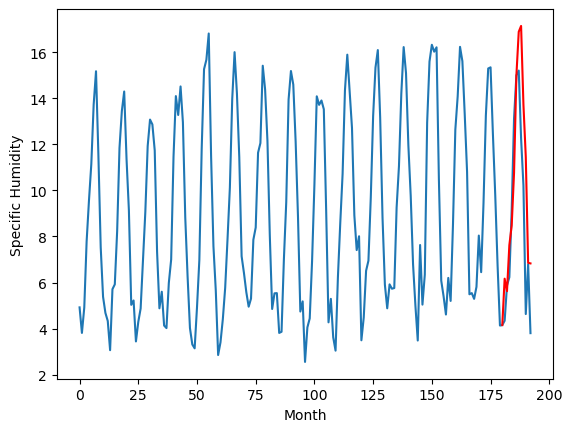

Weather Station 3:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.07		4.65		-0.42
5.07		4.11		-0.96
7.69		6.11		-1.58
7.40		6.97		-0.43
10.24		9.26		-0.98
14.76		13.49		-1.27
16.35		15.38		-0.97
16.57		15.64		-0.93
13.81		12.22		-1.59
11.06		9.94		-1.12
5.56		5.35		-0.21
8.20		5.32		-2.88
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[5.12, 4.654774857759476, 4.111109150648117, 6.112818611860275, 6.967099322080612, 9.256064547300339, 13.492178095579147, 15.384651197195053, 15.639103246927261, 12.220895124673843, 9.940685583353043, 5.346795870065689, 5.321792226359248]


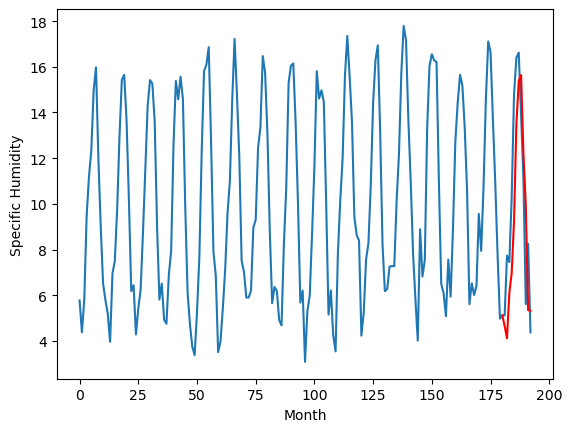

Weather Station 4:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.43		5.50		0.07
5.50		4.96		-0.54
8.14		6.97		-1.17
9.48		7.82		-1.66
13.37		10.11		-3.26
16.56		14.34		-2.22
17.04		16.23		-0.81
17.38		16.49		-0.89
14.29		13.07		-1.22
12.04		10.79		-1.25
7.59		6.20		-1.39
10.51		6.18		-4.33
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[6.35, 5.502828706502914, 4.963177074193954, 6.96575747847557, 7.819563497304916, 10.114281047582626, 14.344232429265976, 16.233031738996505, 16.49197839617729, 13.072674502134323, 10.794658650159835, 6.203782547712326, 6.176851129606366]


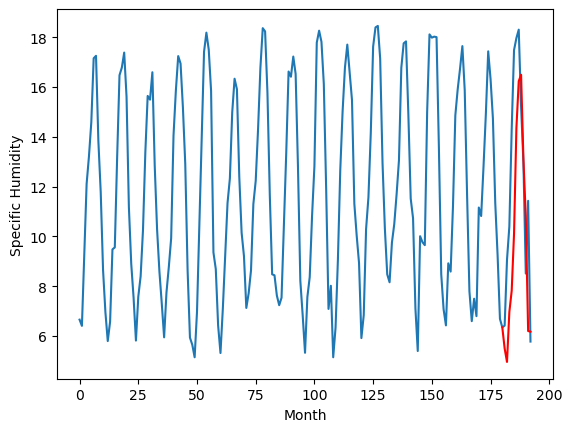

Weather Station 5:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
6.41		6.39		-0.02
6.45		5.85		-0.60
9.17		7.86		-1.31
10.43		8.71		-1.72
14.46		11.01		-3.45
17.87		15.24		-2.63
18.05		17.13		-0.92
18.09		17.39		-0.70
14.99		13.97		-1.02
13.04		11.69		-1.35
8.45		7.10		-1.35
11.38		7.07		-4.31
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[6.08, 6.392402354478836, 5.854333344697952, 7.857597295045853, 8.712211552858353, 11.009594622850418, 15.236710253953934, 17.127051535844803, 17.387443516254425, 13.966682646274567, 11.688694212436676, 7.098439428806305, 7.070813858732581]


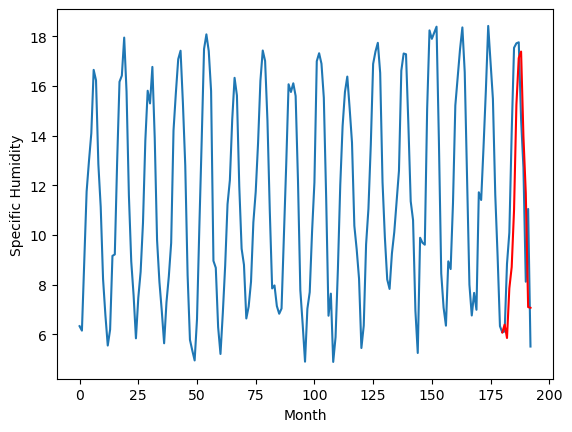

Weather Station 6:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
7.16		6.06		-1.10
6.53		5.52		-1.01
7.32		7.52		0.20
8.62		8.37		-0.25
12.93		10.66		-2.27
15.10		14.89		-0.21
16.43		16.78		0.35
16.65		17.04		0.39
13.11		13.62		0.51
10.00		11.34		1.34
8.16		6.75		-1.41
7.11		6.72		-0.39
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[3.92, 6.062898324728012, 5.522922800779343, 7.518225239515305, 8.368595288991928, 10.664217876195908, 14.89058058142662, 16.778627680540083, 17.03976313948631, 13.617802547216414, 11.336891578435896, 6.749738143682478, 6.719790350571273]


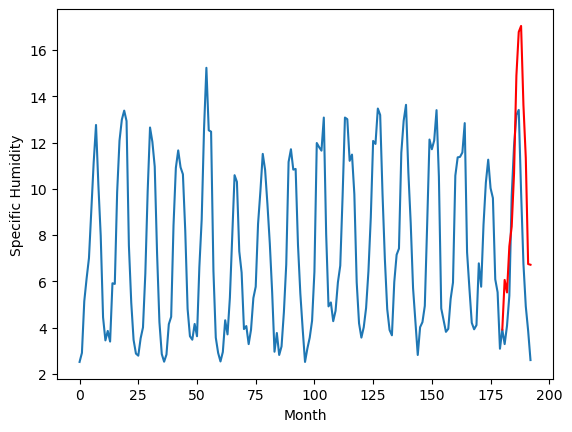

Weather Station 7:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
2.41		2.25		-0.16
2.53		1.71		-0.82
4.09		3.71		-0.38
4.71		4.56		-0.15
7.64		6.86		-0.78
11.99		11.09		-0.90
14.49		12.98		-1.51
14.78		13.24		-1.54
11.43		9.82		-1.61
9.30		7.54		-1.76
3.37		2.95		-0.42
5.24		2.92		-2.32
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[4.16, 2.253441174030304, 1.7112570595741272, 3.7106818747520447, 4.562979717254638, 6.856324453353881, 11.08782078742981, 12.97981240272522, 13.24046735882759, 9.817853022813797, 7.5396922123432155, 2.9496934902667995, 2.922735002338886]


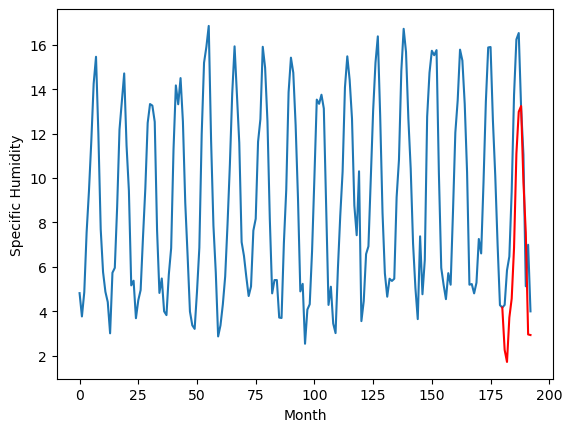

Weather Station 8:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.68		4.54		-0.14
4.16		4.00		-0.16
6.89		6.00		-0.89
8.12		6.85		-1.27
11.33		9.15		-2.18
16.09		13.38		-2.71
16.72		15.27		-1.45
16.57		15.53		-1.04
13.32		12.10		-1.22
10.59		9.83		-0.76
6.03		5.24		-0.79
7.67		5.21		-2.46
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[3.84, 4.541442332267761, 3.9973753666877743, 5.998433229923248, 6.849670526981353, 9.145079491138457, 13.3757599568367, 15.267709968090056, 15.528636602163314, 12.103123811483382, 9.826270011663436, 5.2393697774410235, 5.211529580354689]


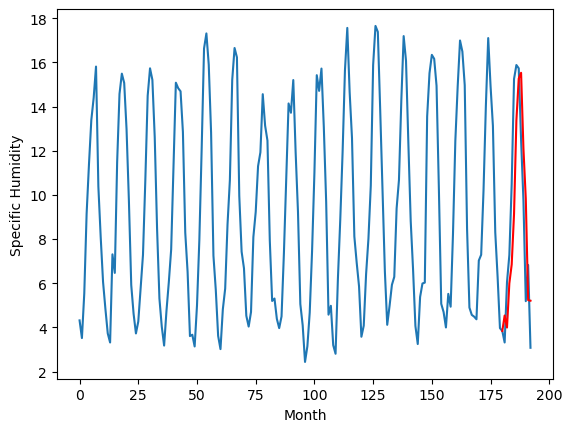

Weather Station 9:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.48		4.05		-0.43
3.67		3.50		-0.17
6.28		5.50		-0.78
7.44		6.35		-1.09
11.66		8.65		-3.01
14.80		12.88		-1.92
15.85		14.76		-1.09
15.43		15.03		-0.40
11.86		11.60		-0.26
9.42		9.32		-0.10
5.89		4.74		-1.15
5.28		4.71		-0.57
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[3.73, 4.0490674149990085, 3.5049308311939242, 5.5044069063663486, 6.3534891974926, 8.650019444227219, 12.87673024058342, 14.76458493590355, 15.025205082893372, 11.600318379402161, 9.321761078834534, 4.7359117937088016, 4.7067790009826425]


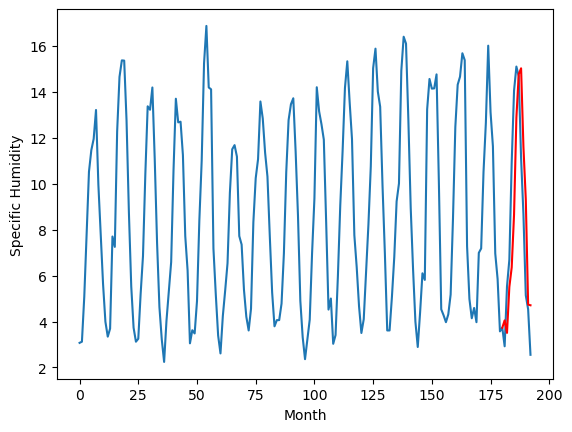

Weather Station 10:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.26		2.80		-0.46
2.52		2.25		-0.27
4.34		4.25		-0.09
4.51		5.10		0.59
9.66		7.39		-2.27
12.65		11.62		-1.03
13.89		13.50		-0.39
12.86		13.76		0.90
9.90		10.34		0.44
6.46		8.06		1.60
4.10		3.48		-0.62
3.12		3.44		0.32
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.83, 2.7982586991786955, 2.252423502206802, 4.249628640413285, 5.0960416567325595, 7.393546558618546, 11.616501308679581, 13.499621607065201, 13.76369900226593, 10.33895296573639, 8.059748358726502, 3.476196475028992, 3.4420064200460914]


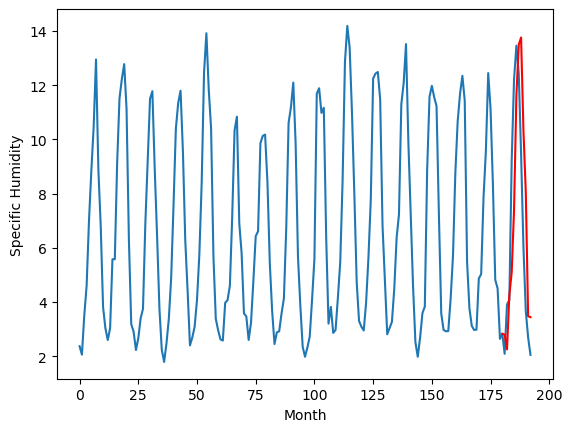

Weather Station 11:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
1.64		2.10		0.46
1.68		1.56		-0.12
2.92		3.56		0.64
4.29		4.41		0.12
5.82		6.70		0.88
11.14		10.93		-0.21
13.00		12.82		-0.18
13.34		13.08		-0.26
10.15		9.66		-0.49
8.29		7.39		-0.90
3.10		2.79		-0.31
2.98		2.76		-0.22
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.69, 2.0990509939193727, 1.556140298843384, 3.5558774423599244, 4.406758959293366, 6.703398640155792, 10.932078773975373, 12.82328825712204, 13.0848374915123, 9.663065249919892, 7.386127765178681, 2.7946732592582713, 2.7631989073753367]


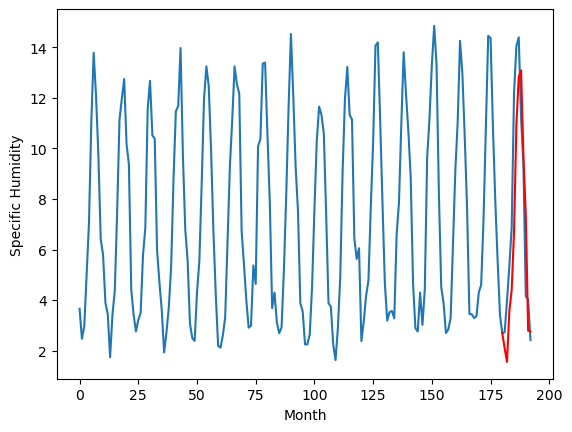

Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    2.59   2.108092
1                 1    6.45   6.166832
2                 2    5.07   4.654775
3                 3    5.43   5.502829
4                 4    6.41   6.392402
5                 5    7.16   6.062898
6                 6    2.41   2.253441
7                 7    4.68   4.541442
8                 8    4.48   4.049067
9                 9    3.26   2.798259
10               10    1.64   2.099051


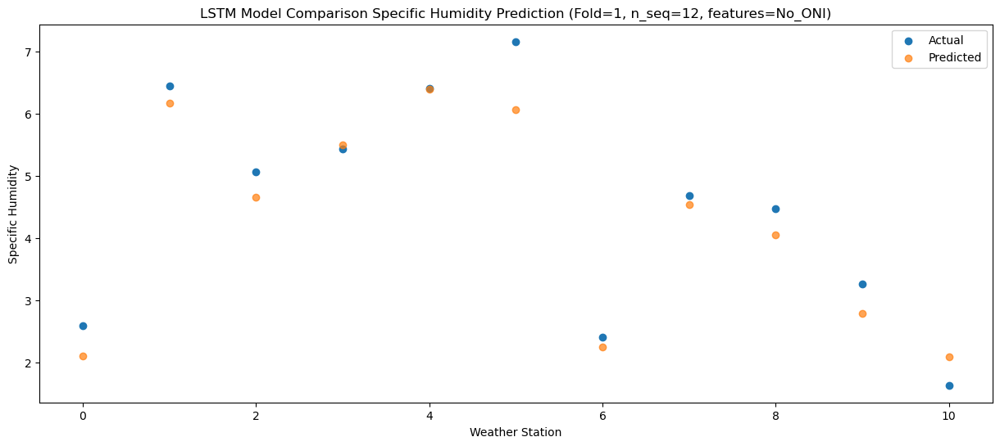

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    2.91   1.568296
1                 1    6.64   5.624809
2                 2    5.07   4.111109
3                 3    5.50   4.963177
4                 4    6.45   5.854333
5                 5    6.53   5.522923
6                 6    2.53   1.711257
7                 7    4.16   3.997375
8                 8    3.67   3.504931
9                 9    2.52   2.252424
10               10    1.68   1.556140


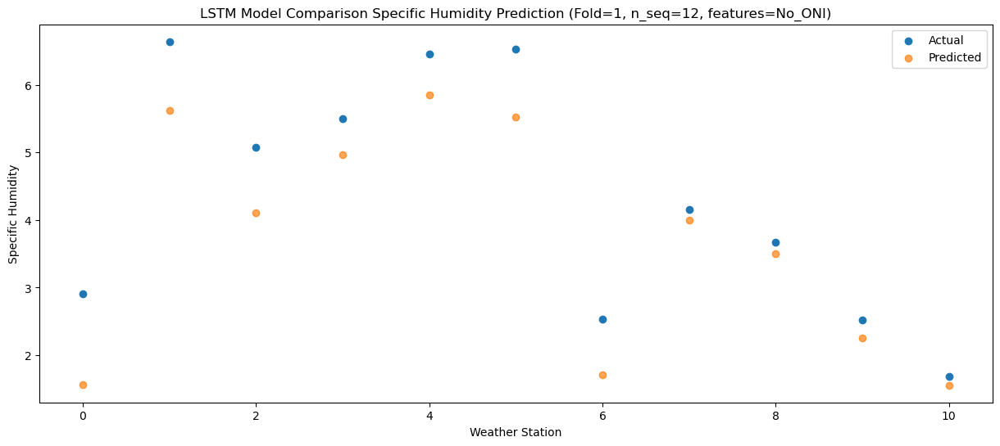

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0    4.44   3.566866
1                 1    8.17   7.624183
2                 2    7.69   6.112819
3                 3    8.14   6.965757
4                 4    9.17   7.857597
5                 5    7.32   7.518225
6                 6    4.09   3.710682
7                 7    6.89   5.998433
8                 8    6.28   5.504407
9                 9    4.34   4.249629
10               10    2.92   3.555877


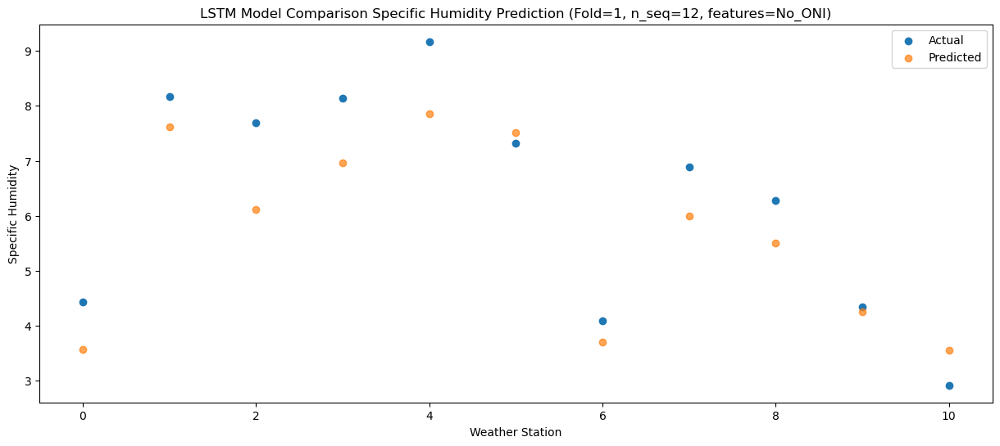

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0    4.64   4.417779
1                 1    8.53   8.476767
2                 2    7.40   6.967099
3                 3    9.48   7.819563
4                 4   10.43   8.712212
5                 5    8.62   8.368595
6                 6    4.71   4.562980
7                 7    8.12   6.849671
8                 8    7.44   6.353489
9                 9    4.51   5.096042
10               10    4.29   4.406759


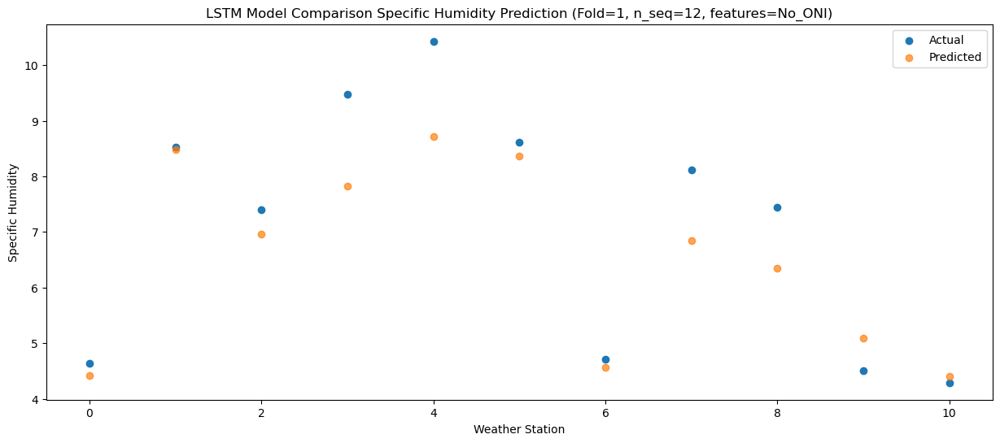

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0    7.32   6.708762
1                 1   11.45  10.765375
2                 2   10.24   9.256065
3                 3   13.37  10.114281
4                 4   14.46  11.009595
5                 5   12.93  10.664218
6                 6    7.64   6.856324
7                 7   11.33   9.145079
8                 8   11.66   8.650019
9                 9    9.66   7.393547
10               10    5.82   6.703399


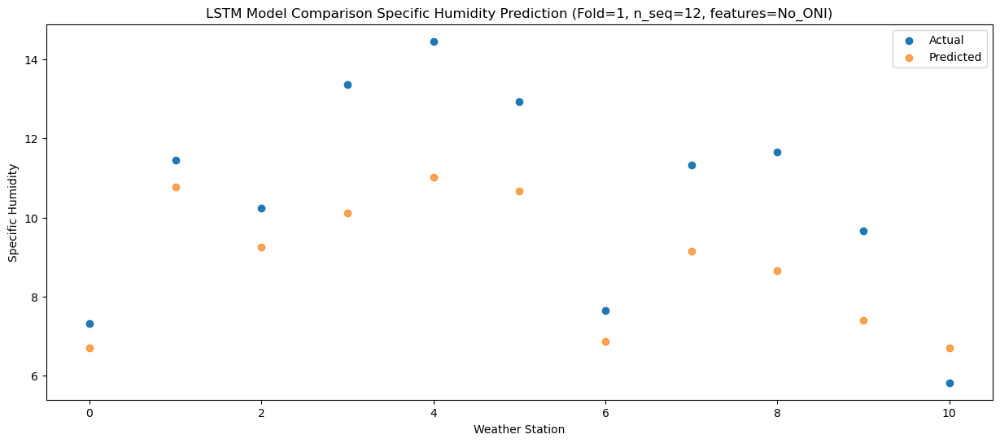

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   12.48  10.941688
1                 1   15.43  15.000885
2                 2   14.76  13.492178
3                 3   16.56  14.344232
4                 4   17.87  15.236710
5                 5   15.10  14.890581
6                 6   11.99  11.087821
7                 7   16.09  13.375760
8                 8   14.80  12.876730
9                 9   12.65  11.616501
10               10   11.14  10.932079


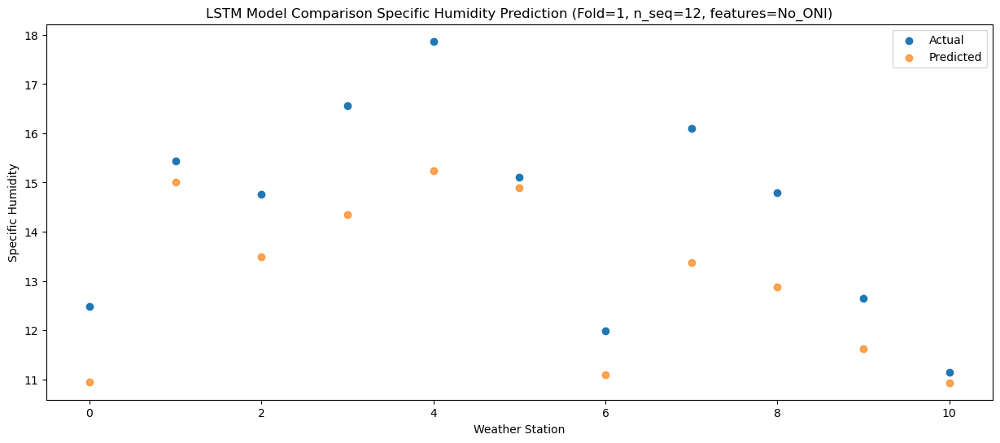

Predictions for (t+6):
    Weather_Station  Actual  Predicted
0                 0   13.63  12.833399
1                 1   17.30  16.894487
2                 2   16.35  15.384651
3                 3   17.04  16.233032
4                 4   18.05  17.127052
5                 5   16.43  16.778628
6                 6   14.49  12.979812
7                 7   16.72  15.267710
8                 8   15.85  14.764585
9                 9   13.89  13.499622
10               10   13.00  12.823288


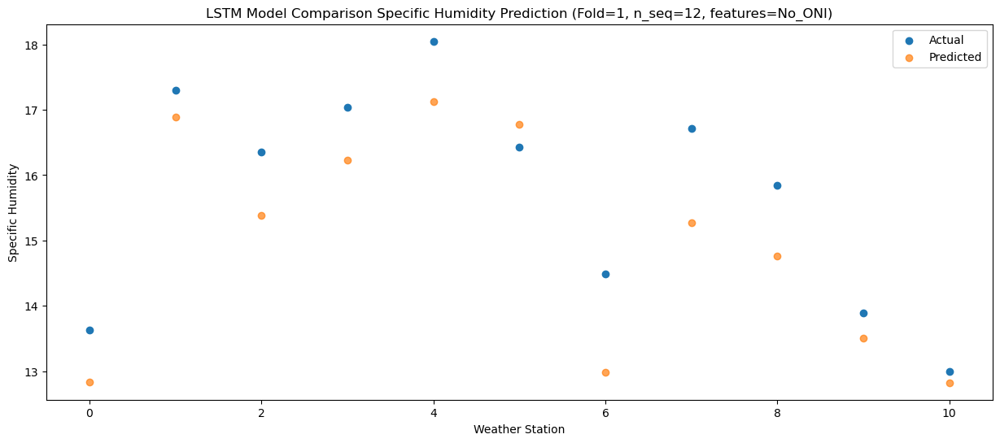

Predictions for (t+7):
    Weather_Station  Actual  Predicted
0                 0   14.39  13.087129
1                 1   17.51  17.149324
2                 2   16.57  15.639103
3                 3   17.38  16.491978
4                 4   18.09  17.387444
5                 5   16.65  17.039763
6                 6   14.78  13.240467
7                 7   16.57  15.528637
8                 8   15.43  15.025205
9                 9   12.86  13.763699
10               10   13.34  13.084837


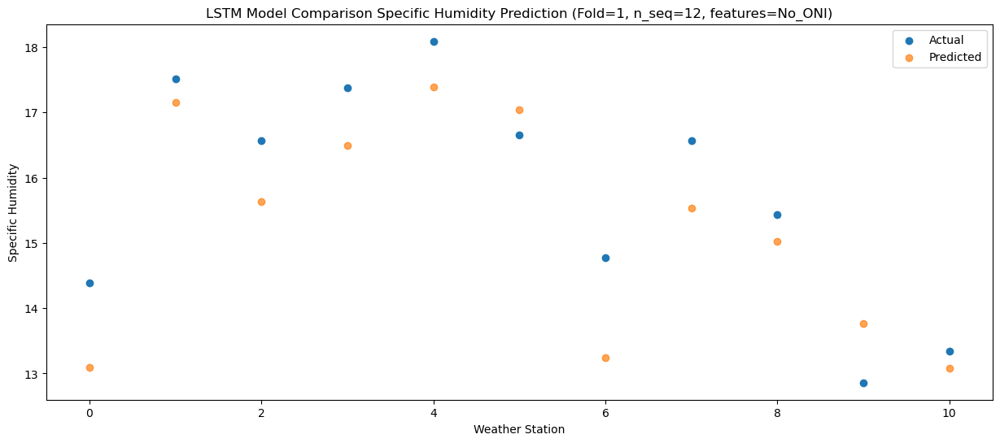

Predictions for (t+8):
    Weather_Station  Actual  Predicted
0                 0   10.91   9.668275
1                 1   14.56  13.730001
2                 2   13.81  12.220895
3                 3   14.29  13.072675
4                 4   14.99  13.966683
5                 5   13.11  13.617803
6                 6   11.43   9.817853
7                 7   13.32  12.103124
8                 8   11.86  11.600318
9                 9    9.90  10.338953
10               10   10.15   9.663065


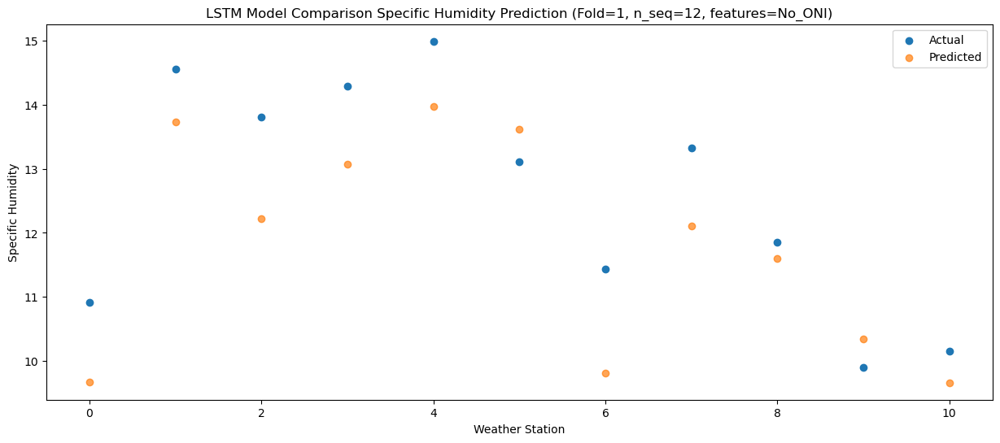

Predictions for (t+9):
    Weather_Station  Actual  Predicted
0                 0    8.33   7.388212
1                 1   12.52  11.451239
2                 2   11.06   9.940686
3                 3   12.04  10.794659
4                 4   13.04  11.688694
5                 5   10.00  11.336892
6                 6    9.30   7.539692
7                 7   10.59   9.826270
8                 8    9.42   9.321761
9                 9    6.46   8.059748
10               10    8.29   7.386128


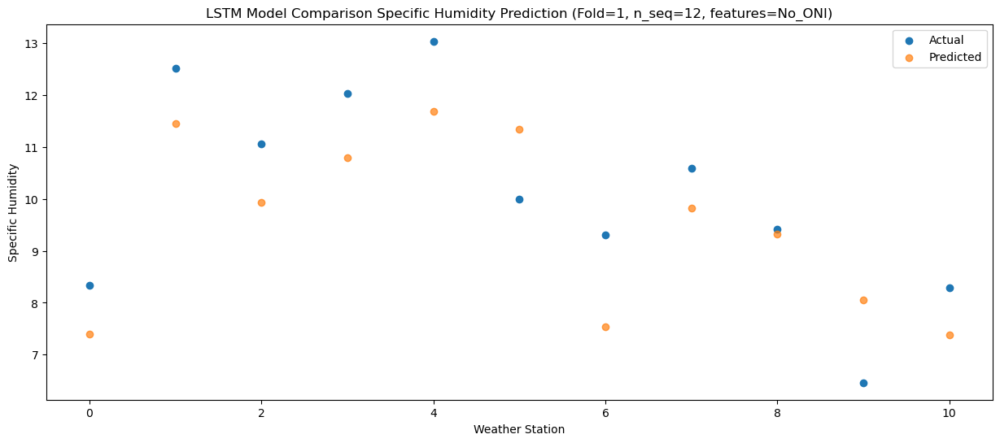

Predictions for (t+10):
    Weather_Station  Actual  Predicted
0                 0    2.67   2.791913
1                 1    6.93   6.856822
2                 2    5.56   5.346796
3                 3    7.59   6.203783
4                 4    8.45   7.098439
5                 5    8.16   6.749738
6                 6    3.37   2.949693
7                 7    6.03   5.239370
8                 8    5.89   4.735912
9                 9    4.10   3.476196
10               10    3.10   2.794673


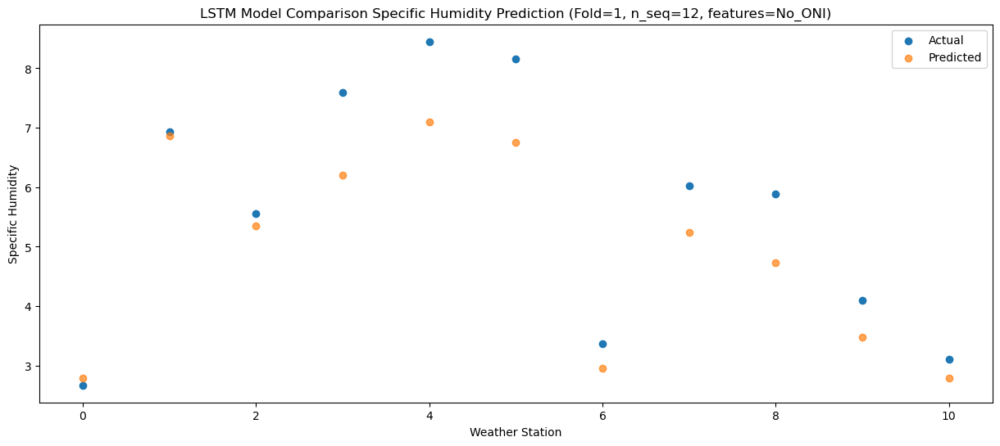

Predictions for (t+11):
    Weather_Station  Actual  Predicted
0                 0    4.78   2.763895
1                 1    9.10   6.830825
2                 2    8.20   5.321792
3                 3   10.51   6.176851
4                 4   11.38   7.070814
5                 5    7.11   6.719790
6                 6    5.24   2.922735
7                 7    7.67   5.211530
8                 8    5.28   4.706779
9                 9    3.12   3.442006
10               10    2.98   2.763199


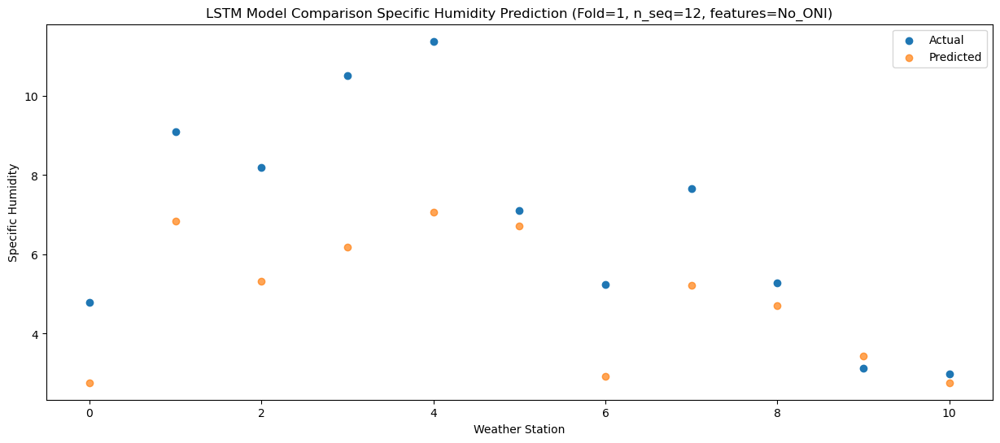

f, t:
[[ 2.59  6.45  5.07  5.43  6.41  7.16  2.41  4.68  4.48  3.26  1.64]
 [ 2.91  6.64  5.07  5.5   6.45  6.53  2.53  4.16  3.67  2.52  1.68]
 [ 4.44  8.17  7.69  8.14  9.17  7.32  4.09  6.89  6.28  4.34  2.92]
 [ 4.64  8.53  7.4   9.48 10.43  8.62  4.71  8.12  7.44  4.51  4.29]
 [ 7.32 11.45 10.24 13.37 14.46 12.93  7.64 11.33 11.66  9.66  5.82]
 [12.48 15.43 14.76 16.56 17.87 15.1  11.99 16.09 14.8  12.65 11.14]
 [13.63 17.3  16.35 17.04 18.05 16.43 14.49 16.72 15.85 13.89 13.  ]
 [14.39 17.51 16.57 17.38 18.09 16.65 14.78 16.57 15.43 12.86 13.34]
 [10.91 14.56 13.81 14.29 14.99 13.11 11.43 13.32 11.86  9.9  10.15]
 [ 8.33 12.52 11.06 12.04 13.04 10.    9.3  10.59  9.42  6.46  8.29]
 [ 2.67  6.93  5.56  7.59  8.45  8.16  3.37  6.03  5.89  4.1   3.1 ]
 [ 4.78  9.1   8.2  10.51 11.38  7.11  5.24  7.67  5.28  3.12  2.98]]
[[ 2.10809192  6.16683217  4.65477486  5.50282871  6.39240235  6.06289832
   2.25344117  4.54144233  4.04906741  2.7982587   2.09905099]
 [ 1.56829622  5.62480851  4

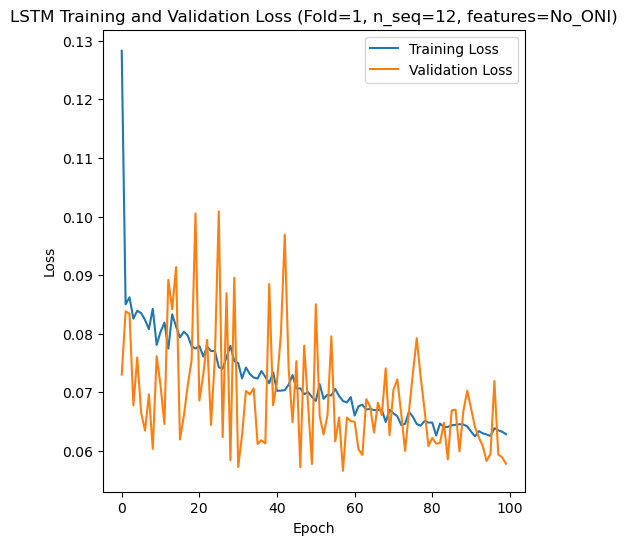

[[ 4.97  3.84  5.83 ... 12.86  8.48  8.25]
 [ 2.46  2.06  3.48 ...  9.57  6.71  5.1 ]
 [ 8.78  8.15  9.01 ... 20.36 15.38 12.95]
 ...
 [ 1.89  2.51  2.73 ...  7.42  4.53  3.35]
 [ 5.04  4.9   5.93 ... 10.09  8.19  4.88]
 [ 5.06  3.79  4.84 ... 13.58  8.96  7.8 ]]
Epoch 1/100
84/84 [==============================] - 42s 345ms/step - loss: 0.1077 - accuracy: 0.5952 - mae: 0.0857 - rmse: 0.1077 - mape: 18.7460 - pearson: 0.6610 - val_loss: 0.0917 - val_accuracy: 0.0000e+00 - val_mae: 0.0752 - val_rmse: 0.0917 - val_mape: 16.9983 - val_pearson: 0.6795
Epoch 2/100
84/84 [==============================] - 22s 257ms/step - loss: 0.0872 - accuracy: 0.5714 - mae: 0.0691 - rmse: 0.0872 - mape: 15.7415 - pearson: 0.6837 - val_loss: 0.0696 - val_accuracy: 1.0000 - val_mae: 0.0572 - val_rmse: 0.0696 - val_mape: 13.1298 - val_pearson: 0.8338
Epoch 3/100
84/84 [==============================] - 23s 275ms/step - loss: 0.0876 - accuracy: 0.6667 - mae: 0.0706 - rmse: 0.0876 - mape: 16.3970 - pearson: 0.

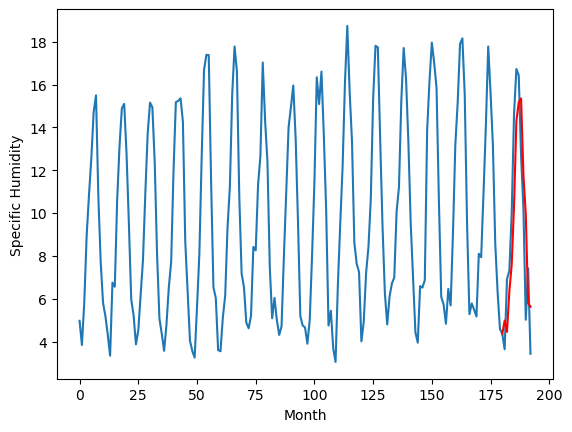

Weather Station 2:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.92		4.89		-0.03
4.24		4.36		0.12
6.09		6.25		0.16
6.21		7.49		1.28
11.33		10.27		-1.06
14.24		14.19		-0.05
15.85		15.06		-0.79
14.23		15.24		1.01
11.41		11.65		0.24
8.02		9.82		1.80
5.59		5.68		0.09
4.53		5.51		0.98
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.82, 4.894682557582855, 4.364462168216705, 6.252220304012298, 7.486346752643585, 10.265983612537383, 14.192875654697417, 15.06401363134384, 15.241327763795852, 11.646520138978957, 9.824880243539809, 5.683992029428481, 5.513412908911704]


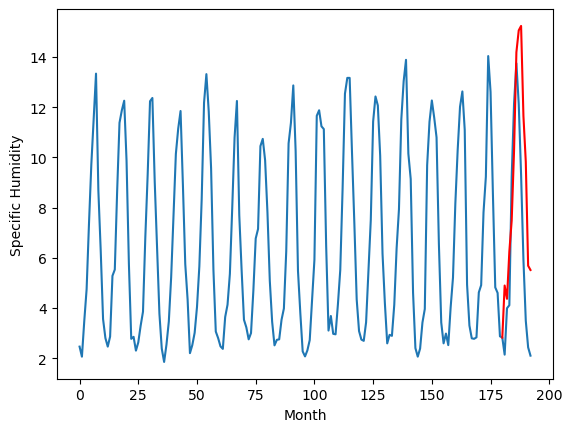

Weather Station 3:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
2.95		2.38		-0.57
5.08		1.84		-3.24
5.30		3.72		-1.58
6.27		4.96		-1.31
7.58		7.74		0.16
11.36		11.66		0.30
11.76		12.53		0.77
12.38		12.71		0.33
11.10		9.12		-1.98
8.44		7.30		-1.14
4.49		3.15		-1.34
5.89		2.99		-2.90
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[9.16, 2.3789599007368087, 1.8445417350530624, 3.7238919204473495, 4.95555478990078, 7.73518592774868, 11.662399834990502, 12.530779249072076, 12.713489881753922, 9.120610586404801, 7.297855249643327, 3.1526521360874185, 2.9902309989929208]


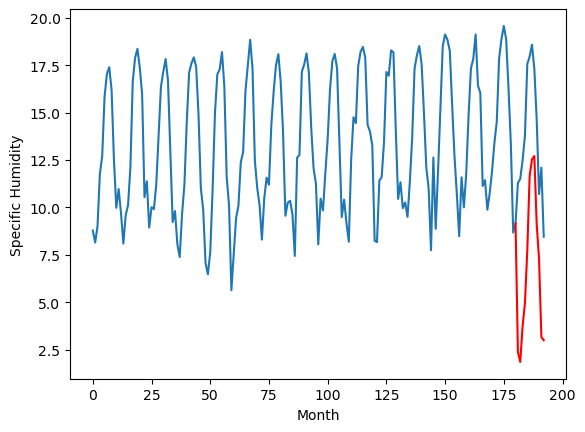

Weather Station 4:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
7.70		8.69		0.99
7.87		8.16		0.29
8.51		10.04		1.53
9.86		11.28		1.42
11.54		14.06		2.52
16.14		17.98		1.84
18.74		18.85		0.11
19.48		19.04		-0.44
16.82		15.45		-1.37
13.86		13.62		-0.24
9.41		9.48		0.07
9.05		9.31		0.26
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.44, 8.69328514367342, 8.163322425186633, 10.043787575066089, 11.277473426163196, 14.05855772525072, 17.982695079147817, 18.854519820511342, 19.03907623022795, 15.446881673038007, 13.621671817004682, 9.477211615741254, 9.312864250242711]


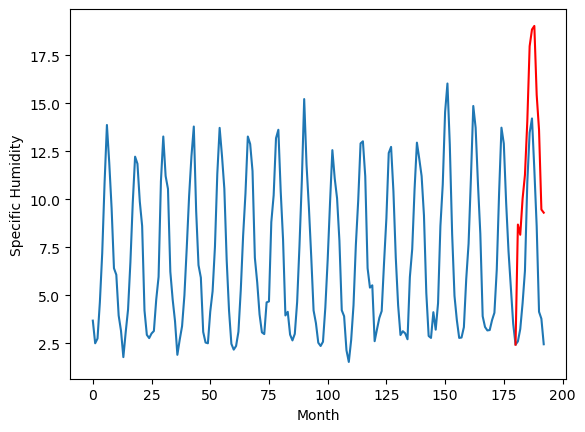

Weather Station 5:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.82		3.61		-0.21
3.80		3.08		-0.72
7.09		4.96		-2.13
7.11		6.19		-0.92
10.31		8.97		-1.34
14.20		12.90		-1.30
15.23		13.77		-1.46
14.83		13.95		-0.88
12.69		10.36		-2.33
10.16		8.53		-1.63
4.50		4.39		-0.11
7.78		4.22		-3.56
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[6.65, 3.6074316599965095, 3.0755364993214607, 4.9597333768010134, 6.1920801499485965, 8.972292790710926, 12.89922989398241, 13.765117953121662, 13.946564237177371, 10.356897393763065, 8.531735459864139, 4.3857779899239535, 4.224900419414043]


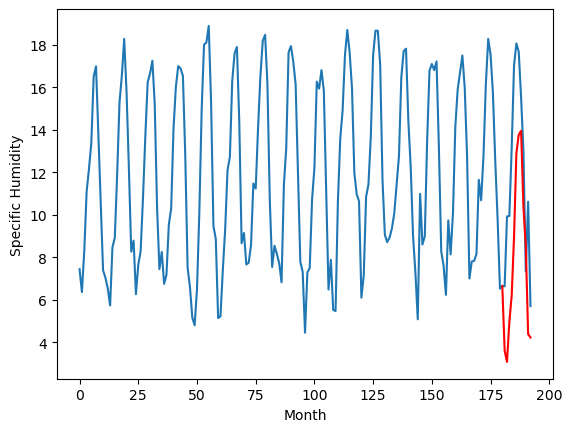

Weather Station 6:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
7.31		7.36		0.05
7.26		6.83		-0.43
10.25		8.71		-1.54
11.82		9.94		-1.88
16.65		12.72		-3.93
19.29		16.65		-2.64
18.25		17.51		-0.74
18.38		17.69		-0.69
14.82		14.10		-0.72
13.23		12.27		-0.96
9.04		8.13		-0.91
11.91		7.97		-3.94
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[6.19, 7.359435471296311, 6.8260302269458775, 8.707925411462785, 9.94019457936287, 12.719693633317949, 16.648448678255082, 17.510941120386125, 17.689202564358713, 14.09971501171589, 12.274398820996286, 8.133611696362497, 7.974056425094606]


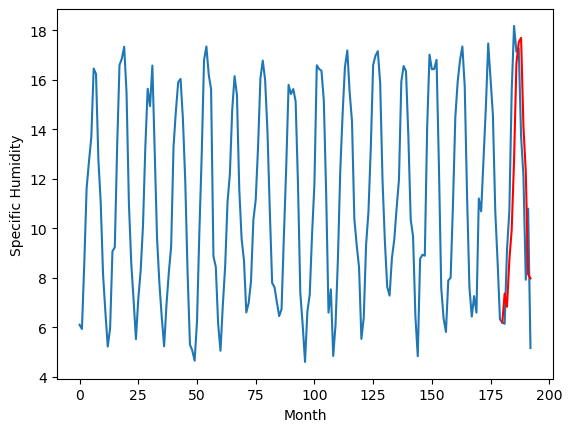

Weather Station 7:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
6.00		6.02		0.02
5.67		5.49		-0.18
8.53		7.37		-1.16
9.85		8.60		-1.25
14.05		11.38		-2.67
17.80		15.31		-2.49
18.62		16.17		-2.45
19.00		16.34		-2.66
14.55		12.75		-1.80
11.94		10.93		-1.01
7.95		6.79		-1.16
10.45		6.63		-3.82
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[4.78, 6.020661993324756, 5.486734254658222, 7.368684037029743, 8.59981439858675, 11.378647787868976, 15.307719929516315, 16.167423172295095, 16.342771796882154, 12.752716092765333, 10.927119283378126, 6.788374452292921, 6.625307245552541]


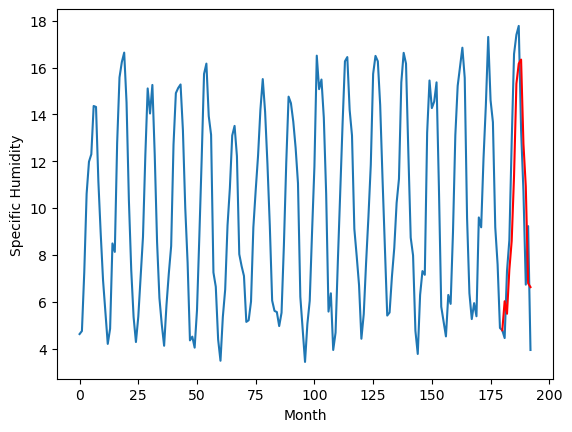

Weather Station 8:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.90		4.54		-0.36
4.77		4.00		-0.77
4.86		5.89		1.03
5.16		7.12		1.96
5.28		9.89		4.61
7.94		13.82		5.88
13.18		14.68		1.50
13.47		14.86		1.39
10.71		11.27		0.56
7.00		9.45		2.45
5.35		5.31		-0.04
5.48		5.15		-0.33
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.61, 4.539063352048397, 4.001943605840206, 5.886318701207638, 7.116072672307491, 9.892094629704953, 13.818475264012815, 14.681099909245969, 14.861511709988118, 11.274778845608235, 9.448431136906148, 5.313601615726949, 5.152986007630826]


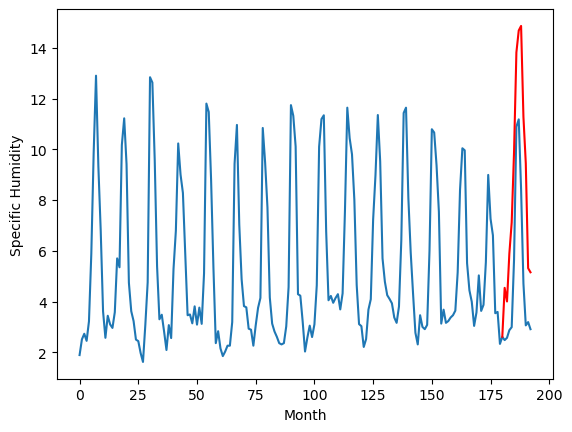

Weather Station 9:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
2.74		1.81		-0.93
3.27		1.27		-2.00
3.38		3.15		-0.23
4.70		4.38		-0.32
6.18		7.15		0.97
7.43		11.07		3.64
8.58		11.93		3.35
7.98		12.11		4.13
7.52		8.53		1.01
4.72		6.69		1.97
4.18		2.56		-1.62
4.00		2.40		-1.60
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[4.6, 1.8124349707365035, 1.27250295817852, 3.1538416737318036, 4.3783101433515546, 7.148436724543571, 11.068178355097771, 11.932339369654656, 12.111923589706421, 8.525578632354737, 6.693558468818665, 2.5620877885818487, 2.398452102541924]


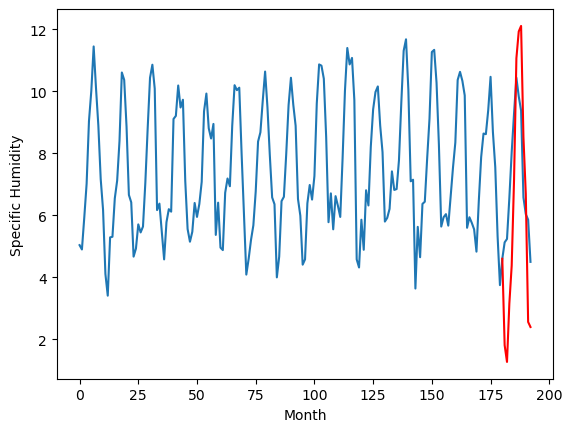

Weather Station 10:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.92		4.96		0.04
4.99		4.43		-0.56
6.72		6.32		-0.40
7.25		7.55		0.30
9.96		10.32		0.36
14.46		14.25		-0.21
15.98		15.11		-0.87
16.56		15.29		-1.27
12.96		11.71		-1.25
10.80		9.88		-0.92
5.24		5.74		0.50
7.09		5.58		-1.51
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[4.27, 4.963217050731182, 4.431288332641125, 6.315016836822033, 7.546434492766857, 10.32209739178419, 14.246906132400035, 15.111537487208842, 15.293106378018855, 11.706851542890071, 9.879556477963924, 5.739910901486873, 5.578782857358455]


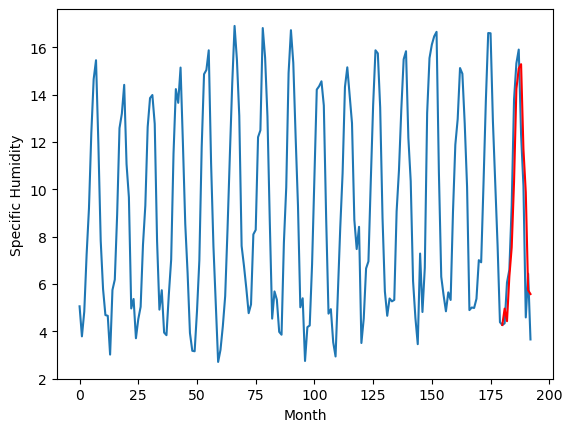

Weather Station 11:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.07		4.98		-0.09
5.31		4.45		-0.86
6.34		6.33		-0.01
6.95		7.57		0.62
9.62		10.34		0.72
13.72		14.27		0.55
15.13		15.14		0.01
15.52		15.32		-0.20
12.31		11.73		-0.58
10.58		9.90		-0.68
5.22		5.76		0.54
6.78		5.60		-1.18
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[3.91, 4.980164875686168, 4.447950234115123, 6.333662380874157, 7.56658481568098, 10.342006196677684, 14.269936551749705, 15.137027671039103, 15.317700018584727, 11.731483330428599, 9.90398191422224, 5.760855903327464, 5.600316931903361]


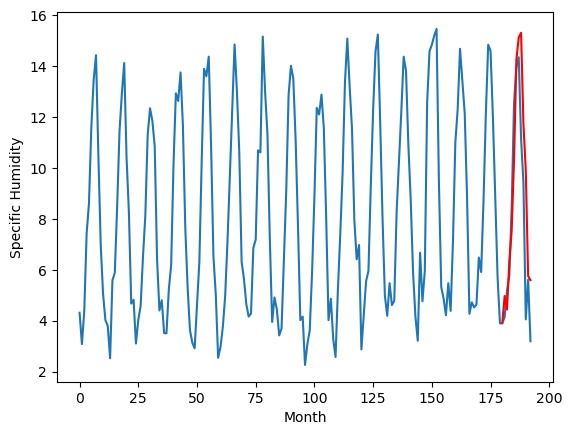

Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    4.83   4.981927
1                 1    4.92   4.894683
2                 2    2.95   2.378960
3                 3    7.70   8.693285
4                 4    3.82   3.607432
5                 5    7.31   7.359435
6                 6    6.00   6.020662
7                 7    4.90   4.539063
8                 8    2.74   1.812435
9                 9    4.92   4.963217
10               10    5.07   4.980165


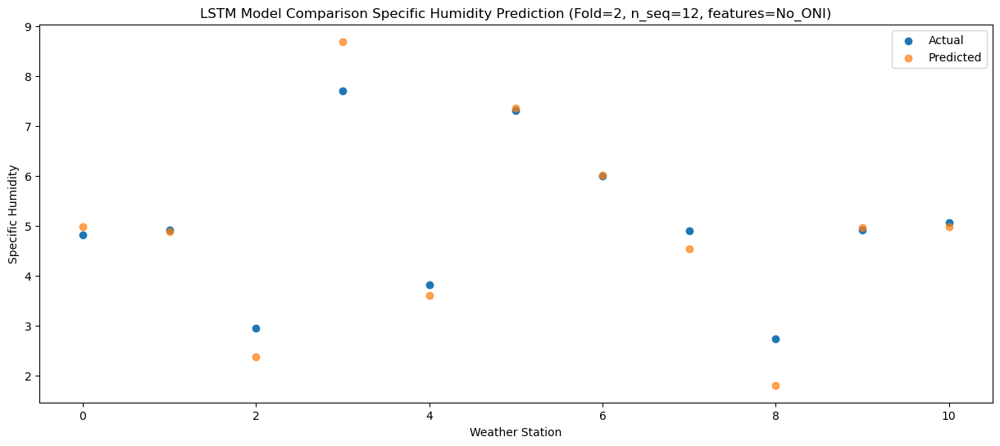

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    4.11   4.456499
1                 1    4.24   4.364462
2                 2    5.08   1.844542
3                 3    7.87   8.163322
4                 4    3.80   3.075536
5                 5    7.26   6.826030
6                 6    5.67   5.486734
7                 7    4.77   4.001944
8                 8    3.27   1.272503
9                 9    4.99   4.431288
10               10    5.31   4.447950


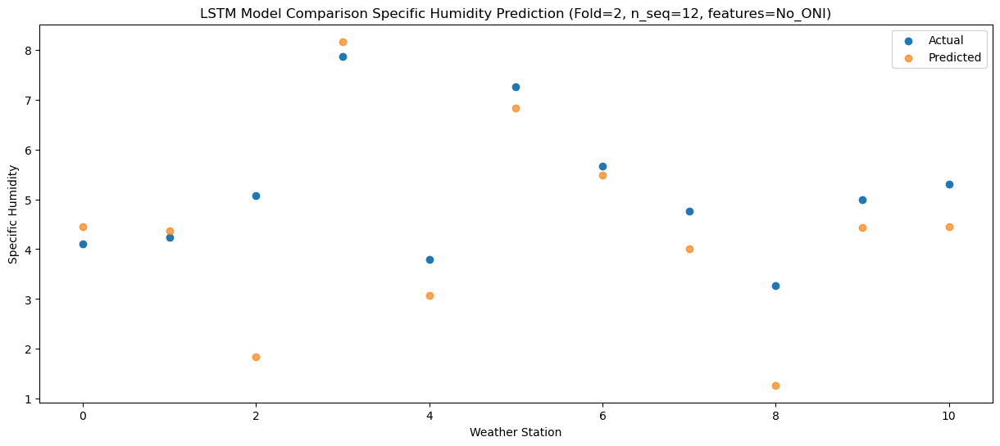

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0    7.39   6.344143
1                 1    6.09   6.252220
2                 2    5.30   3.723892
3                 3    8.51  10.043788
4                 4    7.09   4.959733
5                 5   10.25   8.707925
6                 6    8.53   7.368684
7                 7    4.86   5.886319
8                 8    3.38   3.153842
9                 9    6.72   6.315017
10               10    6.34   6.333662


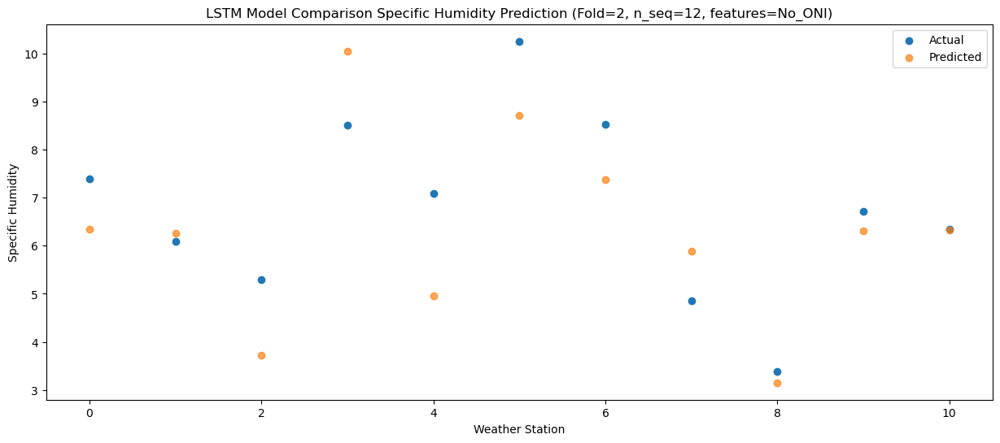

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0    7.78   7.583465
1                 1    6.21   7.486347
2                 2    6.27   4.955555
3                 3    9.86  11.277473
4                 4    7.11   6.192080
5                 5   11.82   9.940195
6                 6    9.85   8.599814
7                 7    5.16   7.116073
8                 8    4.70   4.378310
9                 9    7.25   7.546434
10               10    6.95   7.566585


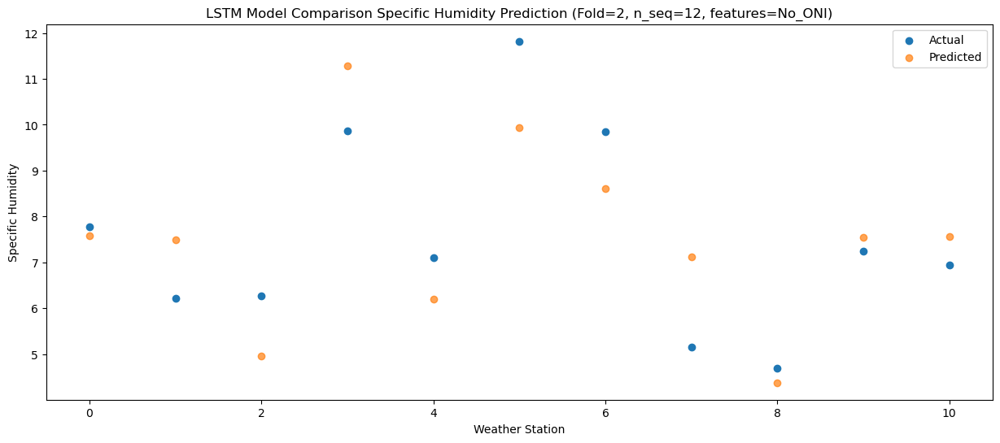

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0   10.45  10.367098
1                 1   11.33  10.265984
2                 2    7.58   7.735186
3                 3   11.54  14.058558
4                 4   10.31   8.972293
5                 5   16.65  12.719694
6                 6   14.05  11.378648
7                 7    5.28   9.892095
8                 8    6.18   7.148437
9                 9    9.96  10.322097
10               10    9.62  10.342006


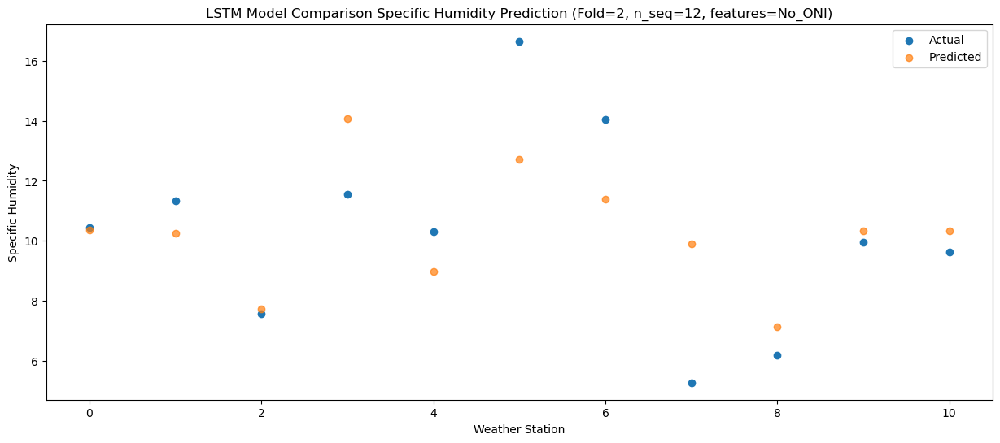

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   15.10  14.301339
1                 1   14.24  14.192876
2                 2   11.36  11.662400
3                 3   16.14  17.982695
4                 4   14.20  12.899230
5                 5   19.29  16.648449
6                 6   17.80  15.307720
7                 7    7.94  13.818475
8                 8    7.43  11.068178
9                 9   14.46  14.246906
10               10   13.72  14.269937


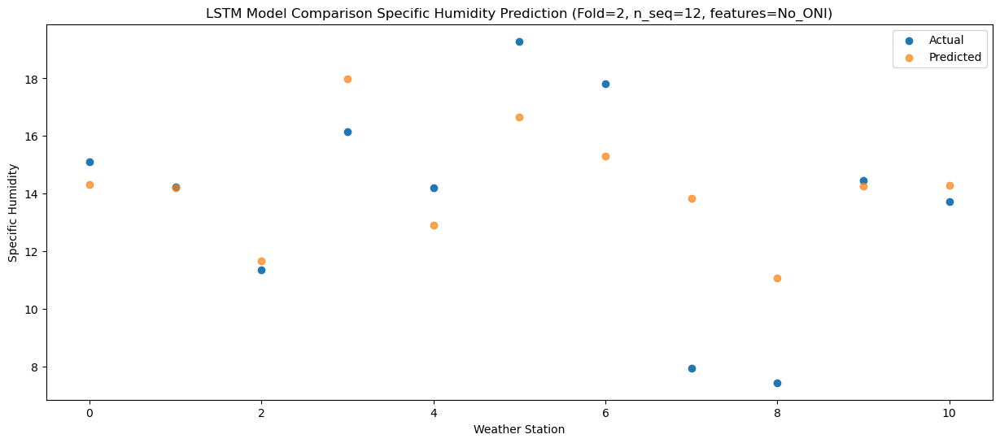

Predictions for (t+6):
    Weather_Station  Actual  Predicted
0                 0   17.20  15.174155
1                 1   15.85  15.064014
2                 2   11.76  12.530779
3                 3   18.74  18.854520
4                 4   15.23  13.765118
5                 5   18.25  17.510941
6                 6   18.62  16.167423
7                 7   13.18  14.681100
8                 8    8.58  11.932339
9                 9   15.98  15.111537
10               10   15.13  15.137028


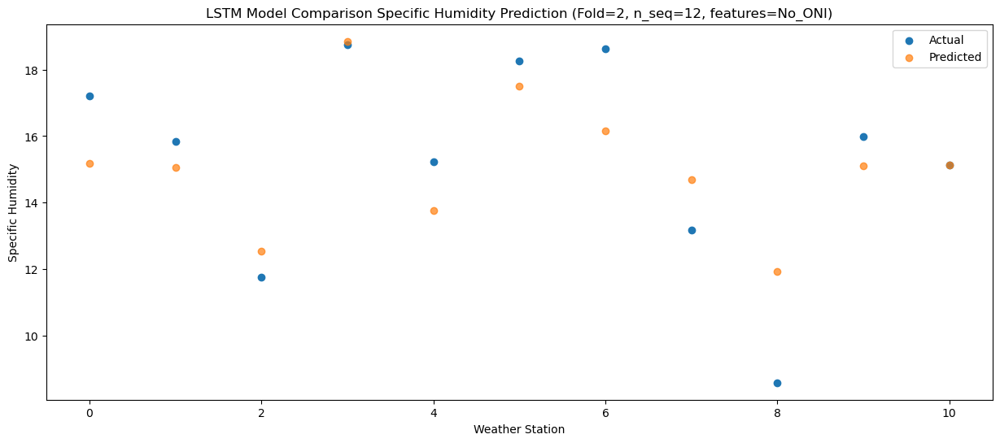

Predictions for (t+7):
    Weather_Station  Actual  Predicted
0                 0   16.90  15.353408
1                 1   14.23  15.241328
2                 2   12.38  12.713490
3                 3   19.48  19.039076
4                 4   14.83  13.946564
5                 5   18.38  17.689203
6                 6   19.00  16.342772
7                 7   13.47  14.861512
8                 8    7.98  12.111924
9                 9   16.56  15.293106
10               10   15.52  15.317700


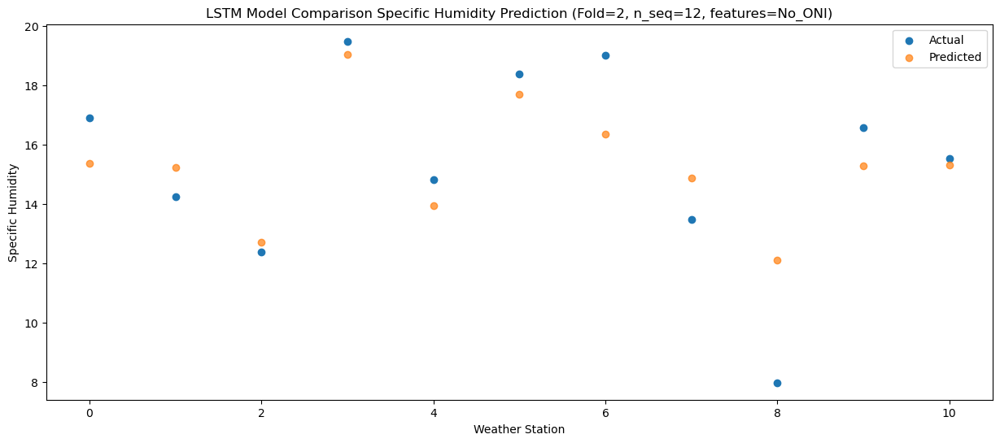

Predictions for (t+8):
    Weather_Station  Actual  Predicted
0                 0   13.13  11.758588
1                 1   11.41  11.646520
2                 2   11.10   9.120611
3                 3   16.82  15.446882
4                 4   12.69  10.356897
5                 5   14.82  14.099715
6                 6   14.55  12.752716
7                 7   10.71  11.274779
8                 8    7.52   8.525579
9                 9   12.96  11.706852
10               10   12.31  11.731483


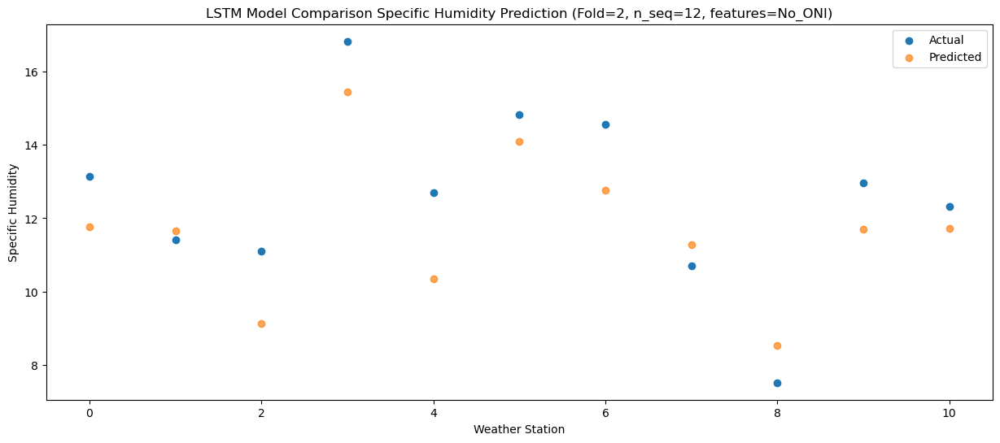

Predictions for (t+9):
    Weather_Station  Actual  Predicted
0                 0   10.68   9.939033
1                 1    8.02   9.824880
2                 2    8.44   7.297855
3                 3   13.86  13.621672
4                 4   10.16   8.531735
5                 5   13.23  12.274399
6                 6   11.94  10.927119
7                 7    7.00   9.448431
8                 8    4.72   6.693558
9                 9   10.80   9.879556
10               10   10.58   9.903982


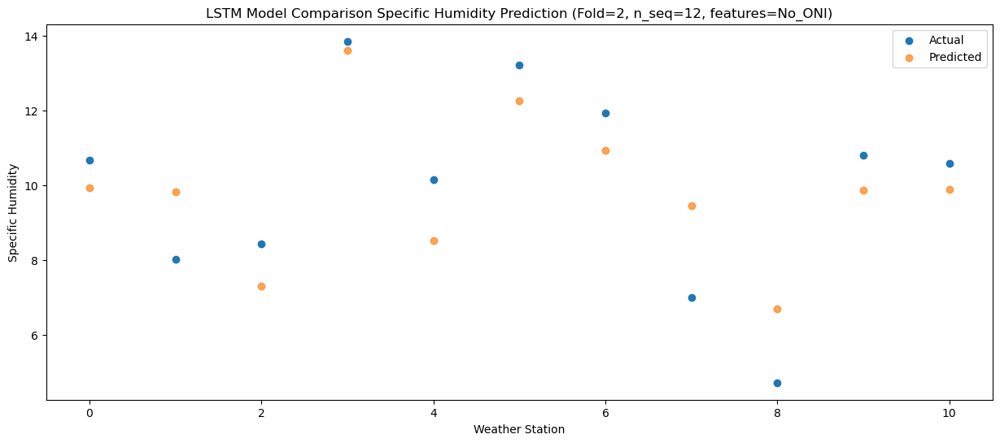

Predictions for (t+10):
    Weather_Station  Actual  Predicted
0                 0    5.49   5.792059
1                 1    5.59   5.683992
2                 2    4.49   3.152652
3                 3    9.41   9.477212
4                 4    4.50   4.385778
5                 5    9.04   8.133612
6                 6    7.95   6.788374
7                 7    5.35   5.313602
8                 8    4.18   2.562088
9                 9    5.24   5.739911
10               10    5.22   5.760856


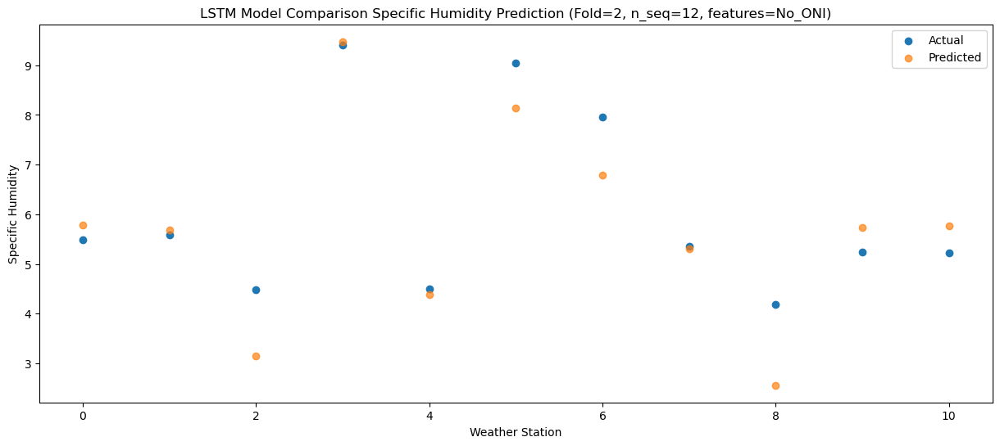

Predictions for (t+11):
    Weather_Station  Actual  Predicted
0                 0    7.89   5.626888
1                 1    4.53   5.513413
2                 2    5.89   2.990231
3                 3    9.05   9.312864
4                 4    7.78   4.224900
5                 5   11.91   7.974056
6                 6   10.45   6.625307
7                 7    5.48   5.152986
8                 8    4.00   2.398452
9                 9    7.09   5.578783
10               10    6.78   5.600317


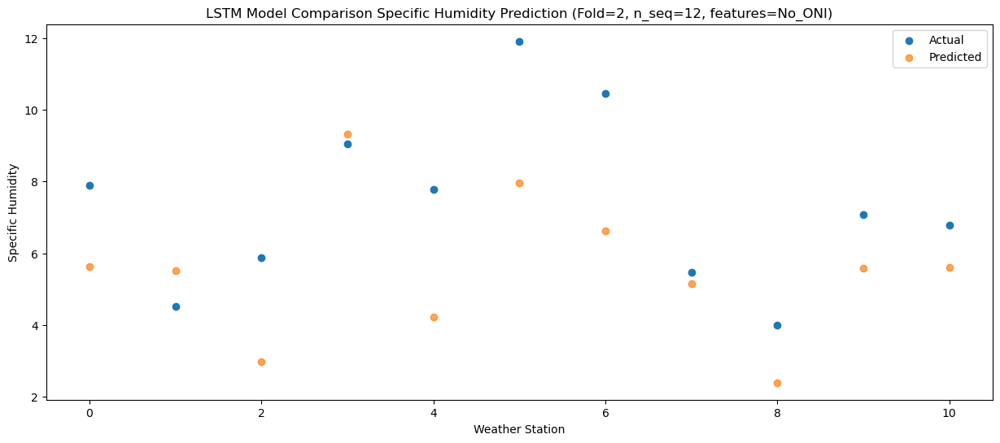

f, t:
[[ 4.83  4.92  2.95  7.7   3.82  7.31  6.    4.9   2.74  4.92  5.07]
 [ 4.11  4.24  5.08  7.87  3.8   7.26  5.67  4.77  3.27  4.99  5.31]
 [ 7.39  6.09  5.3   8.51  7.09 10.25  8.53  4.86  3.38  6.72  6.34]
 [ 7.78  6.21  6.27  9.86  7.11 11.82  9.85  5.16  4.7   7.25  6.95]
 [10.45 11.33  7.58 11.54 10.31 16.65 14.05  5.28  6.18  9.96  9.62]
 [15.1  14.24 11.36 16.14 14.2  19.29 17.8   7.94  7.43 14.46 13.72]
 [17.2  15.85 11.76 18.74 15.23 18.25 18.62 13.18  8.58 15.98 15.13]
 [16.9  14.23 12.38 19.48 14.83 18.38 19.   13.47  7.98 16.56 15.52]
 [13.13 11.41 11.1  16.82 12.69 14.82 14.55 10.71  7.52 12.96 12.31]
 [10.68  8.02  8.44 13.86 10.16 13.23 11.94  7.    4.72 10.8  10.58]
 [ 5.49  5.59  4.49  9.41  4.5   9.04  7.95  5.35  4.18  5.24  5.22]
 [ 7.89  4.53  5.89  9.05  7.78 11.91 10.45  5.48  4.    7.09  6.78]]
[[ 4.98192731  4.89468256  2.3789599   8.69328514  3.60743166  7.35943547
   6.02066199  4.53906335  1.81243497  4.96321705  4.98016488]
 [ 4.45649854  4.36446217  1

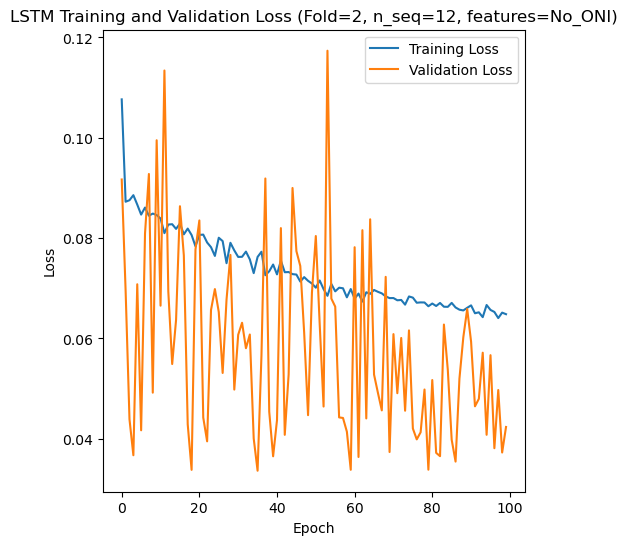

[[ 5.11  3.7   4.74 ... 13.5   8.68  7.66]
 [ 3.73  2.91  5.05 ... 11.19  6.96  6.57]
 [ 5.56  5.41  5.55 ...  8.56  7.45  5.59]
 ...
 [ 2.73  2.21  3.23 ...  5.    3.95  3.09]
 [ 5.93  5.59  5.49 ...  8.63  7.04  6.11]
 [ 3.71  2.55  2.84 ...  9.78  6.68  4.77]]
Epoch 1/100
84/84 [==============================] - 46s 363ms/step - loss: 0.1142 - accuracy: 0.5833 - mae: 0.0933 - rmse: 0.1142 - mape: 22.0160 - pearson: 0.6895 - val_loss: 0.0690 - val_accuracy: 0.9000 - val_mae: 0.0517 - val_rmse: 0.0690 - val_mape: 11.4741 - val_pearson: 0.7208
Epoch 2/100
84/84 [==============================] - 22s 265ms/step - loss: 0.0809 - accuracy: 0.5714 - mae: 0.0642 - rmse: 0.0809 - mape: 14.7194 - pearson: 0.7402 - val_loss: 0.1487 - val_accuracy: 0.1000 - val_mae: 0.1070 - val_rmse: 0.1487 - val_mape: 25.9018 - val_pearson: 0.2887
Epoch 3/100
84/84 [==============================] - 23s 271ms/step - loss: 0.0840 - accuracy: 0.5595 - mae: 0.0672 - rmse: 0.0840 - mape: 15.3445 - pearson: 0.7367

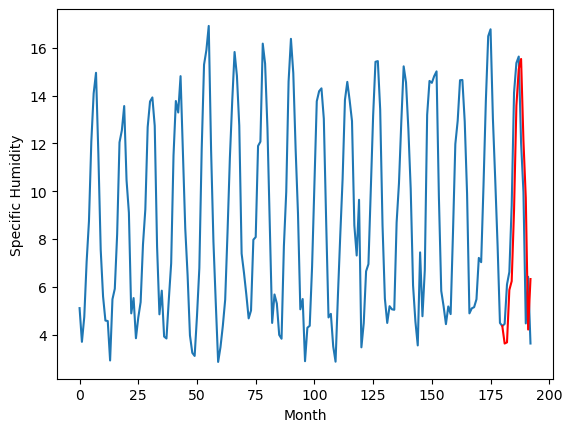

Weather Station 2:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.02		5.03		0.01
4.46		5.08		0.62
6.97		7.27		0.30
8.14		7.64		-0.50
11.66		10.61		-1.05
16.19		14.98		-1.21
17.07		16.51		-0.56
17.24		16.94		-0.30
13.27		13.52		0.25
11.08		11.13		0.05
6.65		5.62		-1.03
7.62		7.73		0.11
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[3.43, 5.030757651329041, 5.079887260347605, 7.271445859819651, 7.64174901381135, 10.612185110002756, 14.979115594774484, 16.50689517393708, 16.936419834047555, 13.524861682802438, 11.131936420351266, 5.624030937105417, 7.734774698168039]


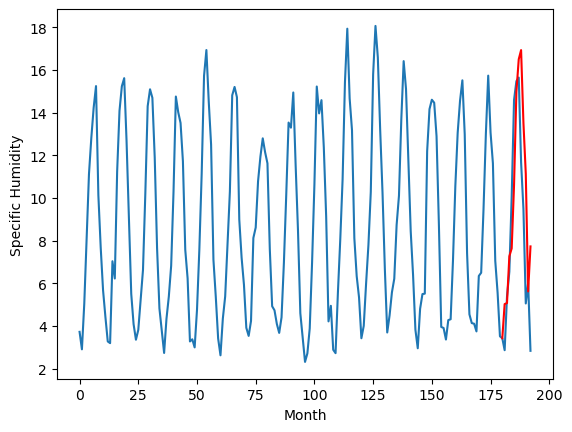

Weather Station 3:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.17		3.65		-0.52
4.11		3.70		-0.41
4.19		5.89		1.70
4.81		6.25		1.44
5.21		9.23		4.02
7.66		13.60		5.94
8.36		15.12		6.76
7.89		15.55		7.66
6.60		12.14		5.54
5.46		9.75		4.29
6.04		4.24		-1.80
4.54		6.35		1.81
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[5.43, 3.6537696826457977, 3.7015602919459343, 5.88712171047926, 6.253713372647763, 9.226633313596249, 13.595012906491757, 15.121582034528256, 15.549102548062802, 12.139455321729184, 9.74697089523077, 4.243746522367001, 6.351241830289364]


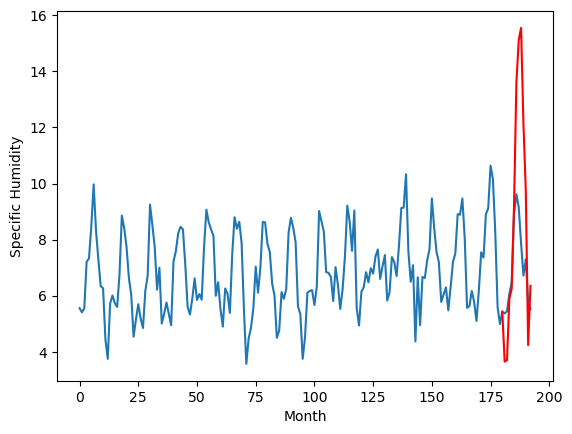

Weather Station 4:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.29		5.48		0.19
5.22		5.53		0.31
6.52		7.71		1.19
7.71		8.09		0.38
10.24		11.06		0.82
15.66		15.42		-0.24
16.29		16.95		0.66
17.17		17.38		0.21
13.70		13.97		0.27
11.64		11.57		-0.07
5.95		6.07		0.12
7.09		8.18		1.09
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[3.21, 5.479654548168182, 5.5253646312654014, 7.714915031045675, 8.088112735599278, 11.055400991290806, 15.421995305866002, 16.951646590083836, 17.3780736862123, 13.966763490289448, 11.573740476220845, 6.065914147943257, 8.175242656320332]


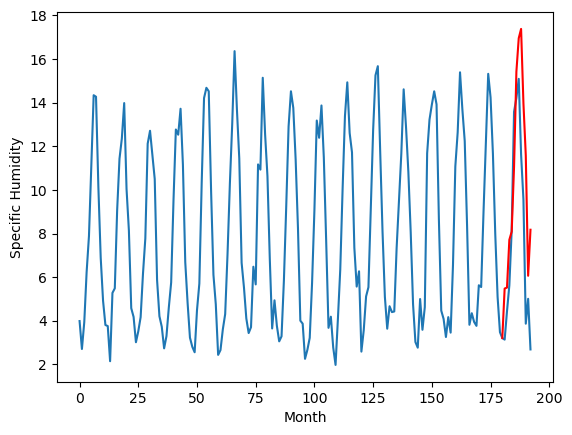

Weather Station 5:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.79		3.91		0.12
2.96		3.96		1.00
5.44		6.15		0.71
6.50		6.52		0.02
8.92		9.48		0.56
13.38		13.85		0.47
15.33		15.38		0.05
15.42		15.81		0.39
11.65		12.39		0.74
9.70		10.00		0.30
4.58		4.49		-0.09
5.28		6.59		1.31
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[3.04, 3.9115741083025934, 3.9551398584246638, 6.14567945688963, 6.516930056512356, 9.482747984826565, 13.848694277703762, 15.3780420550704, 15.806083662211895, 12.39202783793211, 10.000202161967755, 4.486765367686749, 6.594133121669293]


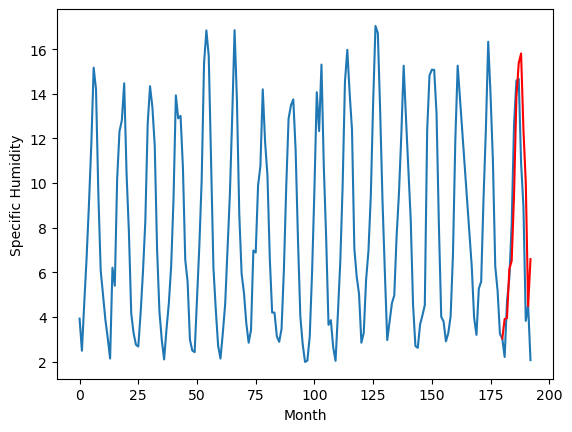

Weather Station 6:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.62		3.85		0.23
3.10		3.90		0.80
5.13		6.09		0.96
6.43		6.46		0.03
8.67		9.42		0.75
13.89		13.79		-0.10
15.14		15.31		0.17
15.31		15.74		0.43
12.01		12.33		0.32
10.39		9.93		-0.46
4.52		4.42		-0.10
5.57		6.52		0.95
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.91, 3.8537169921398164, 3.895470016002655, 6.085532777309417, 6.458252899646759, 9.420576803684234, 13.785106890201568, 15.314909927845001, 15.74150233745575, 12.325676970481872, 9.93371253490448, 4.4186339902877805, 6.5247507619857785]


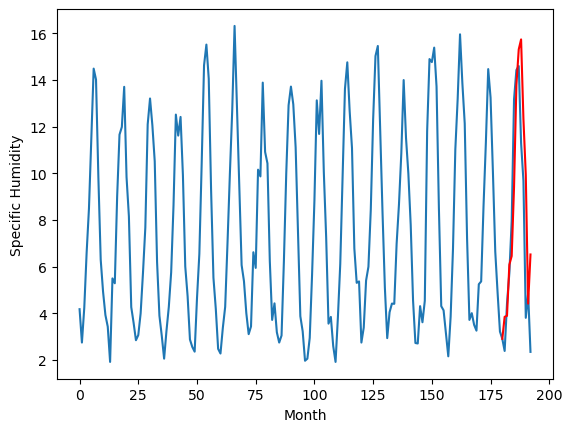

Weather Station 7:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.35		4.11		-0.24
4.41		4.15		-0.26
4.72		6.34		1.62
5.19		6.71		1.52
6.59		9.68		3.09
7.92		14.04		6.12
10.37		15.57		5.20
8.94		15.99		7.05
7.24		12.58		5.34
6.15		10.18		4.03
5.44		4.67		-0.77
4.73		6.78		2.05
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[1.6, 4.106702432334423, 4.151908818930387, 6.340259496420622, 6.710763726681471, 9.675247464627027, 14.04060295626521, 15.568146620243787, 15.9906321208179, 12.576915327757597, 10.18236190482974, 4.673796955794096, 6.781709973067045]


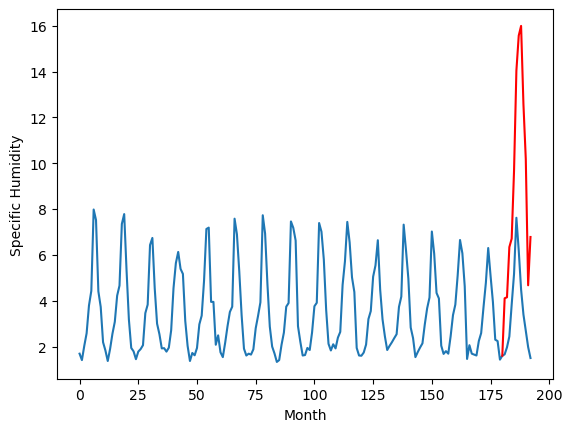

Weather Station 8:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
2.50		1.62		-0.88
2.02		1.66		-0.36
2.32		3.85		1.53
2.01		4.22		2.21
2.57		7.19		4.62
3.99		11.56		7.57
9.35		13.08		3.73
6.92		13.51		6.59
5.20		10.09		4.89
4.10		7.70		3.60
2.83		2.20		-0.63
2.97		4.30		1.33
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.86, 1.6153233075141906, 1.6629253947734832, 3.847823771238327, 4.215906205177307, 7.186753334999084, 11.555431904792785, 13.083798351287841, 13.510197403430938, 10.094702961444854, 7.70254779100418, 2.196661236286163, 4.3042185330390925]


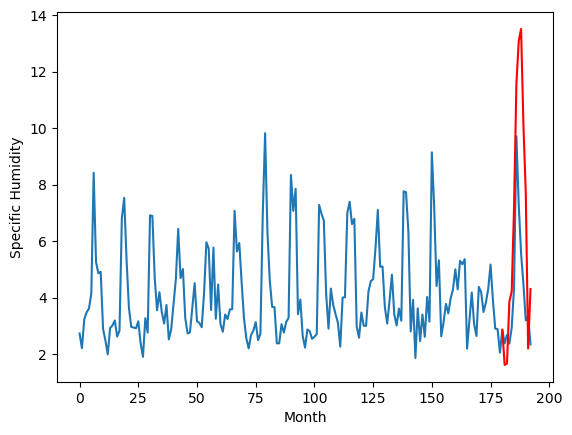

Weather Station 9:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.40		2.65		-0.75
3.05		2.70		-0.35
2.70		4.89		2.19
3.63		5.25		1.62
4.07		8.22		4.15
5.50		12.59		7.09
5.98		14.12		8.14
6.37		14.54		8.17
5.73		11.12		5.39
4.70		8.73		4.03
4.92		3.23		-1.69
3.67		5.33		1.66
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[5.65, 2.653108398914337, 2.701104934811592, 4.88527518093586, 5.250760819315911, 8.222882058024407, 12.59010055243969, 14.11616792857647, 14.53892799794674, 11.124702658057213, 8.731474842429161, 3.226280655264855, 5.332581009268761]


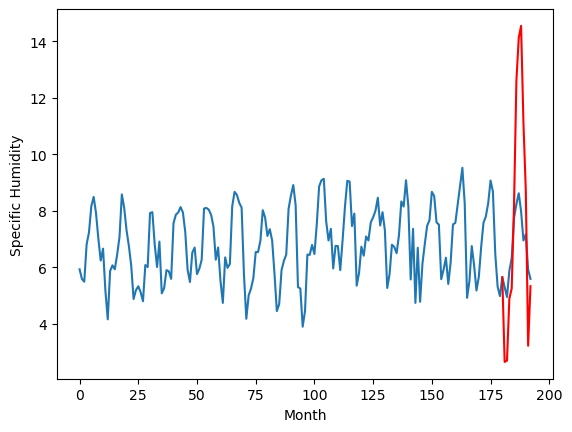

Weather Station 10:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.84		5.85		1.01
4.99		5.90		0.91
5.77		8.09		2.32
7.15		8.46		1.31
8.72		11.43		2.71
13.62		15.80		2.18
15.83		17.32		1.49
16.21		17.75		1.54
13.61		14.33		0.72
11.07		11.94		0.87
6.54		6.43		-0.11
6.24		8.54		2.30
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.54, 5.853937901854515, 5.901410438418388, 8.089641191363334, 8.460977830290794, 11.427057780623436, 15.79562429368496, 17.32424692094326, 17.750024326443672, 14.334843166470527, 11.941377409100532, 6.432819135785103, 8.540498264431953]


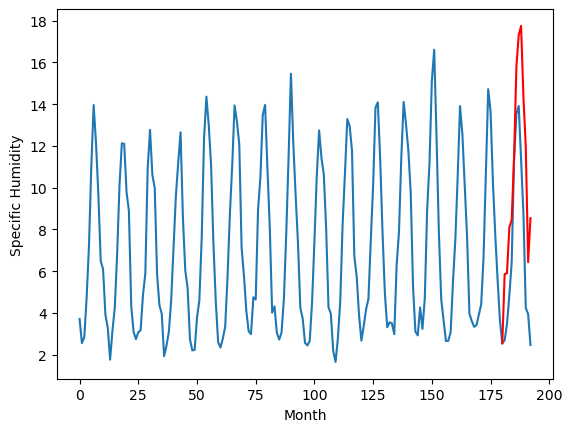

Weather Station 11:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.02		3.63		0.61
2.88		3.68		0.80
4.16		5.87		1.71
5.57		6.24		0.67
7.16		9.20		2.04
12.03		13.57		1.54
13.72		15.10		1.38
14.04		15.53		1.49
11.12		12.11		0.99
9.22		9.72		0.50
4.30		4.21		-0.09
4.20		6.32		2.12
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.51, 3.631527698636055, 3.678806877732277, 5.86737809240818, 6.239953196644783, 9.203751481175424, 13.571768677830697, 15.101110613942147, 15.526711083054543, 12.112153626084329, 9.71951923429966, 4.209447479844094, 6.31563386976719]


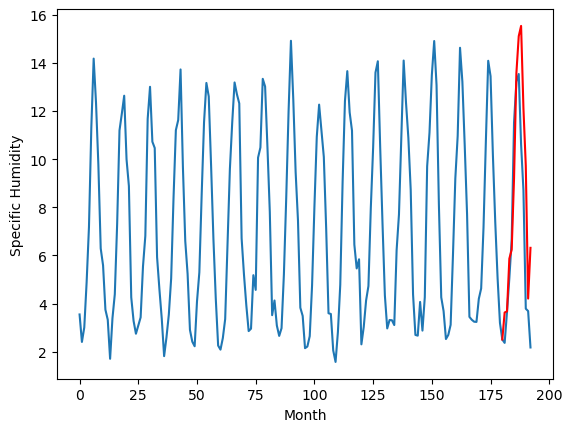

Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    3.58   3.628916
1                 1    5.02   5.030758
2                 2    4.17   3.653770
3                 3    5.29   5.479655
4                 4    3.79   3.911574
5                 5    3.62   3.853717
6                 6    4.35   4.106702
7                 7    2.50   1.615323
8                 8    3.40   2.653108
9                 9    4.84   5.853938
10               10    3.02   3.631528


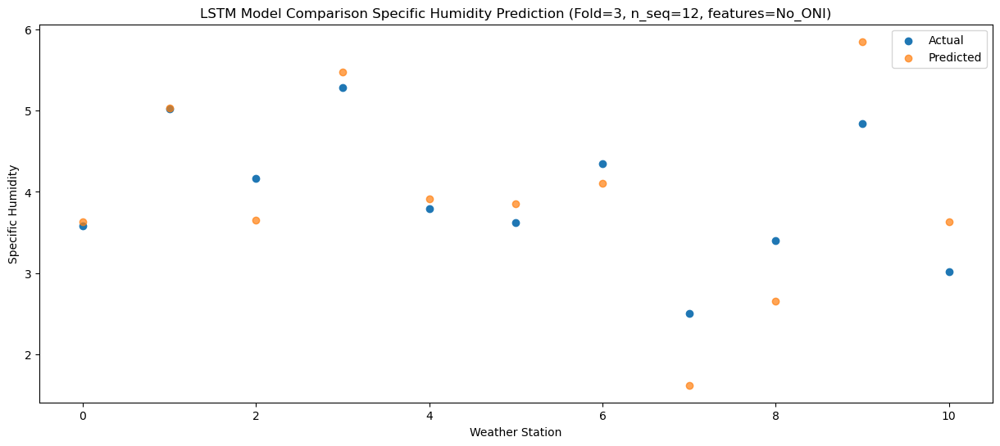

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    3.67   3.677880
1                 1    4.46   5.079887
2                 2    4.11   3.701560
3                 3    5.22   5.525365
4                 4    2.96   3.955140
5                 5    3.10   3.895470
6                 6    4.41   4.151909
7                 7    2.02   1.662925
8                 8    3.05   2.701105
9                 9    4.99   5.901410
10               10    2.88   3.678807


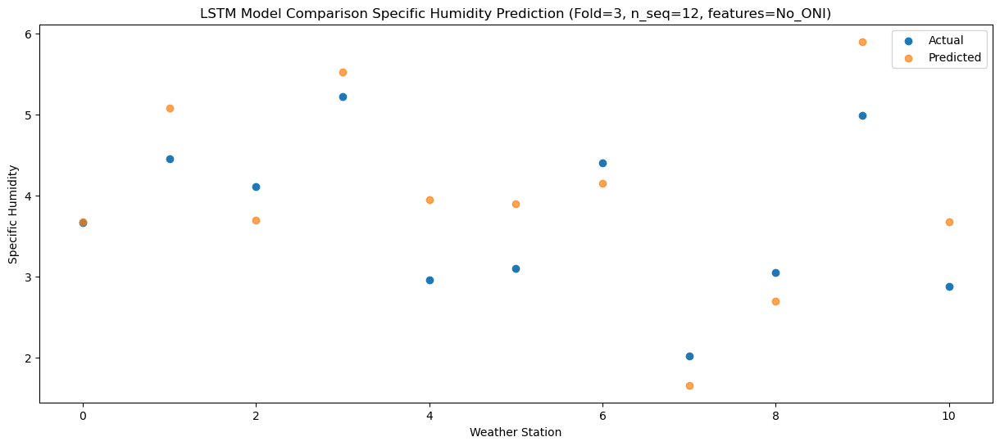

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0    5.32   5.868318
1                 1    6.97   7.271446
2                 2    4.19   5.887122
3                 3    6.52   7.714915
4                 4    5.44   6.145679
5                 5    5.13   6.085533
6                 6    4.72   6.340259
7                 7    2.32   3.847824
8                 8    2.70   4.885275
9                 9    5.77   8.089641
10               10    4.16   5.867378


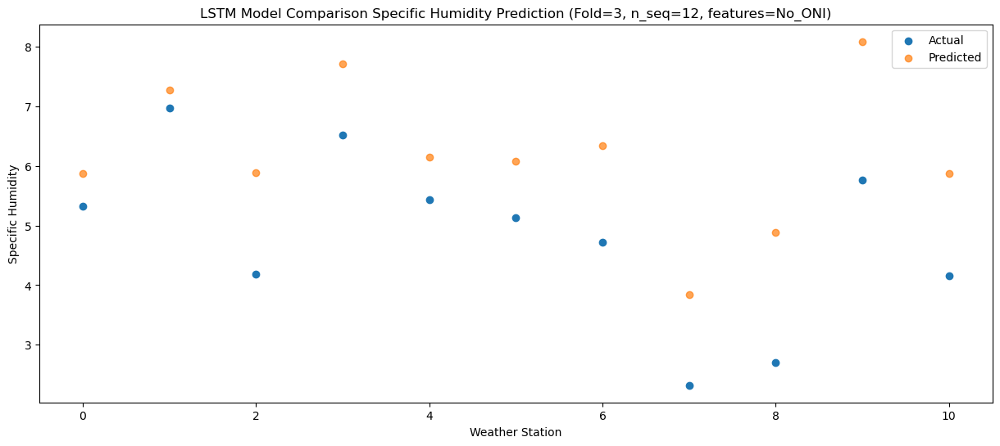

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0    5.84   6.236669
1                 1    8.14   7.641749
2                 2    4.81   6.253713
3                 3    7.71   8.088113
4                 4    6.50   6.516930
5                 5    6.43   6.458253
6                 6    5.19   6.710764
7                 7    2.01   4.215906
8                 8    3.63   5.250761
9                 9    7.15   8.460978
10               10    5.57   6.239953


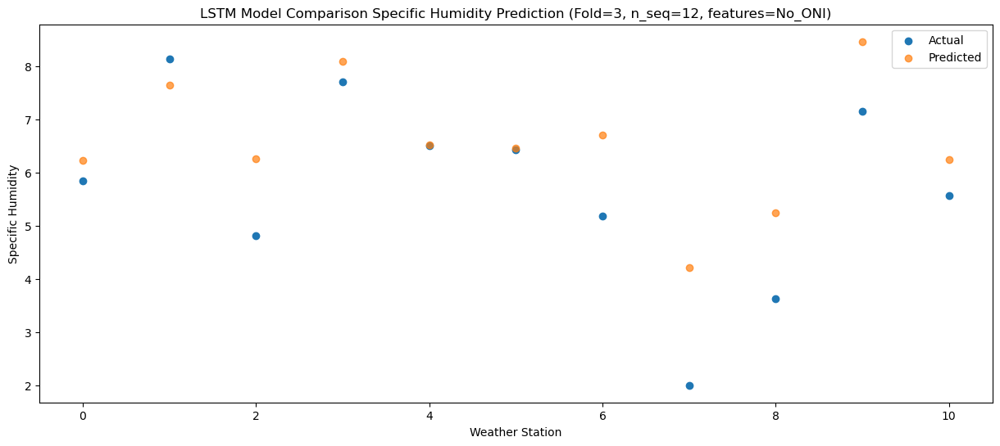

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0    8.62   9.204800
1                 1   11.66  10.612185
2                 2    5.21   9.226633
3                 3   10.24  11.055401
4                 4    8.92   9.482748
5                 5    8.67   9.420577
6                 6    6.59   9.675247
7                 7    2.57   7.186753
8                 8    4.07   8.222882
9                 9    8.72  11.427058
10               10    7.16   9.203751


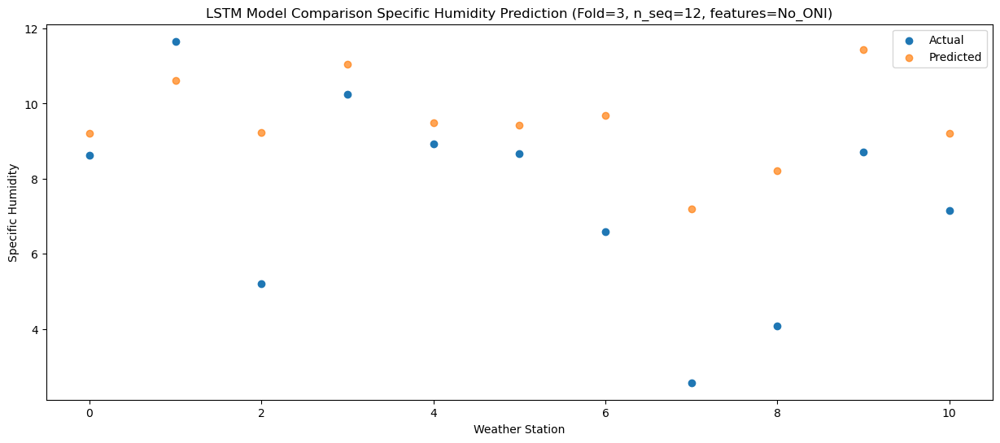

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   13.34  13.572050
1                 1   16.19  14.979116
2                 2    7.66  13.595013
3                 3   15.66  15.421995
4                 4   13.38  13.848694
5                 5   13.89  13.785107
6                 6    7.92  14.040603
7                 7    3.99  11.555432
8                 8    5.50  12.590101
9                 9   13.62  15.795624
10               10   12.03  13.571769


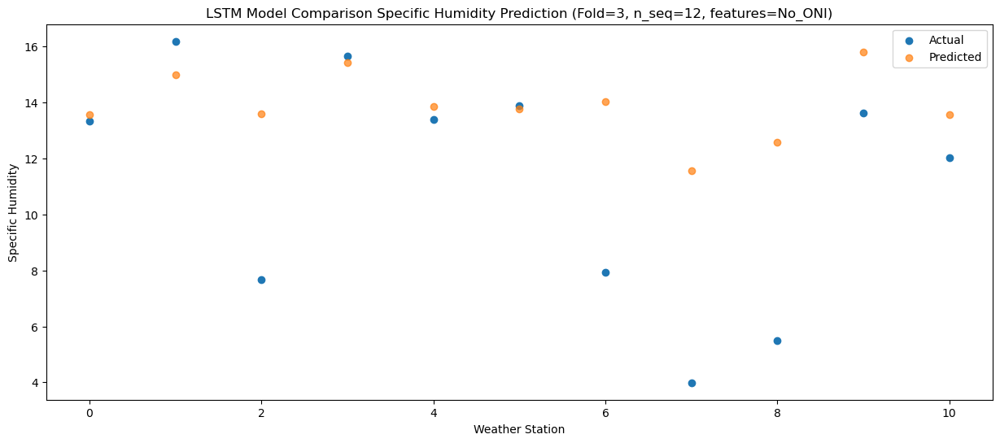

Predictions for (t+6):
    Weather_Station  Actual  Predicted
0                 0   14.58  15.101148
1                 1   17.07  16.506895
2                 2    8.36  15.121582
3                 3   16.29  16.951647
4                 4   15.33  15.378042
5                 5   15.14  15.314910
6                 6   10.37  15.568147
7                 7    9.35  13.083798
8                 8    5.98  14.116168
9                 9   15.83  17.324247
10               10   13.72  15.101111


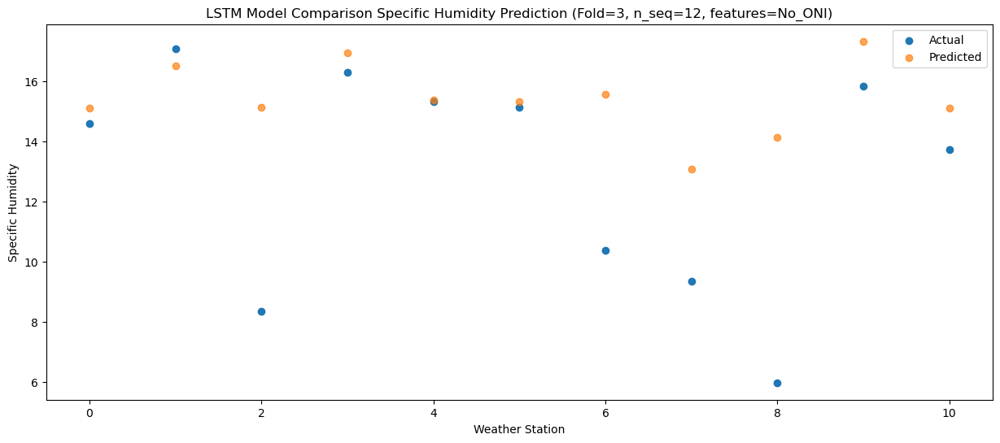

Predictions for (t+7):
    Weather_Station  Actual  Predicted
0                 0   14.85  15.527903
1                 1   17.24  16.936420
2                 2    7.89  15.549103
3                 3   17.17  17.378074
4                 4   15.42  15.806084
5                 5   15.31  15.741502
6                 6    8.94  15.990632
7                 7    6.92  13.510197
8                 8    6.37  14.538928
9                 9   16.21  17.750024
10               10   14.04  15.526711


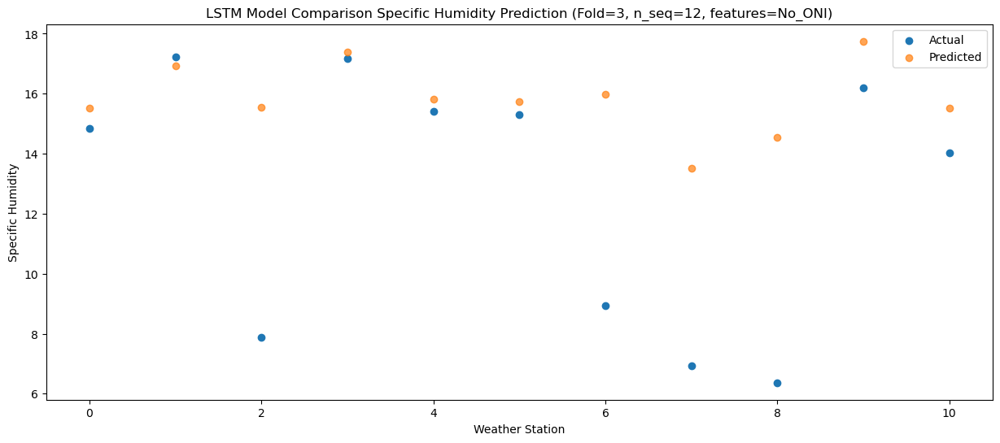

Predictions for (t+8):
    Weather_Station  Actual  Predicted
0                 0   11.23  12.118611
1                 1   13.27  13.524862
2                 2    6.60  12.139455
3                 3   13.70  13.966763
4                 4   11.65  12.392028
5                 5   12.01  12.325677
6                 6    7.24  12.576915
7                 7    5.20  10.094703
8                 8    5.73  11.124703
9                 9   13.61  14.334843
10               10   11.12  12.112154


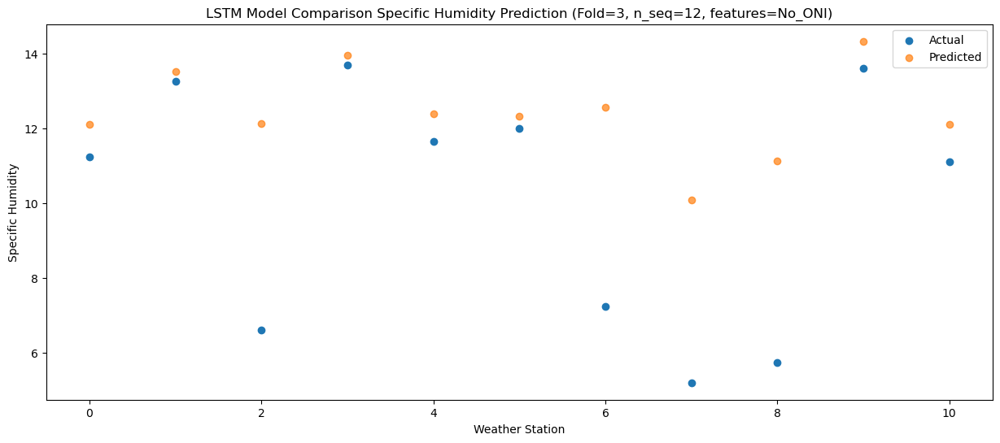

Predictions for (t+9):
    Weather_Station  Actual  Predicted
0                 0    9.19   9.723189
1                 1   11.08  11.131936
2                 2    5.46   9.746971
3                 3   11.64  11.573740
4                 4    9.70  10.000202
5                 5   10.39   9.933713
6                 6    6.15  10.182362
7                 7    4.10   7.702548
8                 8    4.70   8.731475
9                 9   11.07  11.941377
10               10    9.22   9.719519


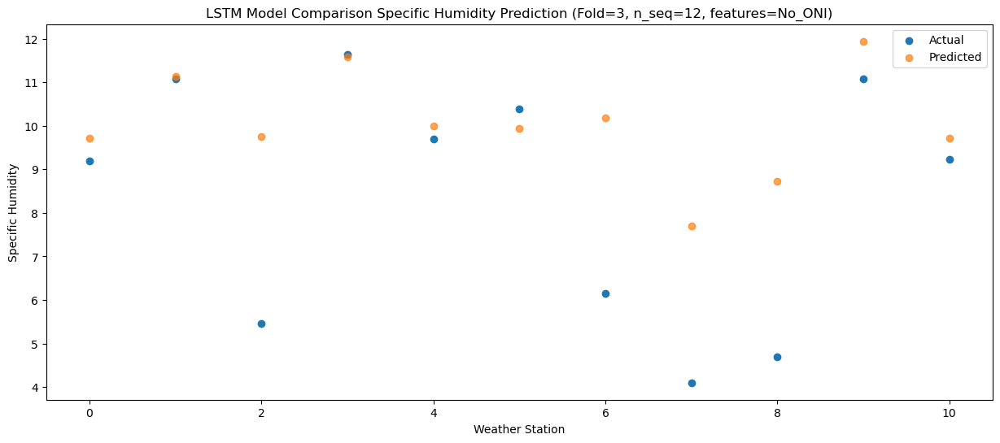

Predictions for (t+10):
    Weather_Station  Actual  Predicted
0                 0    3.69   4.214505
1                 1    6.65   5.624031
2                 2    6.04   4.243747
3                 3    5.95   6.065914
4                 4    4.58   4.486765
5                 5    4.52   4.418634
6                 6    5.44   4.673797
7                 7    2.83   2.196661
8                 8    4.92   3.226281
9                 9    6.54   6.432819
10               10    4.30   4.209447


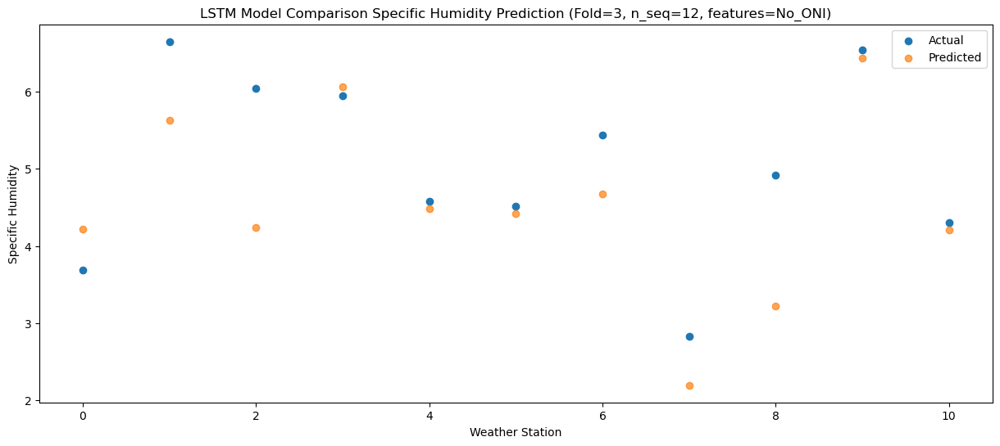

Predictions for (t+11):
    Weather_Station  Actual  Predicted
0                 0    5.64   6.325340
1                 1    7.62   7.734775
2                 2    4.54   6.351242
3                 3    7.09   8.175243
4                 4    5.28   6.594133
5                 5    5.57   6.524751
6                 6    4.73   6.781710
7                 7    2.97   4.304219
8                 8    3.67   5.332581
9                 9    6.24   8.540498
10               10    4.20   6.315634


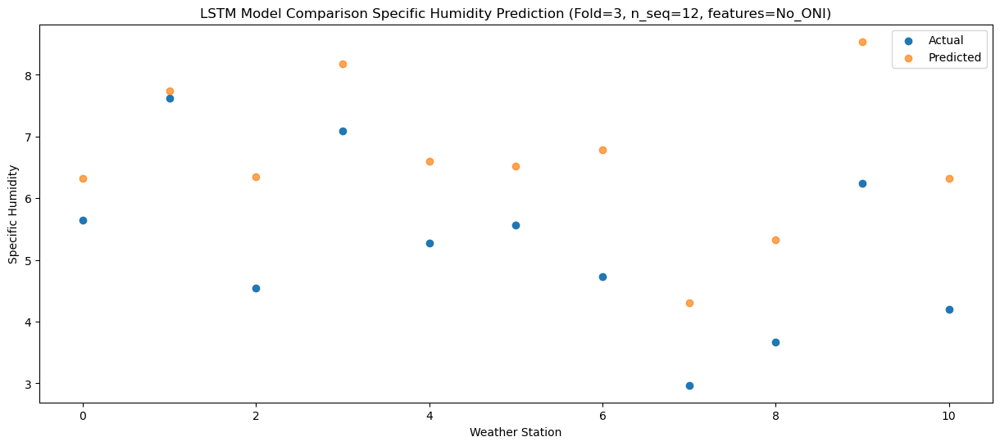

f, t:
[[ 3.58  5.02  4.17  5.29  3.79  3.62  4.35  2.5   3.4   4.84  3.02]
 [ 3.67  4.46  4.11  5.22  2.96  3.1   4.41  2.02  3.05  4.99  2.88]
 [ 5.32  6.97  4.19  6.52  5.44  5.13  4.72  2.32  2.7   5.77  4.16]
 [ 5.84  8.14  4.81  7.71  6.5   6.43  5.19  2.01  3.63  7.15  5.57]
 [ 8.62 11.66  5.21 10.24  8.92  8.67  6.59  2.57  4.07  8.72  7.16]
 [13.34 16.19  7.66 15.66 13.38 13.89  7.92  3.99  5.5  13.62 12.03]
 [14.58 17.07  8.36 16.29 15.33 15.14 10.37  9.35  5.98 15.83 13.72]
 [14.85 17.24  7.89 17.17 15.42 15.31  8.94  6.92  6.37 16.21 14.04]
 [11.23 13.27  6.6  13.7  11.65 12.01  7.24  5.2   5.73 13.61 11.12]
 [ 9.19 11.08  5.46 11.64  9.7  10.39  6.15  4.1   4.7  11.07  9.22]
 [ 3.69  6.65  6.04  5.95  4.58  4.52  5.44  2.83  4.92  6.54  4.3 ]
 [ 5.64  7.62  4.54  7.09  5.28  5.57  4.73  2.97  3.67  6.24  4.2 ]]
[[ 3.6289164   5.03075765  3.65376968  5.47965455  3.91157411  3.85371699
   4.10670243  1.61532331  2.6531084   5.8539379   3.6315277 ]
 [ 3.67787973  5.07988726  3

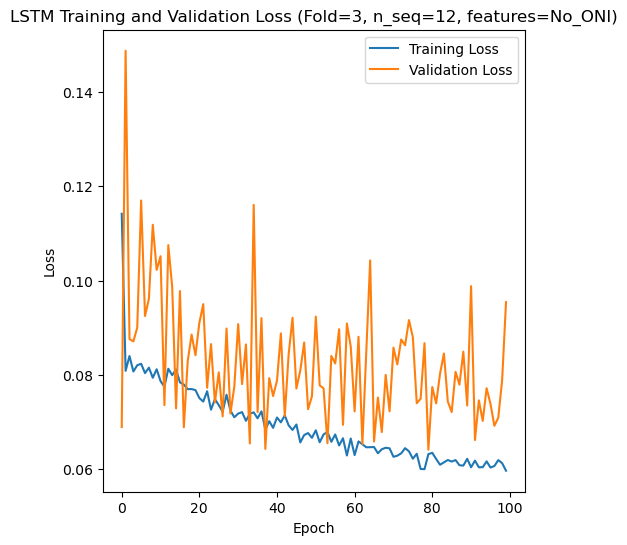

[[ 3.4   2.19  4.28 ... 10.54  6.41  5.39]
 [ 7.94  7.22  7.86 ... 18.27 13.85 11.85]
 [ 5.92  4.91  6.84 ... 14.38  9.59 10.48]
 ...
 [ 3.92  3.    4.93 ... 11.51  7.19  6.46]
 [ 3.98  2.61  4.   ... 10.23  6.65  5.8 ]
 [ 3.84  2.35  4.25 ... 10.6   6.5   5.9 ]]
Epoch 1/100
84/84 [==============================] - 45s 351ms/step - loss: 0.1151 - accuracy: 0.5357 - mae: 0.0929 - rmse: 0.1151 - mape: 21.1339 - pearson: 0.6419 - val_loss: 0.0858 - val_accuracy: 0.0000e+00 - val_mae: 0.0698 - val_rmse: 0.0858 - val_mape: 16.4236 - val_pearson: 0.6277
Epoch 2/100
84/84 [==============================] - 22s 264ms/step - loss: 0.0871 - accuracy: 0.5833 - mae: 0.0699 - rmse: 0.0871 - mape: 15.7065 - pearson: 0.6872 - val_loss: 0.0882 - val_accuracy: 0.0000e+00 - val_mae: 0.0744 - val_rmse: 0.0882 - val_mape: 16.8667 - val_pearson: 0.7387
Epoch 3/100
84/84 [==============================] - 23s 273ms/step - loss: 0.0836 - accuracy: 0.6310 - mae: 0.0666 - rmse: 0.0836 - mape: 15.0255 - pearson

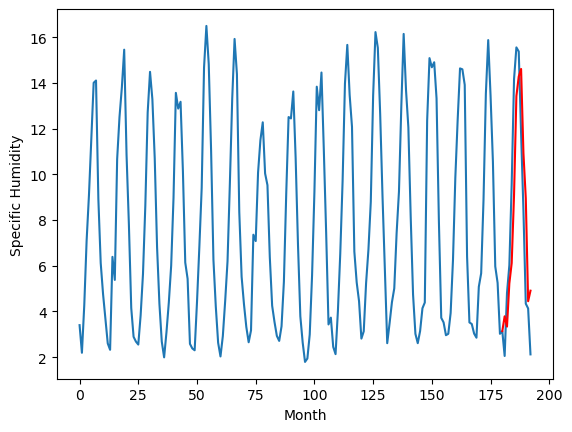

Weather Station 2:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.75		3.35		-0.40
5.74		2.90		-2.84
5.71		4.79		-0.92
6.46		5.68		-0.78
7.79		8.67		0.88
12.08		12.99		0.91
13.29		13.85		0.56
13.68		14.18		0.50
12.88		10.49		-2.39
9.96		8.52		-1.44
5.30		4.01		-1.29
7.04		4.48		-2.56
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[7.79, 3.3481984600424766, 2.899465964734554, 4.78838317245245, 5.67950718253851, 8.672265456616879, 12.991164134442807, 13.851917491853238, 14.178065524995327, 10.494844184815884, 8.51738058179617, 4.008478032052517, 4.4779464766383175]


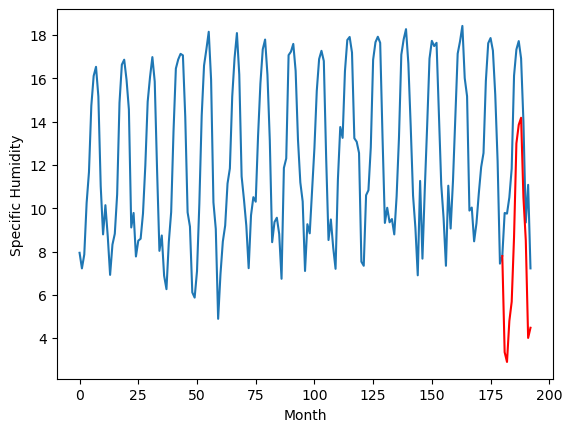

Weather Station 3:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
7.83		7.89		0.06
7.71		7.44		-0.27
10.77		9.33		-1.44
11.02		10.23		-0.79
14.46		13.22		-1.24
18.70		17.54		-1.16
20.35		18.40		-1.95
20.36		18.73		-1.63
17.42		15.04		-2.38
14.64		13.07		-1.57
9.20		8.55		-0.65
12.15		9.02		-3.13
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[5.03, 7.888530070483685, 7.4440862485766415, 9.334487492740156, 10.226543481051923, 13.218771989047529, 17.540253693759443, 18.3979481408, 18.726851517856122, 15.04437308996916, 13.065503771007062, 8.554876024425031, 9.024612272679807]


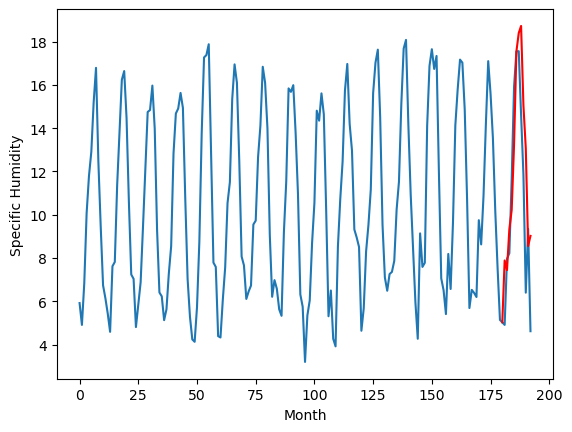

Weather Station 4:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.81		5.87		0.06
5.49		5.42		-0.07
8.15		7.32		-0.83
9.44		8.21		-1.23
13.44		11.20		-2.24
17.13		15.52		-1.61
17.70		16.38		-1.32
18.09		16.71		-1.38
14.08		13.03		-1.05
11.23		11.05		-0.18
7.61		6.55		-1.06
9.47		7.02		-2.45
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[4.41, 5.869357155710459, 5.422409819513559, 7.31827824011445, 8.210004555135965, 11.203473554998636, 15.52442453995347, 16.382523106485607, 16.71101947322488, 13.031504111438991, 11.054032759815456, 6.547708468586208, 7.0164595712721365]


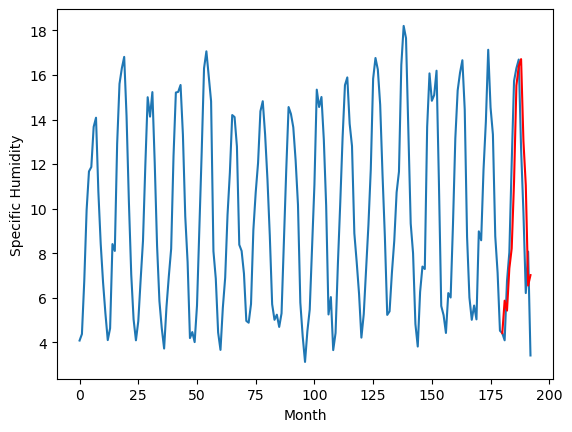

Weather Station 5:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.04		4.03		-0.01
3.59		3.58		-0.01
6.17		5.48		-0.69
7.53		6.37		-1.16
11.82		9.36		-2.46
15.70		13.69		-2.01
16.08		14.54		-1.54
16.19		14.87		-1.32
12.29		11.19		-1.10
9.56		9.22		-0.34
5.95		4.71		-1.24
7.36		5.18		-2.18
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[4.29, 4.028344931006432, 3.580506713986397, 5.480027588009834, 6.372106822133064, 9.364755900502205, 13.68610742866993, 14.544795723557472, 14.874124498963356, 11.194604368805885, 9.215278835892677, 4.7118260580301286, 5.1810992377996445]


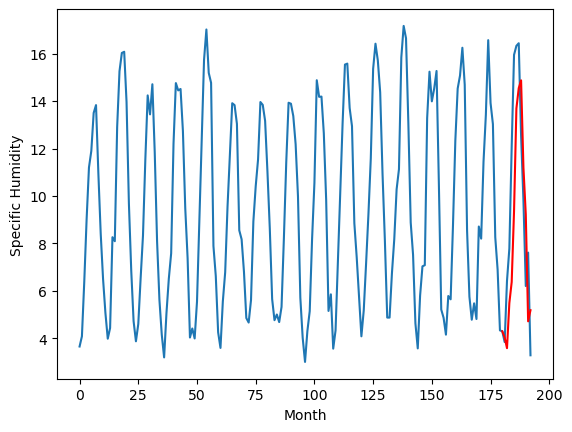

Weather Station 6:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.35		3.60		-0.75
3.71		3.15		-0.56
5.20		5.05		-0.15
6.16		5.94		-0.22
10.71		8.93		-1.78
13.01		13.25		0.24
14.04		14.11		0.07
13.76		14.44		0.68
10.51		10.76		0.25
7.46		8.78		1.32
5.74		4.27		-1.47
4.89		4.74		-0.15
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[3.47, 3.598276288807392, 3.1486654594540595, 5.047348172962666, 5.939677806198597, 8.930597396194935, 13.25018415004015, 14.1094941213727, 14.439660133421421, 10.759640277922154, 8.778492273390293, 4.274759592115879, 4.743461371958256]


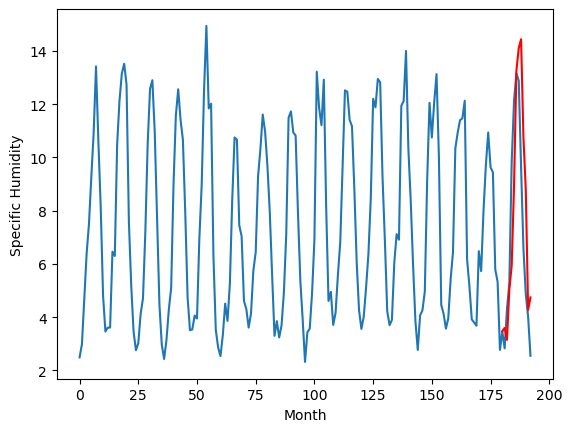

Weather Station 7:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
2.37		2.44		0.07
2.62		1.99		-0.63
4.33		3.89		-0.44
4.74		4.78		0.04
7.72		7.77		0.05
12.41		12.09		-0.32
14.01		12.95		-1.06
14.39		13.28		-1.11
10.81		9.59		-1.22
8.60		7.61		-0.99
2.88		3.10		0.22
4.74		3.57		-1.17
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[4.52, 2.438623847216368, 1.9916054622828963, 3.8854880945384505, 4.77955502435565, 7.768244208544493, 12.08906167909503, 12.948539854735136, 13.277387173622847, 9.59467366501689, 7.613746078461409, 3.1034945563972, 3.574985535591841]


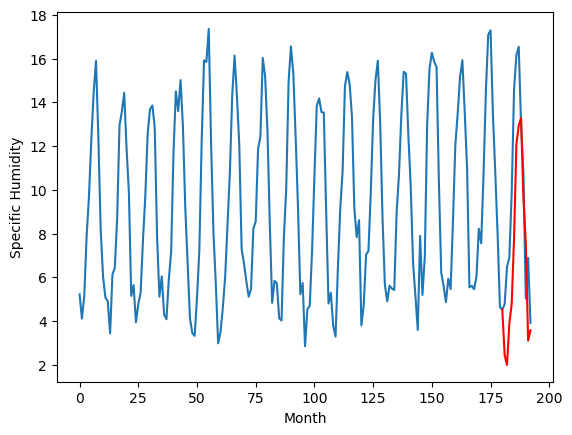

Weather Station 8:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.07		5.17		0.10
4.44		4.72		0.28
6.81		6.62		-0.19
7.73		7.51		-0.22
10.89		10.50		-0.39
15.49		14.82		-0.67
16.44		15.68		-0.76
16.18		16.01		-0.17
12.92		12.32		-0.60
10.83		10.34		-0.49
6.14		5.84		-0.30
7.61		6.31		-1.30
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[3.4, 5.170825221836567, 4.72240645557642, 6.618542620241642, 7.512743898928165, 10.501925179064273, 14.820589729845523, 15.677851089537143, 16.00659204393625, 12.324282654821872, 10.34446204572916, 5.835884222090243, 6.305443563759326]


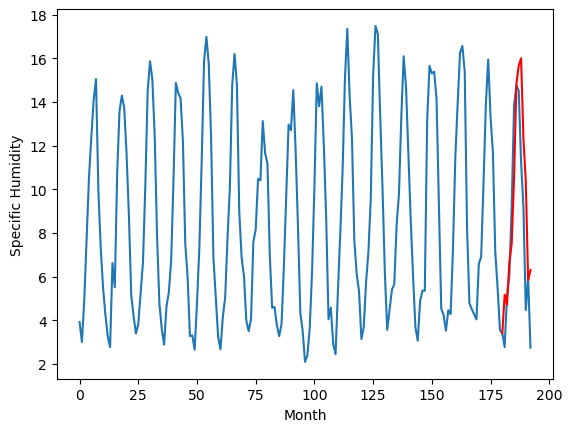

Weather Station 9:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.57		3.87		0.30
3.00		3.42		0.42
4.94		5.32		0.38
6.27		6.21		-0.06
8.56		9.20		0.64
13.62		13.52		-0.10
14.88		14.38		-0.50
15.02		14.71		-0.31
11.54		11.02		-0.52
10.39		9.04		-1.35
4.62		4.53		-0.09
5.33		5.00		-0.33
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.82, 3.8702422511577605, 3.42222709774971, 5.316913081407547, 6.212801409959793, 9.200691891908646, 13.521421624422073, 14.377283049821854, 14.707556380033493, 11.022261751890182, 9.041799200773239, 4.52996076464653, 4.9966893327236175]


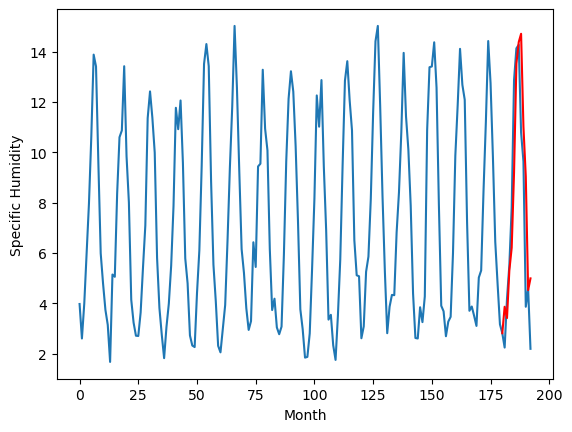

Weather Station 10:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.66		3.93		0.27
3.02		3.48		0.46
5.39		5.37		-0.02
6.70		6.27		-0.43
9.32		9.26		-0.06
14.07		13.58		-0.49
15.47		14.43		-1.04
15.72		14.76		-0.96
11.69		11.08		-0.61
9.82		9.10		-0.72
4.53		4.59		0.06
5.07		5.05		-0.02
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.86, 3.9312317553162575, 3.4822822096943855, 5.374229359924794, 6.268887985050679, 9.257786023914814, 13.576920736134053, 14.43029652863741, 14.761820870935917, 11.075963098108769, 9.097313243448735, 4.585084277689457, 5.050422627031804]


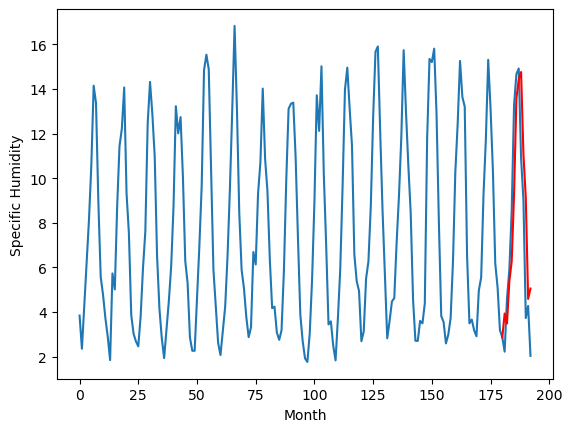

Weather Station 11:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.46		3.79		0.33
2.89		3.34		0.45
4.18		5.23		1.05
5.85		6.13		0.28
7.45		9.11		1.66
12.46		13.43		0.97
13.73		14.29		0.56
14.60		14.62		0.02
10.84		10.93		0.09
9.83		8.95		-0.88
4.59		4.44		-0.15
4.55		4.90		0.35
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.61, 3.7890033127367495, 3.3392469884455203, 5.2302118541300295, 6.126075089126825, 9.112860739380121, 13.432158529907465, 14.287466943413019, 14.617432832866907, 10.932549476772547, 8.953854203373194, 4.440816998630762, 4.904344558864832]


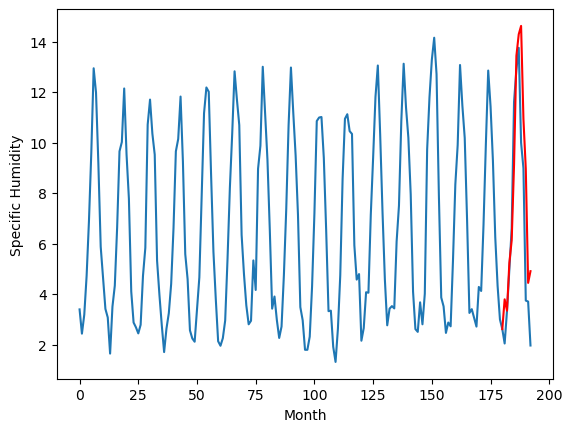

Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    3.96   3.788864
1                 1    3.75   3.348198
2                 2    7.83   7.888530
3                 3    5.81   5.869357
4                 4    4.04   4.028345
5                 5    4.35   3.598276
6                 6    2.37   2.438624
7                 7    5.07   5.170825
8                 8    3.57   3.870242
9                 9    3.66   3.931232
10               10    3.46   3.789003


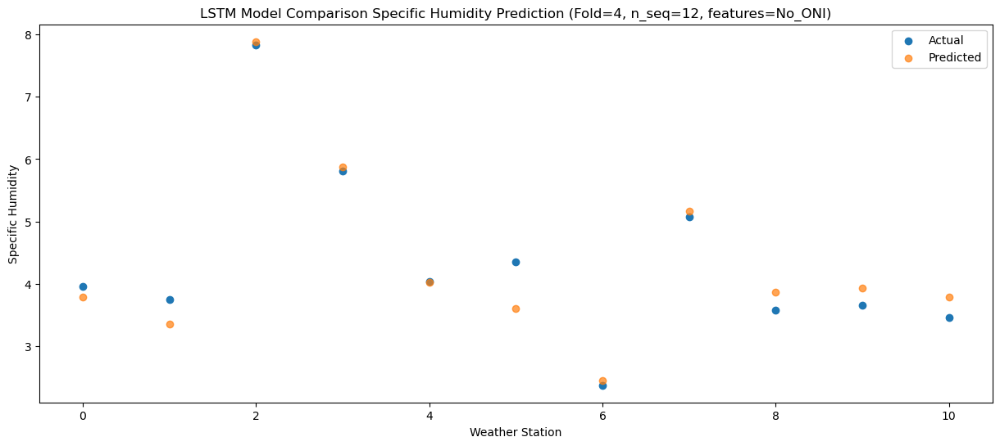

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    2.87   3.336793
1                 1    5.74   2.899466
2                 2    7.71   7.444086
3                 3    5.49   5.422410
4                 4    3.59   3.580507
5                 5    3.71   3.148665
6                 6    2.62   1.991605
7                 7    4.44   4.722406
8                 8    3.00   3.422227
9                 9    3.02   3.482282
10               10    2.89   3.339247


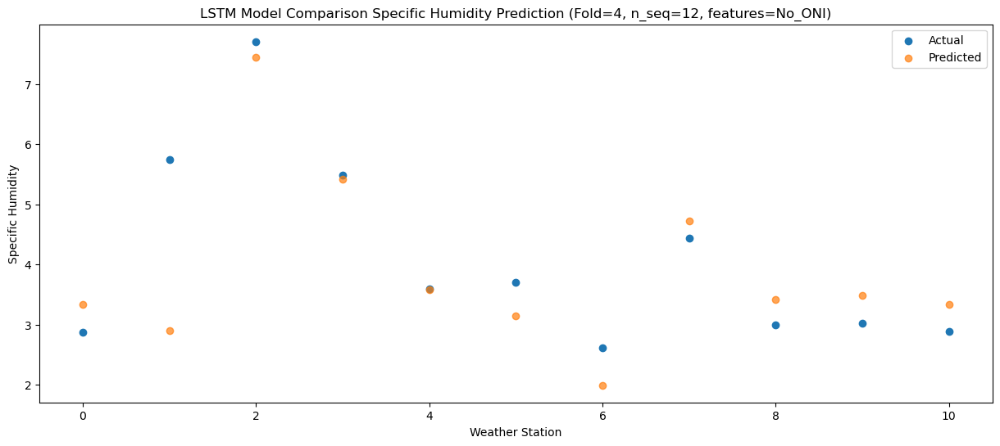

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0    5.63   5.227665
1                 1    5.71   4.788383
2                 2   10.77   9.334487
3                 3    8.15   7.318278
4                 4    6.17   5.480028
5                 5    5.20   5.047348
6                 6    4.33   3.885488
7                 7    6.81   6.618543
8                 8    4.94   5.316913
9                 9    5.39   5.374229
10               10    4.18   5.230212


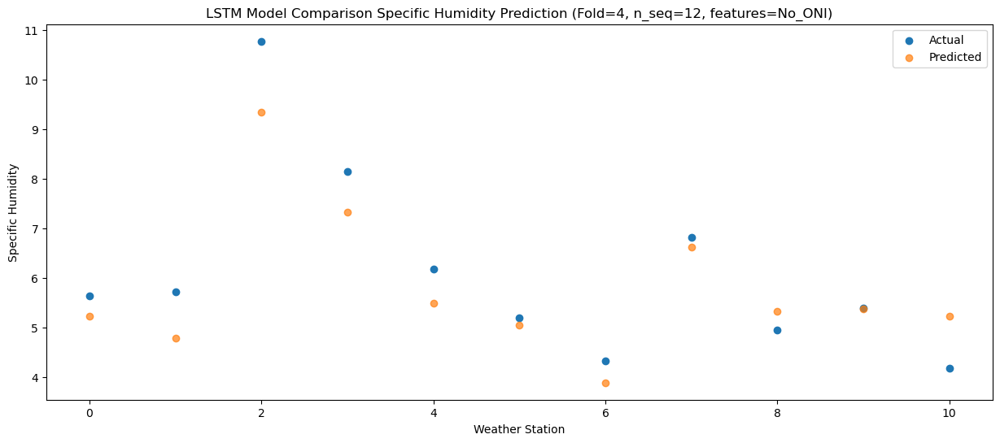

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0    6.84   6.117329
1                 1    6.46   5.679507
2                 2   11.02  10.226543
3                 3    9.44   8.210005
4                 4    7.53   6.372107
5                 5    6.16   5.939678
6                 6    4.74   4.779555
7                 7    7.73   7.512744
8                 8    6.27   6.212801
9                 9    6.70   6.268888
10               10    5.85   6.126075


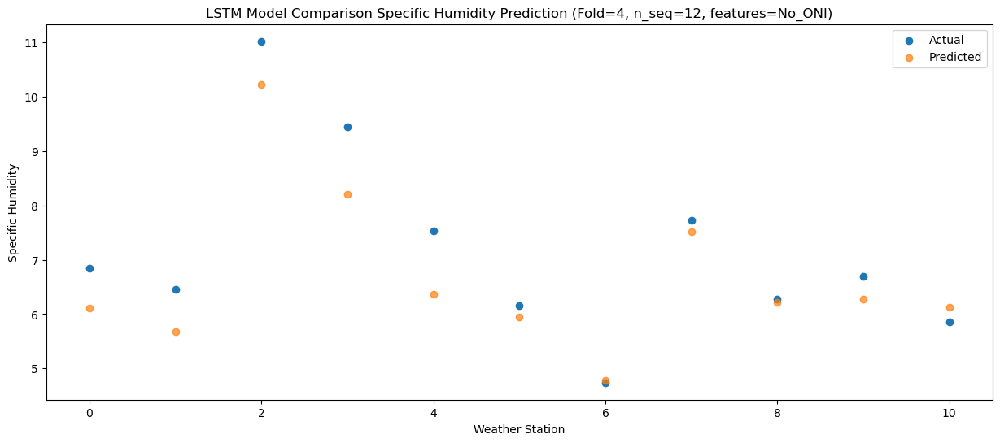

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0   10.40   9.108567
1                 1    7.79   8.672265
2                 2   14.46  13.218772
3                 3   13.44  11.203474
4                 4   11.82   9.364756
5                 5   10.71   8.930597
6                 6    7.72   7.768244
7                 7   10.89  10.501925
8                 8    8.56   9.200692
9                 9    9.32   9.257786
10               10    7.45   9.112861


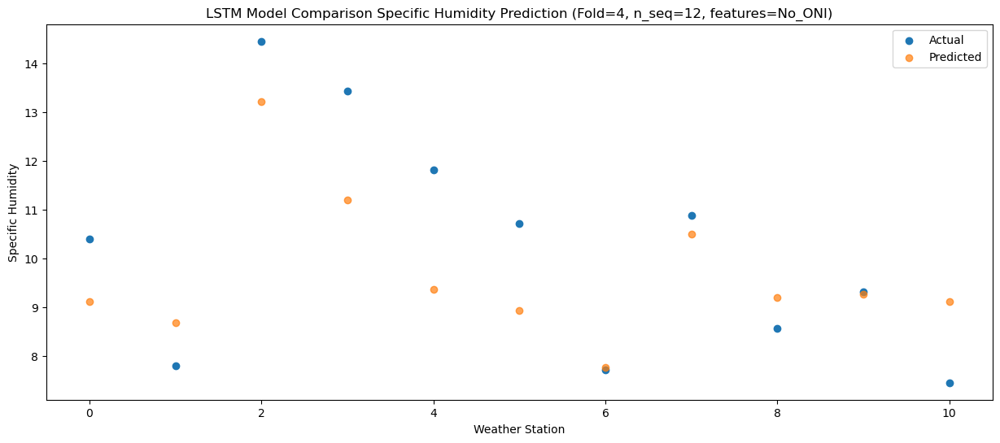

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   14.99  13.426858
1                 1   12.08  12.991164
2                 2   18.70  17.540254
3                 3   17.13  15.524425
4                 4   15.70  13.686107
5                 5   13.01  13.250184
6                 6   12.41  12.089062
7                 7   15.49  14.820590
8                 8   13.62  13.521422
9                 9   14.07  13.576921
10               10   12.46  13.432159


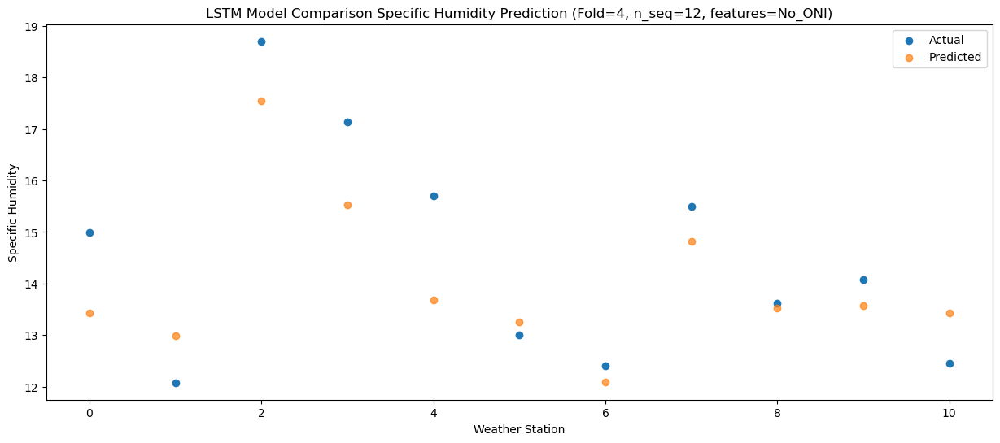

Predictions for (t+6):
    Weather_Station  Actual  Predicted
0                 0   16.38  14.284773
1                 1   13.29  13.851917
2                 2   20.35  18.397948
3                 3   17.70  16.382523
4                 4   16.08  14.544796
5                 5   14.04  14.109494
6                 6   14.01  12.948540
7                 7   16.44  15.677851
8                 8   14.88  14.377283
9                 9   15.47  14.430297
10               10   13.73  14.287467


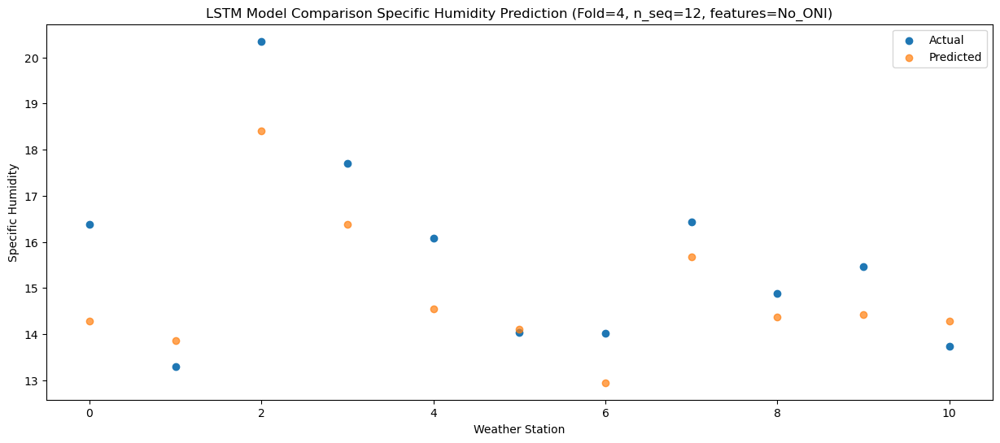

Predictions for (t+7):
    Weather_Station  Actual  Predicted
0                 0   16.20  14.615015
1                 1   13.68  14.178066
2                 2   20.36  18.726852
3                 3   18.09  16.711019
4                 4   16.19  14.874124
5                 5   13.76  14.439660
6                 6   14.39  13.277387
7                 7   16.18  16.006592
8                 8   15.02  14.707556
9                 9   15.72  14.761821
10               10   14.60  14.617433


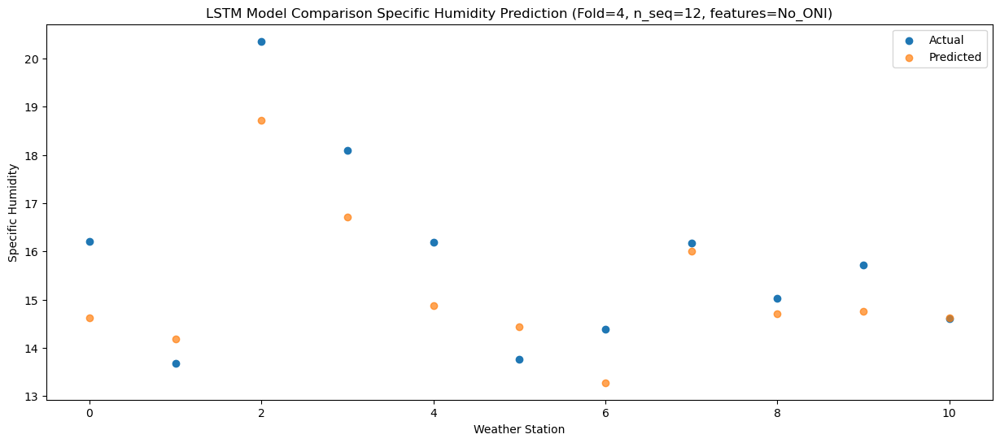

Predictions for (t+8):
    Weather_Station  Actual  Predicted
0                 0   12.62  10.932432
1                 1   12.88  10.494844
2                 2   17.42  15.044373
3                 3   14.08  13.031504
4                 4   12.29  11.194604
5                 5   10.51  10.759640
6                 6   10.81   9.594674
7                 7   12.92  12.324283
8                 8   11.54  11.022262
9                 9   11.69  11.075963
10               10   10.84  10.932549


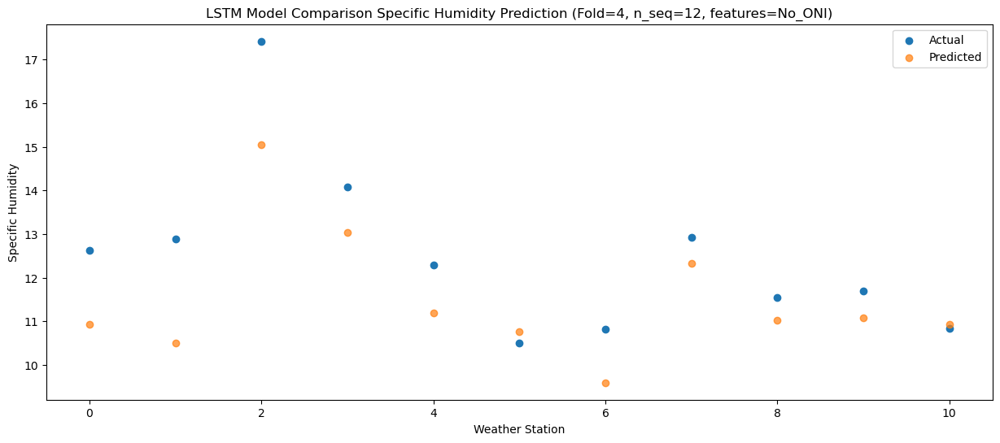

Predictions for (t+9):
    Weather_Station  Actual  Predicted
0                 0    9.25   8.952369
1                 1    9.96   8.517381
2                 2   14.64  13.065504
3                 3   11.23  11.054033
4                 4    9.56   9.215279
5                 5    7.46   8.778492
6                 6    8.60   7.613746
7                 7   10.83  10.344462
8                 8   10.39   9.041799
9                 9    9.82   9.097313
10               10    9.83   8.953854


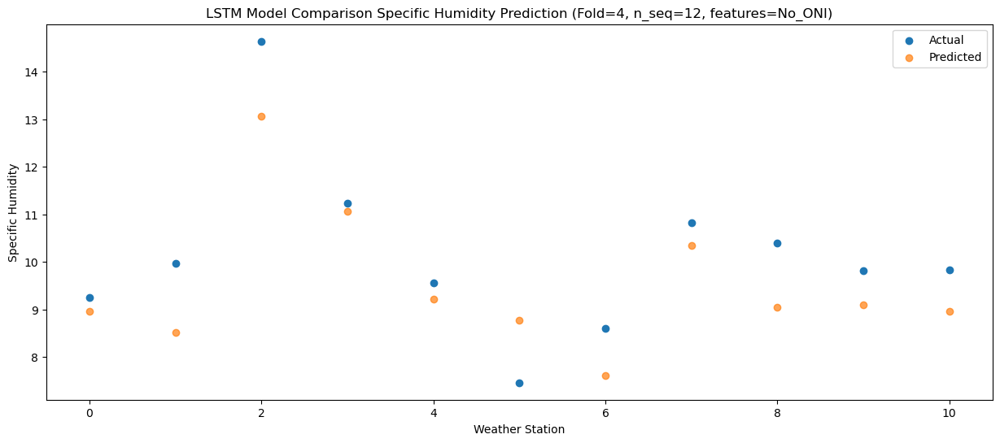

Predictions for (t+10):
    Weather_Station  Actual  Predicted
0                 0    5.16   4.447279
1                 1    5.30   4.008478
2                 2    9.20   8.554876
3                 3    7.61   6.547708
4                 4    5.95   4.711826
5                 5    5.74   4.274760
6                 6    2.88   3.103495
7                 7    6.14   5.835884
8                 8    4.62   4.529961
9                 9    4.53   4.585084
10               10    4.59   4.440817


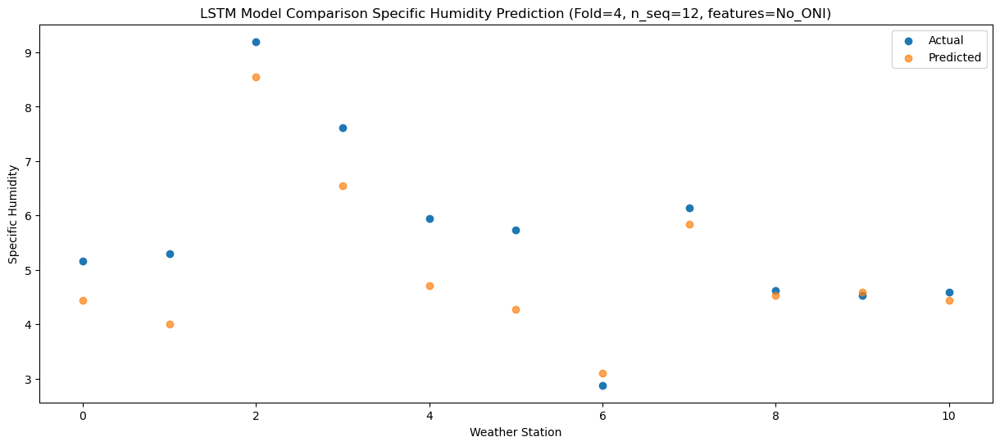

Predictions for (t+11):
    Weather_Station  Actual  Predicted
0                 0    4.95   4.909162
1                 1    7.04   4.477946
2                 2   12.15   9.024612
3                 3    9.47   7.016460
4                 4    7.36   5.181099
5                 5    4.89   4.743461
6                 6    4.74   3.574986
7                 7    7.61   6.305444
8                 8    5.33   4.996689
9                 9    5.07   5.050423
10               10    4.55   4.904345


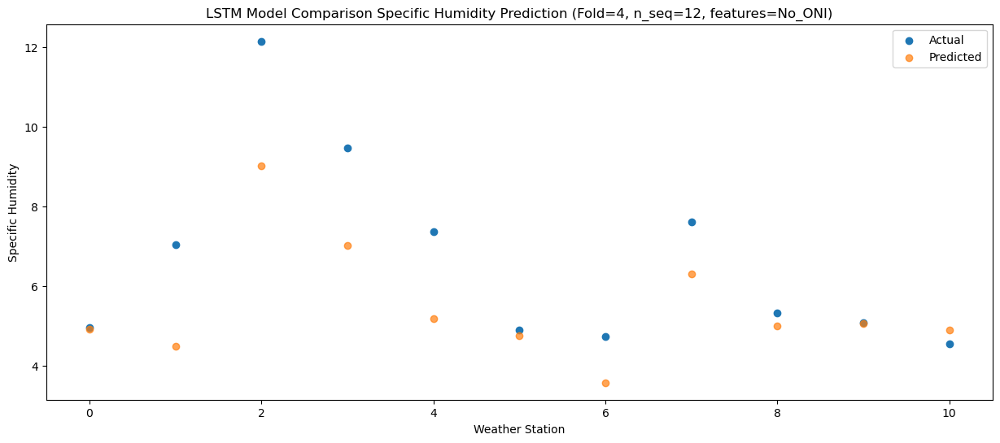

f, t:
[[ 3.96  3.75  7.83  5.81  4.04  4.35  2.37  5.07  3.57  3.66  3.46]
 [ 2.87  5.74  7.71  5.49  3.59  3.71  2.62  4.44  3.    3.02  2.89]
 [ 5.63  5.71 10.77  8.15  6.17  5.2   4.33  6.81  4.94  5.39  4.18]
 [ 6.84  6.46 11.02  9.44  7.53  6.16  4.74  7.73  6.27  6.7   5.85]
 [10.4   7.79 14.46 13.44 11.82 10.71  7.72 10.89  8.56  9.32  7.45]
 [14.99 12.08 18.7  17.13 15.7  13.01 12.41 15.49 13.62 14.07 12.46]
 [16.38 13.29 20.35 17.7  16.08 14.04 14.01 16.44 14.88 15.47 13.73]
 [16.2  13.68 20.36 18.09 16.19 13.76 14.39 16.18 15.02 15.72 14.6 ]
 [12.62 12.88 17.42 14.08 12.29 10.51 10.81 12.92 11.54 11.69 10.84]
 [ 9.25  9.96 14.64 11.23  9.56  7.46  8.6  10.83 10.39  9.82  9.83]
 [ 5.16  5.3   9.2   7.61  5.95  5.74  2.88  6.14  4.62  4.53  4.59]
 [ 4.95  7.04 12.15  9.47  7.36  4.89  4.74  7.61  5.33  5.07  4.55]]
[[ 3.78886409  3.34819846  7.88853007  5.86935716  4.02834493  3.59827629
   2.43862385  5.17082522  3.87024225  3.93123176  3.78900331]
 [ 3.33679329  2.89946596  7

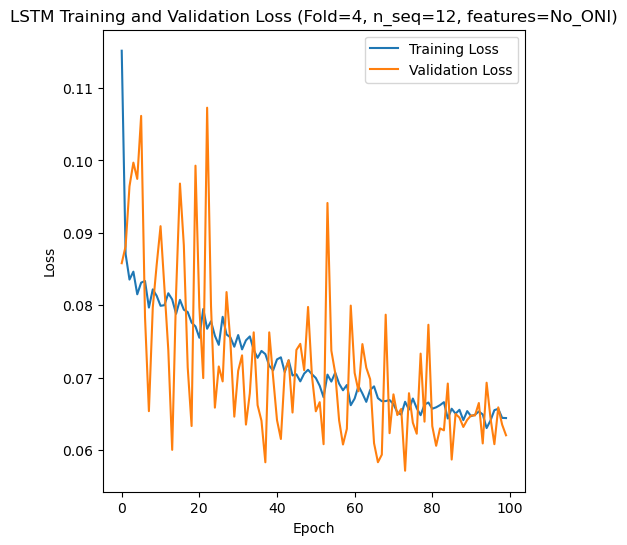

[[1.0473938609342879], [1.308245695328331], [1.6180448171249415], [2.6274508411493462], [1.0721614148166385]]
[[array(1.04739386)], [array(1.3082457)], [array(1.61804482)], [array(2.62745084)], [array(1.07216141)]]
[[0.7948461220481174], [1.0044622738484417], [1.1952896125659798], [1.681711370345544], [0.8154986294042885]]
[[0.07929398189855434], [0.11710253946852904], [0.1459403417262856], [0.2971212086629542], [0.09224214387932804]]
[[0.9474089528954835], [0.9181424598843604], [0.867339625792499], [0.5955685434617273], [0.9448913793669147]]
[[array(0.07929398)], [array(0.11710254)], [array(0.14594034)], [array(0.29712121)], [array(0.09224214)]]
[[array(0.96414078)], [array(0.95469331)], [array(0.87548062)], [array(0.75734298)], [array(0.96345698)]]
[ 3.9   3.41  6.58  6.97 10.12 14.93 15.96 16.01 12.59 10.41  5.11  7.89
  5.74  6.45  8.66  8.88 11.37 16.12 16.92 17.08 14.92 11.84  6.18  9.82
  8.41  8.56 10.41 10.65 13.41 18.03 19.94 20.14 17.14 14.42  8.55 10.95
  5.55  5.46  8.91  

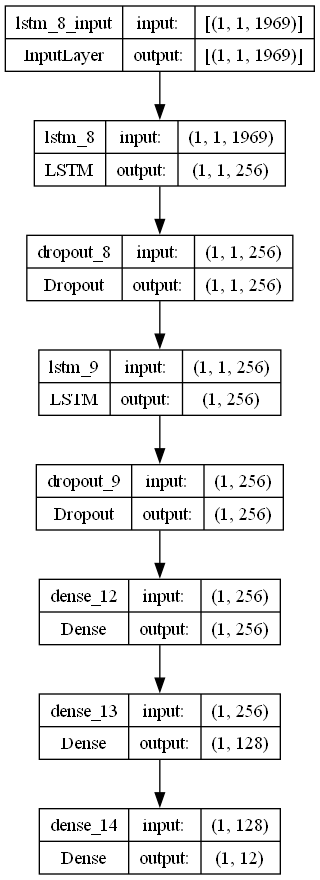

In [2]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error, r2_score
from tensorflow.keras.utils import plot_model

def rmse (y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))

def kmape (y_true, y_pred):
    return K.mean(K.sqrt(K.square(y_true - y_pred))/y_true)
    
def kpearson (y_true, y_pred):
    mean_true = K.mean(y_true)
    mean_pred = K.mean(y_pred)
    return (K.square(K.mean((y_true - mean_true)*(y_pred - mean_pred))))/(K.mean(K.square(y_true - mean_true))*K.mean(K.square(y_pred - mean_pred)))

# fit the best LSTM model using parameters found by Optuna
def create_best_model(X, y, n_lag, n_seq, n_batch, nb_epoch):
    
    #Parameters:
    #trial (array-like): Optuna parameters.
    #train (array-like): Target values.
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations
    #nb_epoch (int): Maximum number of epochs
    
    # Hyperparameters from the best model
    lr = 0.026818099745858137
    optimizer = SGD(learning_rate = lr)
    activation_function = 'sigmoid'
    lstm_units = 256
    dropout_rate = 0.4597414198770463

    # design network
    model = Sequential()
    model.add(LSTM(lstm_units, return_sequences=True, batch_input_shape=(n_batch, X.shape[1], X.shape[2]), stateful=True))
    model.add(Dropout(dropout_rate))
    model.add(LSTM(lstm_units))
    model.add(Dropout(dropout_rate))
    model.add(Dense(256, input_dim=y.shape[1], activation=activation_function))
    model.add(Dense(128, activation=activation_function))
    model.add(Dense(n_seq))
    model.compile(loss=rmse, optimizer=optimizer, metrics=['accuracy', 'mae', rmse, mape, pearson])
        
    return model

# Make one forecast with LSTM
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def forecast_lstm(model, X, n_seq, n_test):
    # reshape input pattern to [samples, timesteps, features]
    X = X.reshape(1, 1, X.shape[1])
    # make forecast
    forecast = model.predict(X)
    # convert to array
    return forecast
     
# Evaluate the persistence model
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def make_forecasts(model, X_test, y_test, n_lag, n_seq, n_test):
    forecasts = list()
    for i in range(len(X_test)):
        X, y = X_test[i, :], y_test[i, :]
        # make forecast
        forecast = forecast_lstm(model, X, n_seq, n_test)
        # store the forecast
        forecasts.append(forecast)
    return forecasts
     
# Invert differenced forecast
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_difference(last_ob, forecast):
    # Invert the first forecast
    inverted = list()
    inverted.append(forecast[0] + last_ob)
    # Propagate the difference forecast using the inverted first value
    for i in range(1, len(forecast)):
        inverted.append(forecast[i] + inverted[i-1])
    return inverted
     
# Inverse data transform on forecasts
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_transform(series, forecasts, scaler, n_test, n_seq):
    inverted = list()
    for i in range(len(forecasts)):
        # create an array from the forecast
        forecast = forecasts[i]
        forecast = forecast.reshape(1, n_seq)
        # invert scaling
        inv_scale = scaler.inverse_transform(forecast)
        inv_scale = inv_scale[0, :]
        # invert differencing
        index = len(series) - n_test + i
        last_ob = series.values[index]
        inv_diff = inverse_difference(last_ob, inv_scale)
        # store
        inverted.append(inv_diff)
    return inverted
     
# Evaluate the RMSE for each forecast time step
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def evaluate_forecasts(actual, forecasts, n_lag, n_seq):

    t = np.array(actual).transpose()
    f = np.array(forecasts).transpose()

    print("f, t:")
    print(t)
    print(f)
    rmse_list = []
    mae_list = []
    skmape_list = []
    mape_list = []
    r2_list = []
    pearson_list = []
    actual_list = []

    for i in range(n_seq):
        act = [row for row in t[i]]
        predicted = [forecast for forecast in f[i]]
        rmse1 = sqrt(mean_squared_error(act, predicted))
        rmse2 = np.array(rmse(tf.convert_to_tensor(np.array(act)), tf.convert_to_tensor(np.array(predicted))))
        mae = mean_absolute_error(act, predicted)
        mse = mean_squared_error(act, predicted)
        skmape = mean_absolute_percentage_error(act, predicted)
        kmape1 = np.array(kmape(tf.convert_to_tensor(np.array(act)), tf.convert_to_tensor(np.array(predicted))))
        kpearson1 = np.array(kpearson(tf.convert_to_tensor(np.array(act)), tf.convert_to_tensor(np.array(predicted))))
        r2 = r2_score(act, predicted) 
        avg_actual = np.mean(act)
        print("Year at t+"+str(i+1)+":")
        print('t+%d SKRMSE: %f' % ((i+1), rmse1))
        print('t+%d KRMSE: %f' % ((i+1), rmse2))        
        print('t+%d MAE: %f' % ((i+1), mae))
        print('t+%d SKMAPE: %f' % ((i+1), skmape))
        print('t+%d R2_SCORE: %f' % ((i+1), r2))
        print('t+%d KMAPE: %f' % ((i+1), kmape1))
        print('t+%d PEARSON: %f' % ((i+1), kpearson1))
        print('t+%d AVERAGE ACTUAL: %f' % ((i+1), avg_actual))

    y_true = tf.convert_to_tensor(np.array(actual).flatten())
    y_pred = tf.convert_to_tensor(np.array(forecasts).flatten())

    rmse1 = sqrt(mean_squared_error(np.array(y_true), np.array(y_pred)))
    rmse2 = np.array(rmse(y_true, y_pred))
    mae = mean_absolute_error(np.array(y_true), np.array(y_pred))
    mse = mean_squared_error(np.array(y_true), np.array(y_pred))
    skmape = mean_absolute_percentage_error(np.array(y_true), np.array(y_pred))
    kmape1 = np.array(kmape(y_true, y_pred))
    kpearson1 = np.array(kpearson(y_true, y_pred))
    r2 = r2_score(np.array(y_true), np.array(y_pred)) 
    avg_actual = np.mean(np.array(y_true))
    rmse1_list.append(rmse1)
    rmse2_list.append(rmse2)
    mae_list.append(mae)
    skmape_list.append(skmape)
    pearson_list.append(kpearson1)
    mape_list.append(kmape1)
    r2_list.append(r2)
    actual_list.append(avg_actual)
    print("Metrics for this Fold:")
    print('SKRMSE: %f' % (rmse1))
    print('KRMSE: %f' % (rmse2))        
    print('MAE: %f' % (mae))
    print('SKMAPE: %f' % (skmape))
    print('R2_SCORE: %f' % (r2))
    print('KMAPE: %f' % (kmape1))
    print('PEARSON: %f' % (kpearson1))
    print('AVERAGE ACTUAL: %f' % (avg_actual))

    return rmse1_list, rmse2_list, mae_list, skmape_list, r2_list, mape_list, pearson_list, actual_list
     
# plot the forecasts in the context of the original dataset
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def plot_forecasts(series, forecasts, actual, n_test, n_seq, n_lag):
    # plot the entire dataset in blue
    plt.plot(series[:n_lag+2+len(forecasts)].values)
    # plot the forecasts in red
    off_s = n_lag + 1
    off_e = off_s + len(forecasts) + 1
    xaxis = [x for x in range(off_s, off_e)]
    yaxis = [series.values[off_s]] + forecasts
    print(xaxis)
    print(yaxis)
    plt.plot(xaxis, yaxis, color='red')
    plt.xlabel("Month")
    plt.ylabel("Specific Humidity")
    # show the plot
    plt.show()

n_batch = 1
n_test = 11
nb_epoch = 100
    
rmse1_avg_list = []
rmse2_avg_list = []
mae_avg_list = []
skmape_avg_list = []
r2_score_avg_list = []
mape_avg_list = []
pearson_avg_list = []
actual_avg_list = []
forecast_results = []
actual_results = []
    
for i in range(5):
    train1 = train[i]
    test1 = test[i]
    validation1 = validation[i]

    X = train1[:, 0:-n_seq]
    y = train1[:, -n_seq:]
    X_test = test1[:, 0:-n_seq]
    y_test = test1[:, -n_seq:]
    X_val = validation1[:, 0:-n_seq]
    y_val = validation1[:, -n_seq:]
    
    dataset_df = pd.DataFrame(val_y[i])
    dataset_df = dataset_df.iloc[0:10, :]
    dataset = dataset_df.values

    print(dataset)

    series = pd.Series(dataset[:, 0]) # Using first column (specific_humidity)

    X = X.reshape(X.shape[0], 1, X.shape[1])
    X1 = X_test
    X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])
    X_val = X_val.reshape(X_val.shape[0], 1, X_val.shape[1])

    best_model = create_best_model(X, y, n_lag, n_seq, n_batch, nb_epoch)
    history = best_model.fit(X, y, epochs=100, batch_size=n_batch, validation_data=(X_val, y_val))
    
    # Evaluate the model
    loss = best_model.evaluate(X_test, y_test, verbose=2)
    print(f'Test Loss: {loss}')

    # make forecasts
    forecasts = make_forecasts(best_model, X_test, y_test, n_lag, n_seq, n_test)
    
    # inverse transform forecasts and test
    forecasts = inverse_transform(series, forecasts, scaler[i], n_test, n_seq)
    actual = [row[-n_seq:] for row in test1]
    actual = inverse_transform(series, actual, scaler[i], n_test, n_seq)

    # Print out plots of actual and predicted values for weather stations
    ws = df.index[1:12]
    print(ws)
    a = []
    f = []
    for q in range(len(actual)):
        x = actual[q]
        a.append(x[0])
    for q in range(len(forecasts)):
        x = forecasts[q]
        f.append(x[0])
    print(a)
    print(f)
    # Create a DataFrame for plotting
    results_df = pd.DataFrame({
        'ws': ws,
        'Actual': a,
        'Predicted': f
    })

    print(results_df)
    
    print("Actual and Forecasts:")
    print(actual)
    print(forecasts)
    
    for j in range(11):
        print("Weather Station "+str(j+1)+":")
        print("Actual S.H.\tPredicted S.H.\tDifference")
        print("-----------\t--------------\t----------")
        for k in range(n_seq):
            diff = forecasts[j][k] - actual[j][k]
            print(f"{actual[j][k]:.2f}\t\t{forecasts[j][k]:.2f}\t\t{diff:.2f}")
    
        # plot forecasts
        dataset_df = pd.DataFrame(val_y[i])
        dataset_df = dataset_df.iloc[0:11, :]
        dataset_df = dataset_df.transpose()
        dataset = dataset_df.values

        series_ws = pd.Series(dataset[:, j]) # Using first column (temperatures)
        forecasts_ws = forecasts[j]
        actual_ws = actual[j]
        
        plot_forecasts(series_ws, forecasts_ws, actual_ws, n_test, n_seq, n_lag)

    for k in range(n_seq):
        print("Predictions for (t+"+str(k)+"):")
        # Print out plots of actual and predicted values for each weather station
        results = []

        # Create a DataFrame for plotting
        for j in range(11):
            results.append([j, actual[j][k], forecasts[j][k]])
               
        results_df = pd.DataFrame(results)
        results_df.columns = ['Weather_Station', 'Actual', 'Predicted']

        print(results_df)

        # Plotting the results
        plt.figure(figsize=(15, 6))
        plt.scatter(results_df['Weather_Station'], results_df['Actual'], label='Actual')
        plt.scatter(results_df['Weather_Station'], results_df['Predicted'], label='Predicted', alpha=0.7)
        title1='LSTM Model Comparison Specific Humidity Prediction (Fold='+str(i)+', n_seq='+str(n_seq)+', features=No_ONI)'
        plt.title(title1)
        plt.xlabel('Weather Station')
        plt.ylabel('Specific Humidity')
        plt.legend()
        plt.show()

    rmse1_list = [] # list stores sklearn's root mean squared errors for each future time prediction
    rmse2_list = [] # list stores root mean squared errors for each future time prediction
    mae_list = [] # list stores mean absolute errors for each future time prediction
    skmape_list = [] # list stores sklearn's mean squared percentage errors for each future time prediction
    r2_list = [] # list stores sklearn's r2 pearson values for each future time prediction
    mape_list = [] # list stores mean squared percentage errors for each future time prediction
    pearson_list = [] # list stores r2 pearson values for each future time prediction
    actual_list = [] # list stores average actual values for each future time prediction

    # evaluate forecasts
    rmse1_list, rmse2_list, mae_list, skmape_list, r2_list, mape_list, pearson_list, actual_list = evaluate_forecasts(actual, forecasts, n_lag, n_seq)

    rmse1_avg_list.append(rmse1_list)
    rmse2_avg_list.append(rmse2_list)
    mae_avg_list.append(mae_list)
    skmape_avg_list.append(skmape_list)
    r2_score_avg_list.append(r2_list)
    mape_avg_list.append(mape_list)
    pearson_avg_list.append(pearson_list)
    actual_avg_list.append(actual_list)
    forecast_results.append(forecasts)
    actual_results.append(actual)
            
    best_model.summary()

    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    title2 = 'LSTM Training and Validation Loss (Fold='+str(i)+', n_seq='+str(n_seq)+', features=No_ONI)'
    plt.title(title2)
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(loc='upper right')
    plt.show()

print(rmse1_avg_list)
print(rmse2_avg_list)
print(mae_avg_list)
print(skmape_avg_list)
print(r2_score_avg_list)
print(mape_avg_list)
print(pearson_avg_list)
print(np.array(actual_results).flatten())
print(np.array(forecast_results).flatten())
a2 = np.array(actual_results).flatten()
f2 = np.array(forecast_results).flatten()
p1 = np.array(pearson(tf.convert_to_tensor(a2), tf.convert_to_tensor(f2)))
print("Accuracy Results:")
print("RMSE for each fold:")
print(rmse1_avg_list)
print("Average SKRMSE:"+str(np.mean(rmse1_avg_list)))
print("Average KRMSE:"+str(np.mean(rmse2_avg_list)))
print("Average MAE:"+str(np.mean(mae_avg_list)))
print("Average SKMAPE:"+str(np.mean(skmape_avg_list)))
print("Average MAPE:"+str(np.mean(mape_avg_list)))
print("Average PEARSON:"+str(p1))
print("Average R2 Score:"+str(np.mean(r2_score_avg_list)))
print("")
print("Average Specific Humidity:"+str(np.mean(actual_avg_list)))
print("RMSE % of Specific Humidity:"+str(np.mean(rmse2_avg_list)/np.mean(actual_avg_list)))

# Plot model architecture
filename = "lstm_model_optimized_SH_S12_No_ONI.png"
plot_model(best_model, to_file=filename, show_shapes=True, show_layer_names=True)